In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ranzeet013/cervical-cancer-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/cervical-cancer-dataset


In [5]:
# Install required packages
!pip install pandas numpy matplotlib seaborn scikit-learn xgboost lightgbm catboost imbalanced-learn shap
!pip install plotly kaleido missingno pyod yellowbrick scikit-plot
!pip install sdv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.6/200.6 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 186.8/186.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.3/74.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.4/198.4 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 53.5 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━

In [6]:
# Import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
from scipy import stats
from scipy.stats import chi2_contingency, pointbiserialr
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, RFE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as ImbPipeline
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import shap
from pyod.models.iforest import IForest
from pyod.models.lof import LOF
from pyod.models.ocsvm import OCSVM
from sdv.single_table import GaussianCopulaSynthesizer
from sdv.metadata import SingleTableMetadata
import warnings
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

In [7]:
import pandas as pd

# Load the dataset from Kaggle input directory
file_path = "/kaggle/input/cervical-cancer-dataset/cervical-cancer_csv.csv"
df = pd.read_csv(file_path, na_values='?')

# Display basic information
print("Dataset Shape:", df.shape)

print("\nFirst 5 rows:")
print(df.head())

print("\nDataset Info:")
print(df.info())

print("\nTarget variable distribution:")
print(df['Biopsy'].value_counts())


Dataset Shape: (835, 36)

First 5 rows:
   Age  Number of sexual partners  First sexual intercourse  \
0   18                        4.0                      15.0   
1   15                        1.0                      14.0   
2   34                        1.0                       NaN   
3   52                        5.0                      16.0   
4   46                        3.0                      21.0   

   Num of pregnancies  Smokes  Smokes (years)  Smokes (packs/year)  \
0                 1.0     0.0             0.0                  0.0   
1                 1.0     0.0             0.0                  0.0   
2                 1.0     0.0             0.0                  0.0   
3                 4.0     1.0            37.0                 37.0   
4                 4.0     0.0             0.0                  0.0   

   Hormonal Contraceptives  Hormonal Contraceptives (years)  IUD  ...  \
0                      0.0                              0.0  0.0  ...   
1             

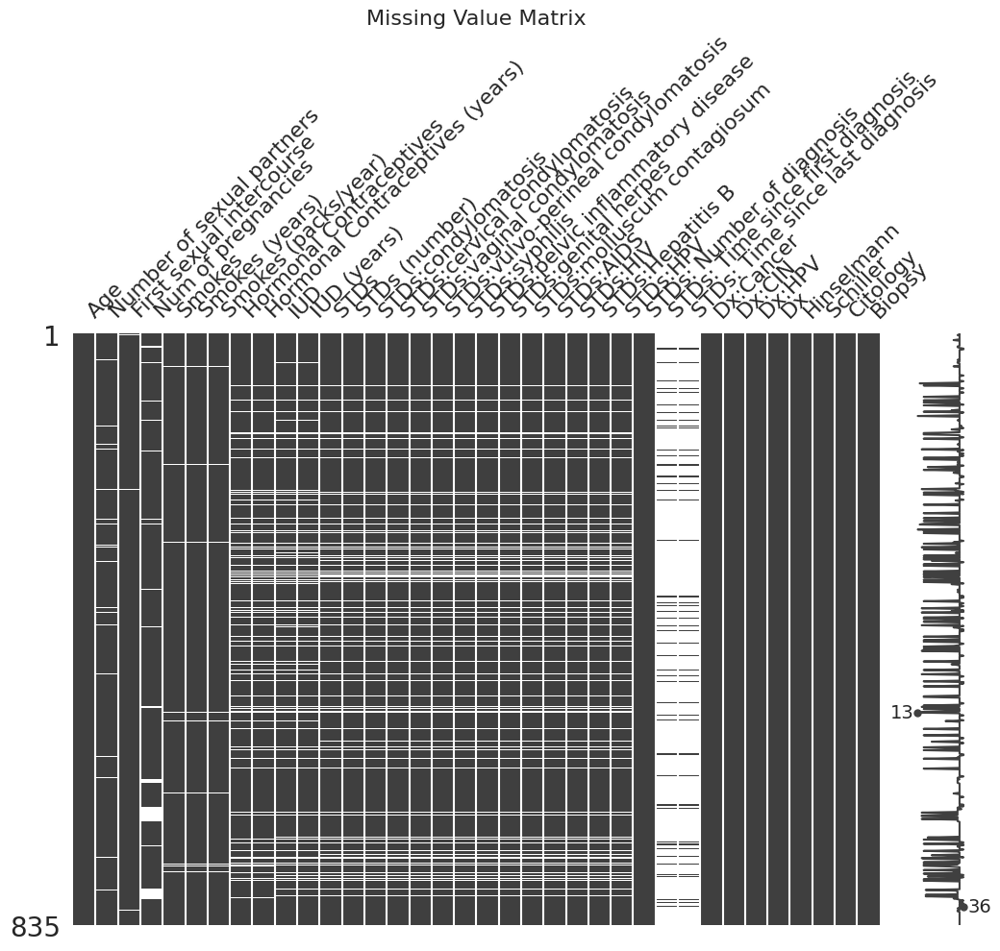

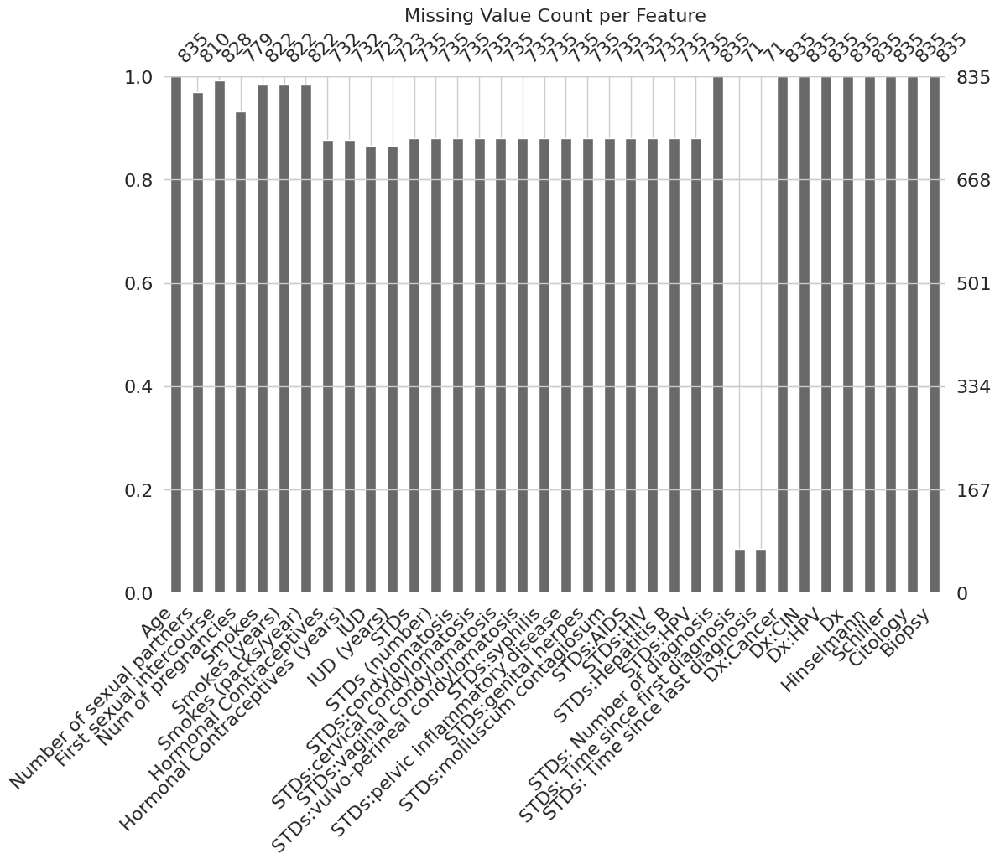

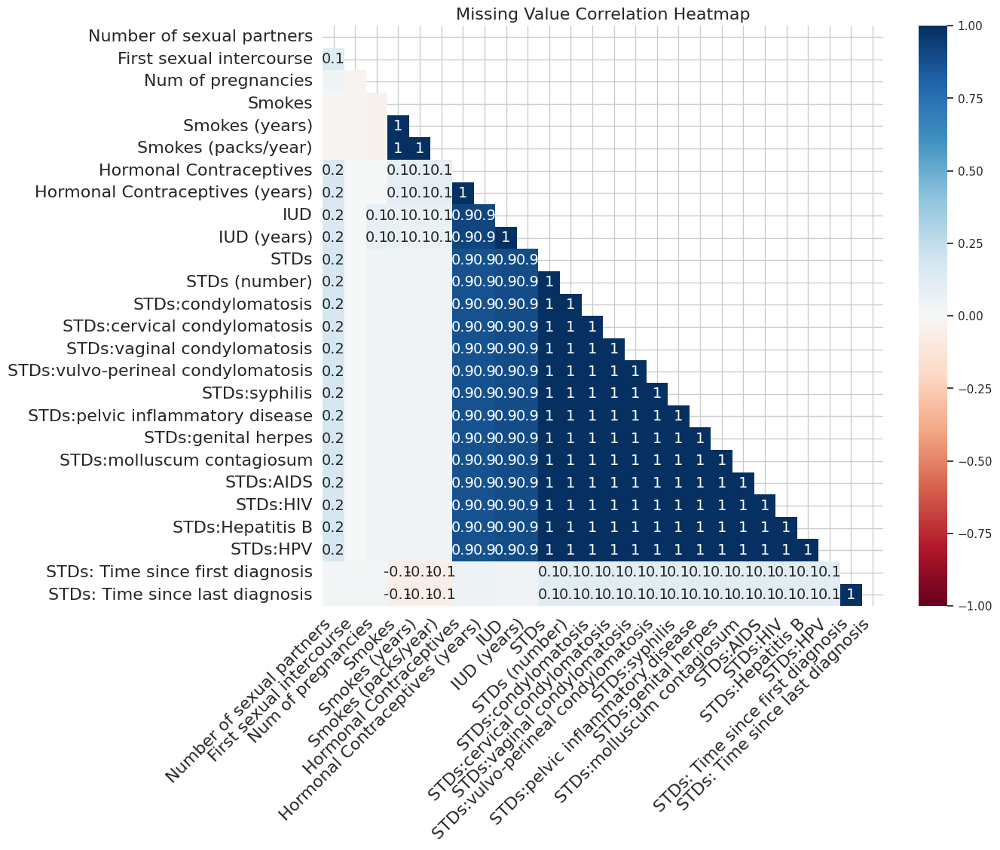

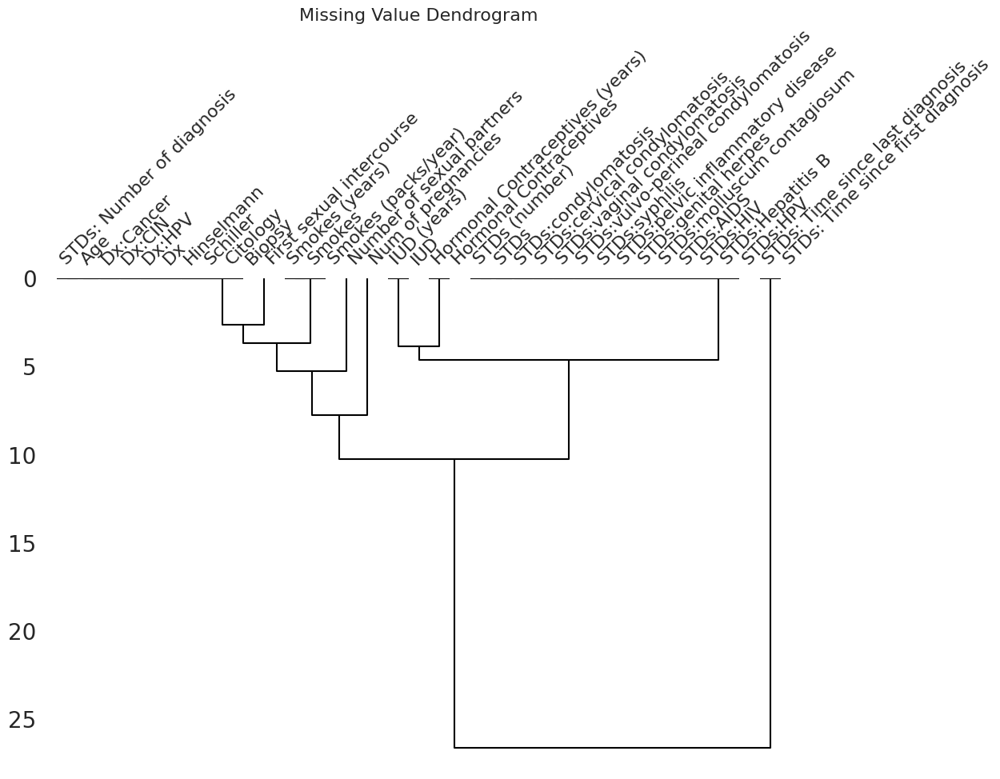

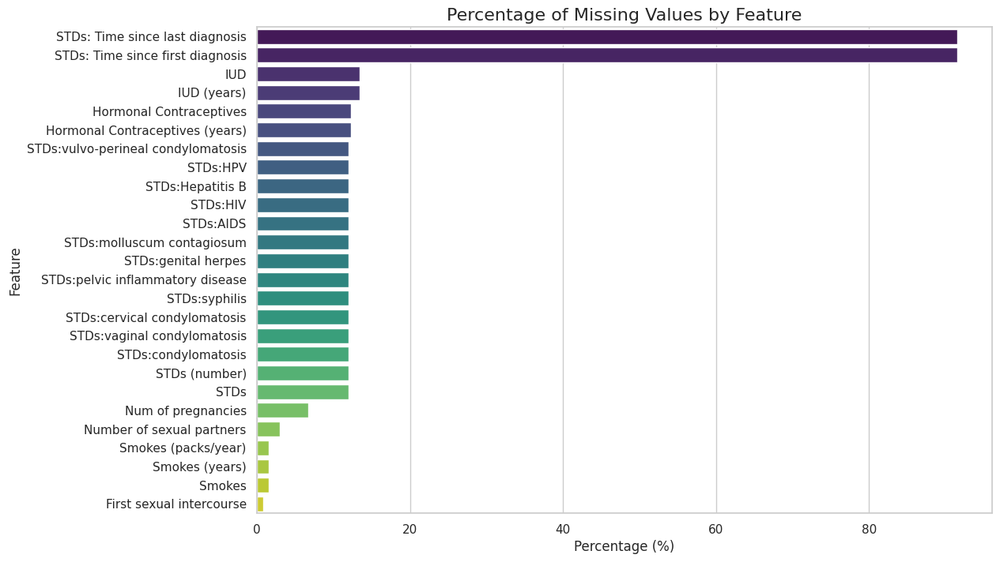

In [8]:
# 1. Missing value matrix
msno.matrix(df, figsize=(12, 8))
plt.title('Missing Value Matrix', fontsize=16)
plt.show()

# 2. Missing value bar plot
msno.bar(df, figsize=(12, 8))
plt.title('Missing Value Count per Feature', fontsize=16)
plt.show()

# 3. Missing value heatmap
msno.heatmap(df, figsize=(12, 10))
plt.title('Missing Value Correlation Heatmap', fontsize=16)
plt.show()

# 4. Missing value dendrogram
msno.dendrogram(df, figsize=(12, 8))
plt.title('Missing Value Dendrogram', fontsize=16)
plt.show()

# 5. Percentage of missing values
missing_percent = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({'Feature': missing_percent.index, 'Missing%': missing_percent.values})
missing_df = missing_df[missing_df['Missing%'] > 0].sort_values('Missing%', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=missing_df, x='Missing%', y='Feature', palette='viridis')
plt.title('Percentage of Missing Values by Feature', fontsize=16)
plt.xlabel('Percentage (%)')
plt.show()

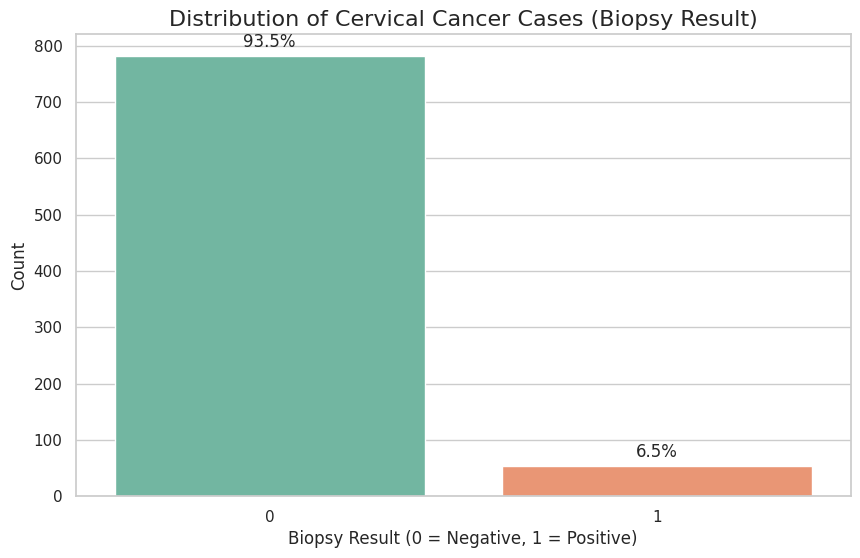

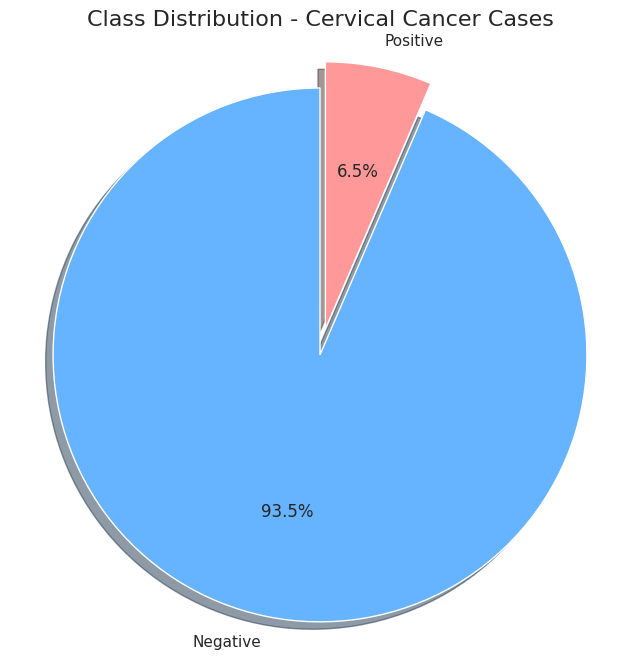

In [9]:
# 6. Target variable distribution
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='Biopsy', palette='Set2')
plt.title('Distribution of Cervical Cancer Cases (Biopsy Result)', fontsize=16)
plt.xlabel('Biopsy Result (0 = Negative, 1 = Positive)')
plt.ylabel('Count')

# Add percentage labels
total = len(df)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

# 7. Class imbalance visualization
labels = ['Negative', 'Positive']
sizes = df['Biopsy'].value_counts().values
colors = ['#66b3ff', '#ff9999']
explode = (0, 0.1)

plt.figure(figsize=(8, 8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', 
        shadow=True, startangle=90)
plt.title('Class Distribution - Cervical Cancer Cases', fontsize=16)
plt.axis('equal')
plt.show()

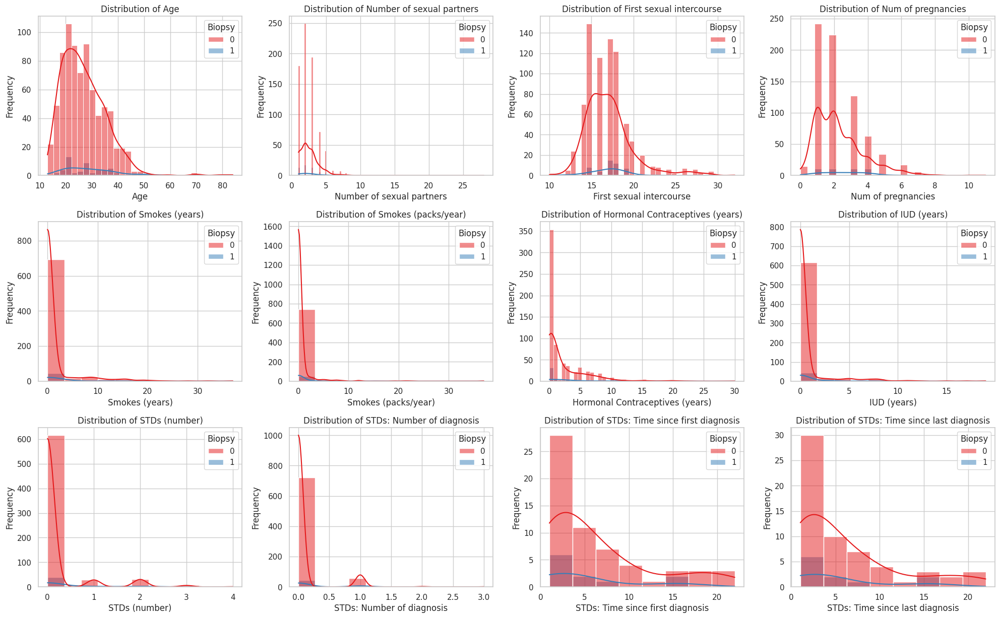

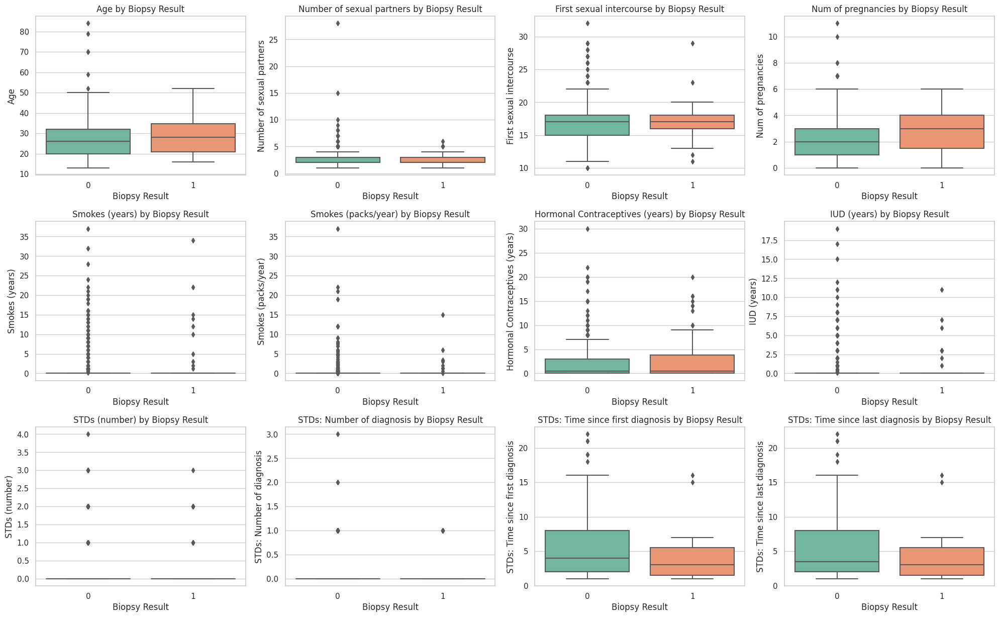

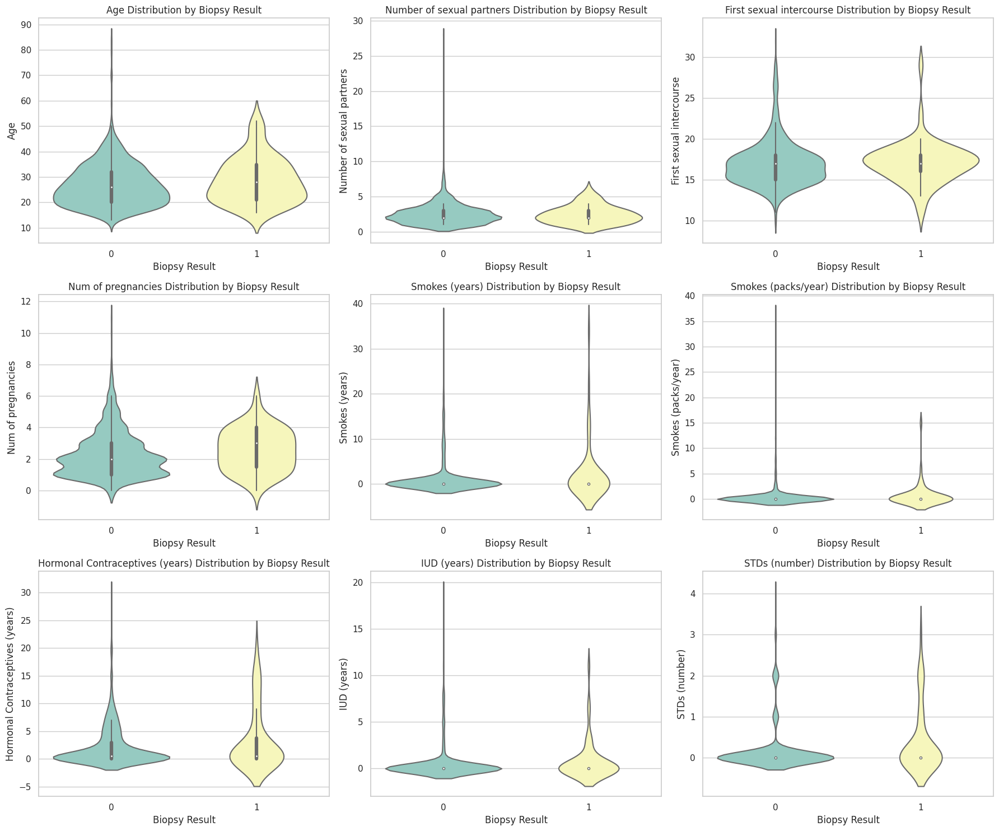

In [10]:
# Identify numerical columns
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
# Remove target and binary columns for now
binary_cols = []
for col in numerical_cols:
    if df[col].nunique() <= 2:
        binary_cols.append(col)

numerical_cols = [col for col in numerical_cols if col not in binary_cols + ['Biopsy']]

# 8. Distribution of numerical features
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:16]):
    sns.histplot(data=df, x=col, kde=True, ax=axes[i], hue='Biopsy', palette='Set1')
    axes[i].set_title(f'Distribution of {col}', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 9. Box plots for numerical features by target
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:16]):
    sns.boxplot(data=df, x='Biopsy', y=col, ax=axes[i], palette='Set2')
    axes[i].set_title(f'{col} by Biopsy Result', fontsize=12)
    axes[i].set_xlabel('Biopsy Result')
    axes[i].set_ylabel(col)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 10. Violin plots for numerical features by target
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    sns.violinplot(data=df, x='Biopsy', y=col, ax=axes[i], palette='Set3')
    axes[i].set_title(f'{col} Distribution by Biopsy Result', fontsize=12)
    axes[i].set_xlabel('Biopsy Result')
    axes[i].set_ylabel(col)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

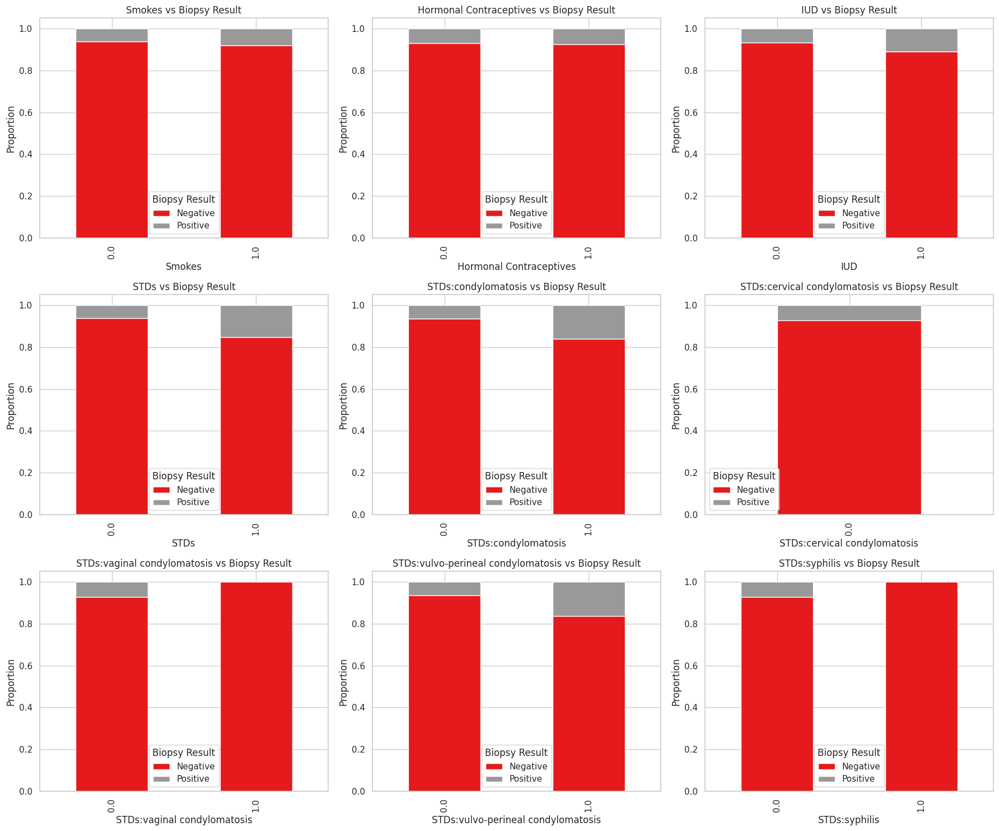

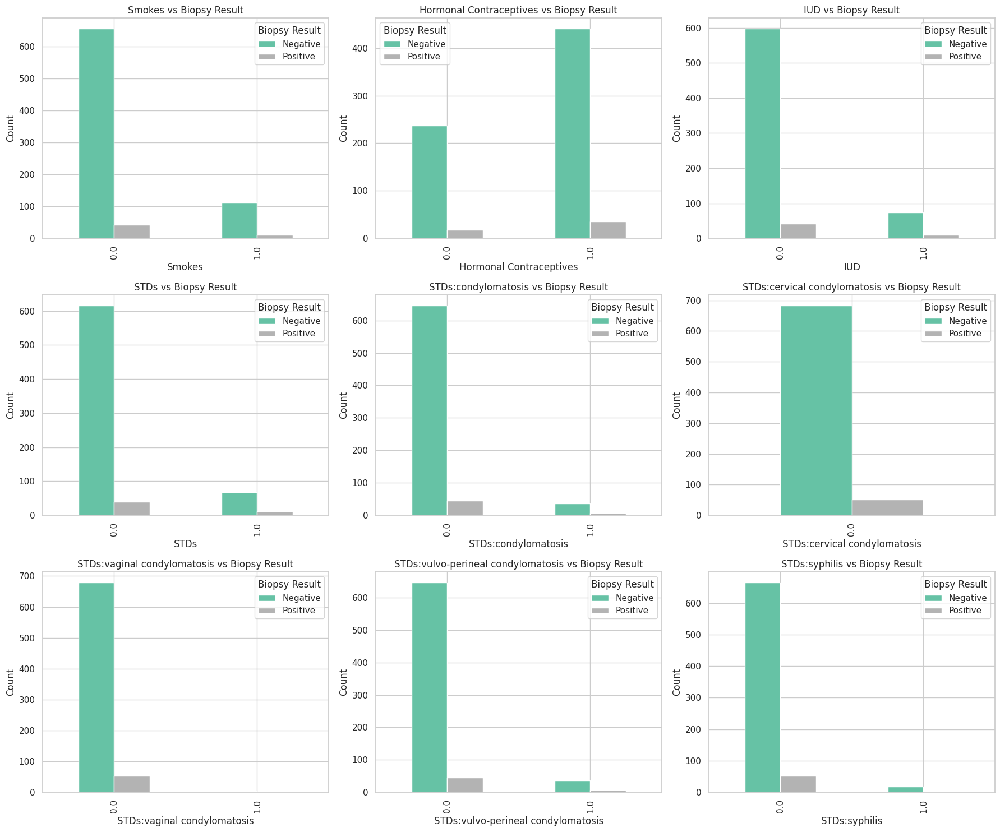

In [11]:
# Get binary columns (excluding target)
binary_cols = [col for col in binary_cols if col != 'Biopsy']

# 11. Stacked bar plots for binary features
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(binary_cols[:9]):
    crosstab = pd.crosstab(df[col], df['Biopsy'], normalize='index')
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], colormap='Set1')
    axes[i].set_title(f'{col} vs Biopsy Result', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Proportion')
    axes[i].legend(title='Biopsy Result', labels=['Negative', 'Positive'])

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 12. Grouped bar plots for binary features
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(binary_cols[:9]):
    crosstab = pd.crosstab(df[col], df['Biopsy'])
    crosstab.plot(kind='bar', ax=axes[i], colormap='Set2')
    axes[i].set_title(f'{col} vs Biopsy Result', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    axes[i].legend(title='Biopsy Result', labels=['Negative', 'Positive'])

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

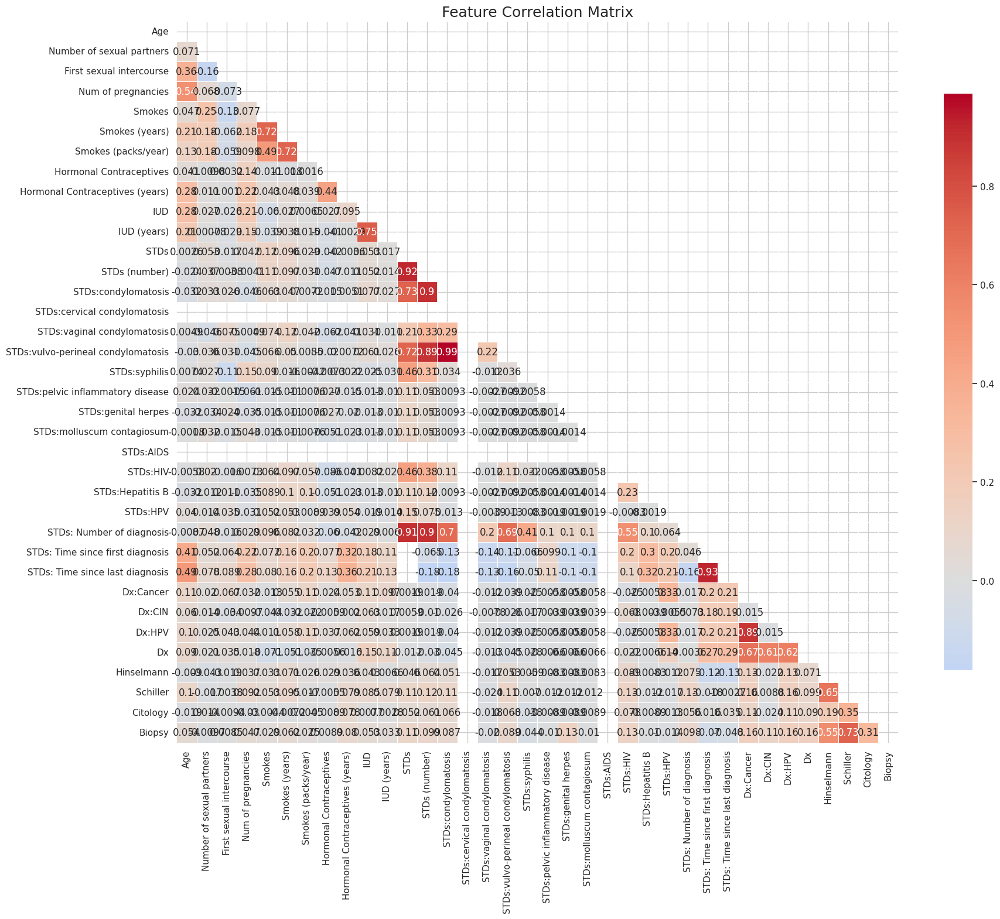

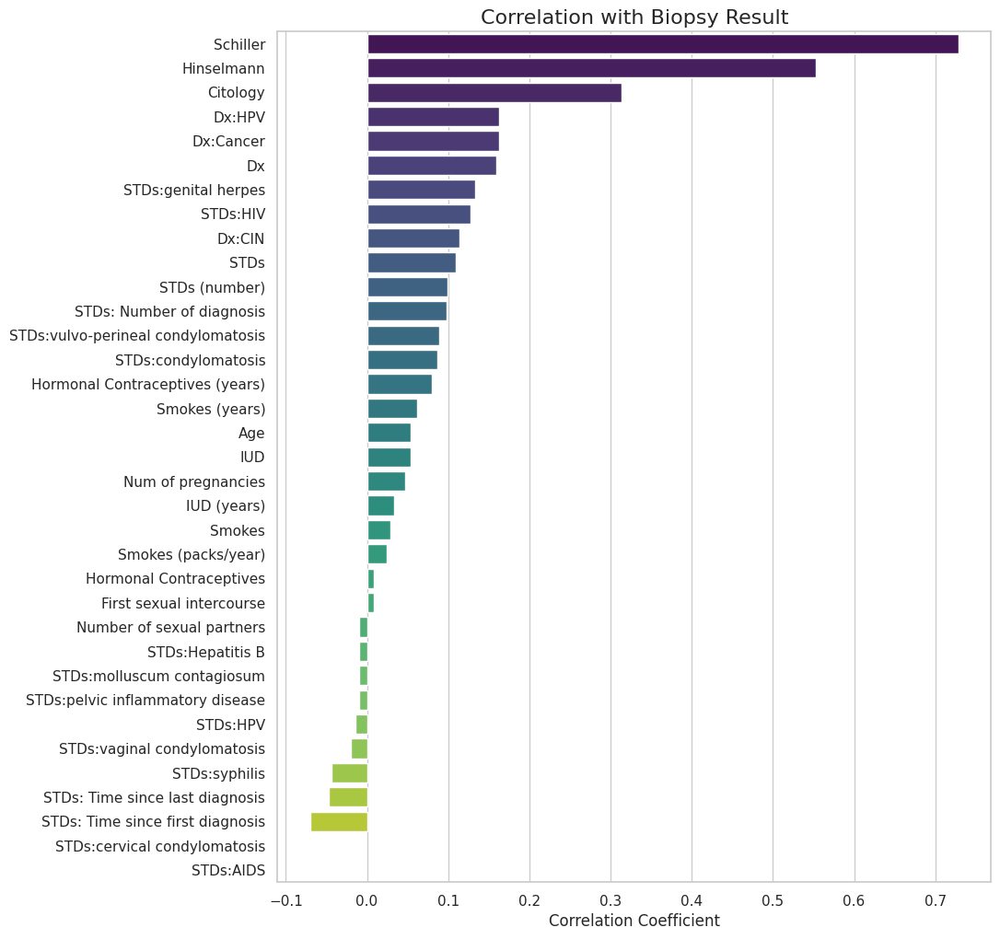

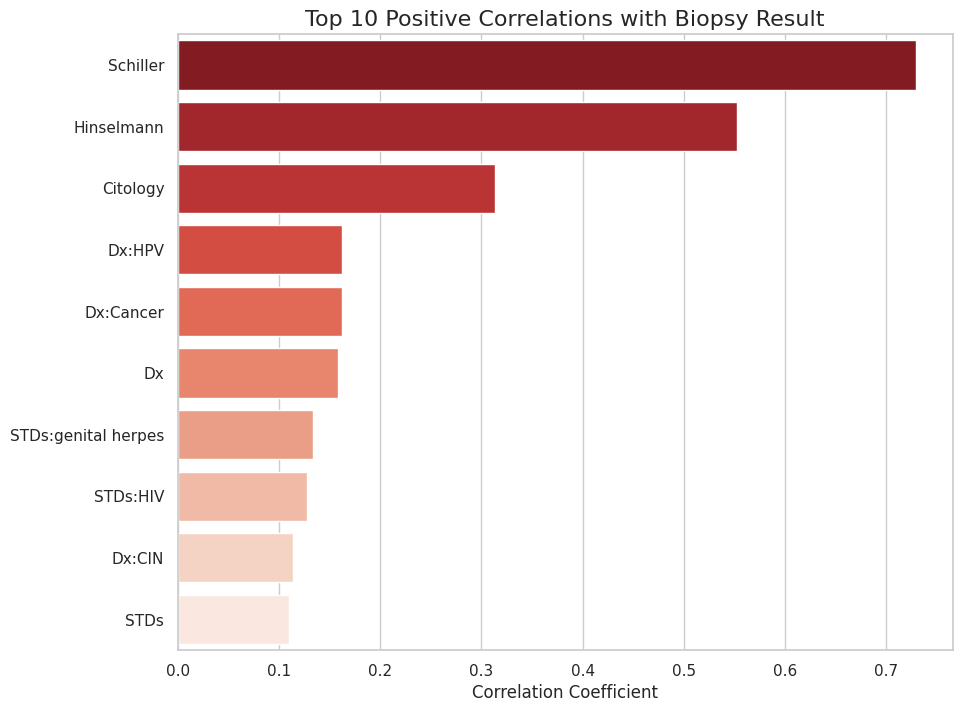

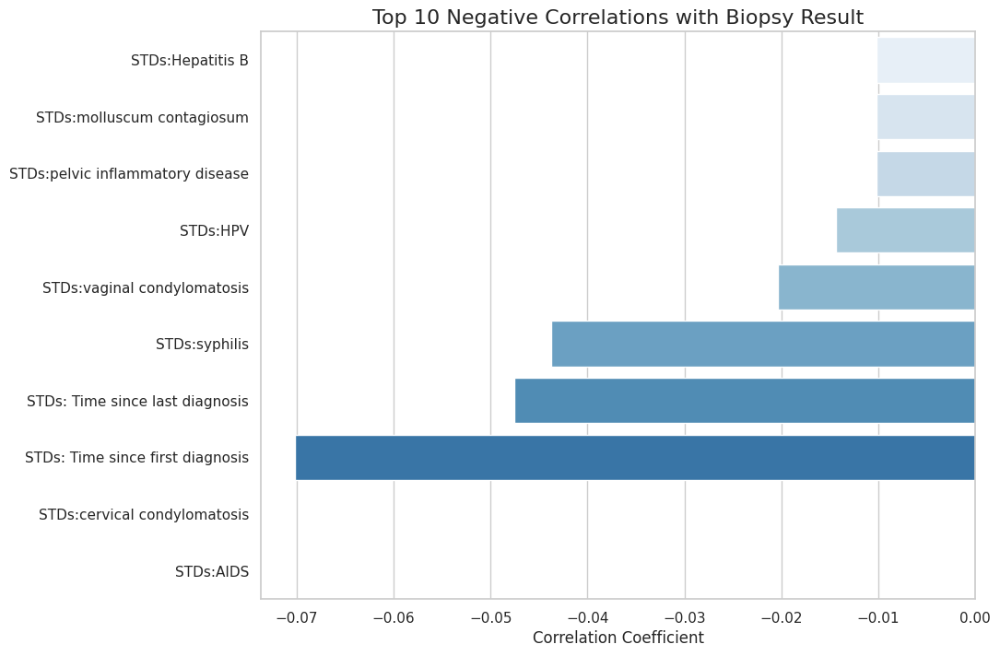

In [13]:
# 13. Correlation matrix heatmap
plt.figure(figsize=(20, 16))
correlation_matrix = df.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', 
            center=0, square=True, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Feature Correlation Matrix', fontsize=18)
plt.show()

# 14. Correlation with target variable
target_corr = df.corr()['Biopsy'].sort_values(ascending=False)
target_corr = target_corr.drop('Biopsy')

plt.figure(figsize=(10, 12))
sns.barplot(x=target_corr.values, y=target_corr.index, palette='viridis')
plt.title('Correlation with Biopsy Result', fontsize=16)
plt.xlabel('Correlation Coefficient')
plt.show()

# 15. Top 10 positive correlations with target
top_positive = target_corr.head(10)
plt.figure(figsize=(10, 8))
sns.barplot(x=top_positive.values, y=top_positive.index, palette='Reds_r')
plt.title('Top 10 Positive Correlations with Biopsy Result', fontsize=16)
plt.xlabel('Correlation Coefficient')
plt.show()

# 16. Top 10 negative correlations with target
top_negative = target_corr.tail(10)
plt.figure(figsize=(10, 8))
sns.barplot(x=top_negative.values, y=top_negative.index, palette='Blues')
plt.title('Top 10 Negative Correlations with Biopsy Result', fontsize=16)
plt.xlabel('Correlation Coefficient')
plt.show()

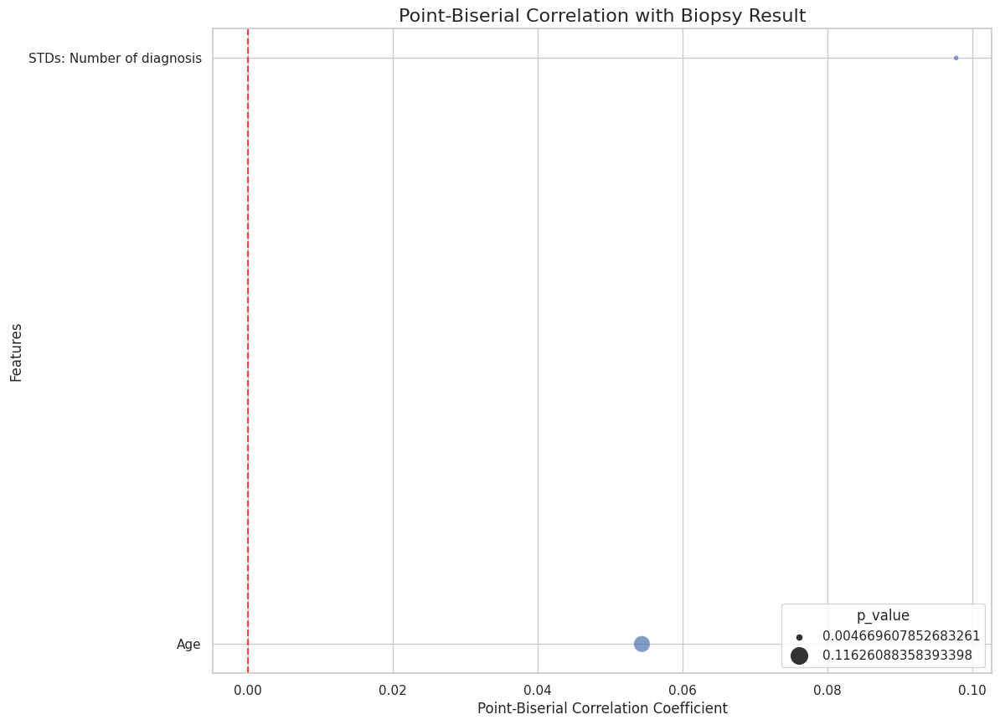

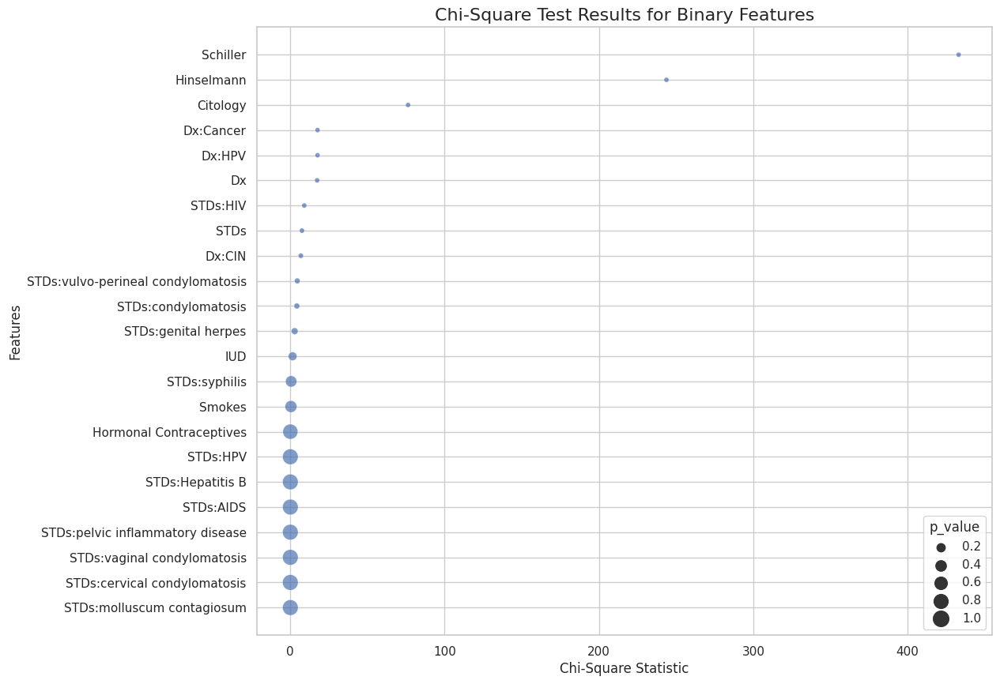

In [14]:
# 17. Point-biserial correlation for numerical features with target
point_biserial = {}
for col in numerical_cols:
    if df[col].notna().sum() > 0:
        correlation, p_value = pointbiserialr(df['Biopsy'], df[col])
        point_biserial[col] = {'correlation': correlation, 'p_value': p_value}

point_biserial_df = pd.DataFrame(point_biserial).T
point_biserial_df = point_biserial_df.sort_values('correlation', ascending=False)

plt.figure(figsize=(12, 10))
sns.scatterplot(data=point_biserial_df, x='correlation', y=point_biserial_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='viridis')
plt.title('Point-Biserial Correlation with Biopsy Result', fontsize=16)
plt.xlabel('Point-Biserial Correlation Coefficient')
plt.ylabel('Features')
plt.axvline(x=0, color='red', linestyle='--', alpha=0.7)
plt.show()

# 18. Chi-square test for categorical features
chi2_results = {}
for col in binary_cols:
    contingency_table = pd.crosstab(df[col], df['Biopsy'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    chi2_results[col] = {'chi2': chi2, 'p_value': p}

chi2_df = pd.DataFrame(chi2_results).T
chi2_df = chi2_df.sort_values('chi2', ascending=False)

plt.figure(figsize=(12, 10))
sns.scatterplot(data=chi2_df, x='chi2', y=chi2_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='viridis')
plt.title('Chi-Square Test Results for Binary Features', fontsize=16)
plt.xlabel('Chi-Square Statistic')
plt.ylabel('Features')
plt.show()

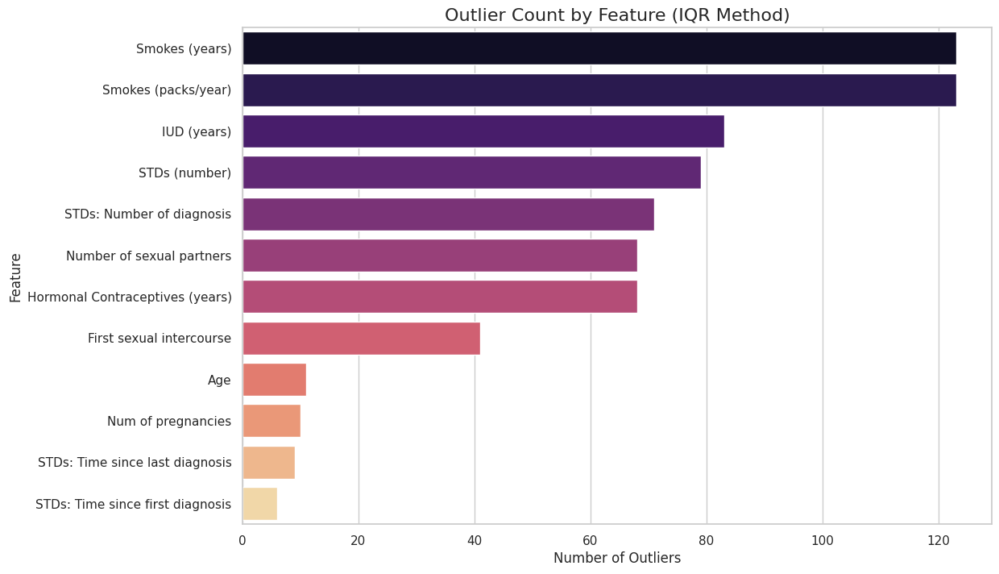

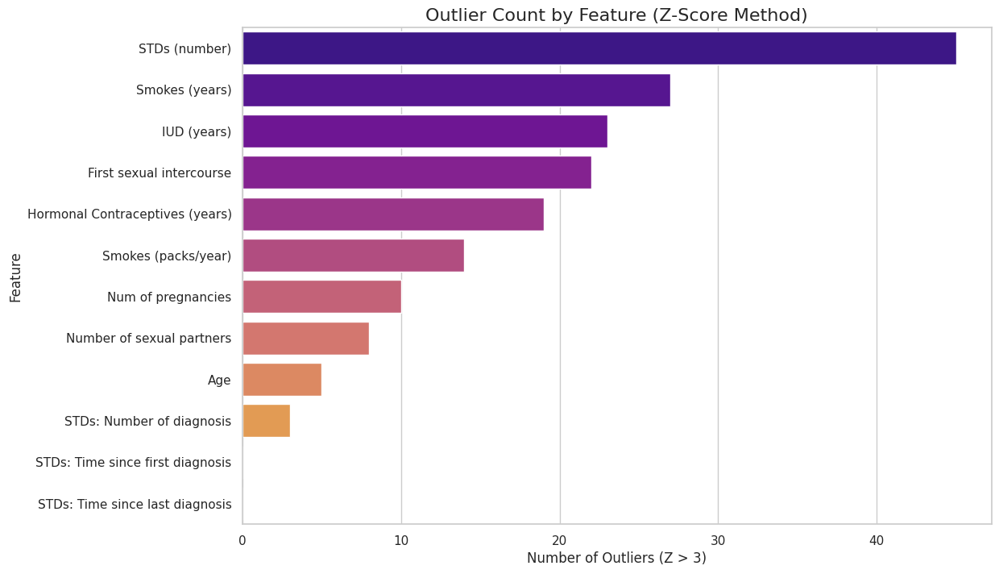

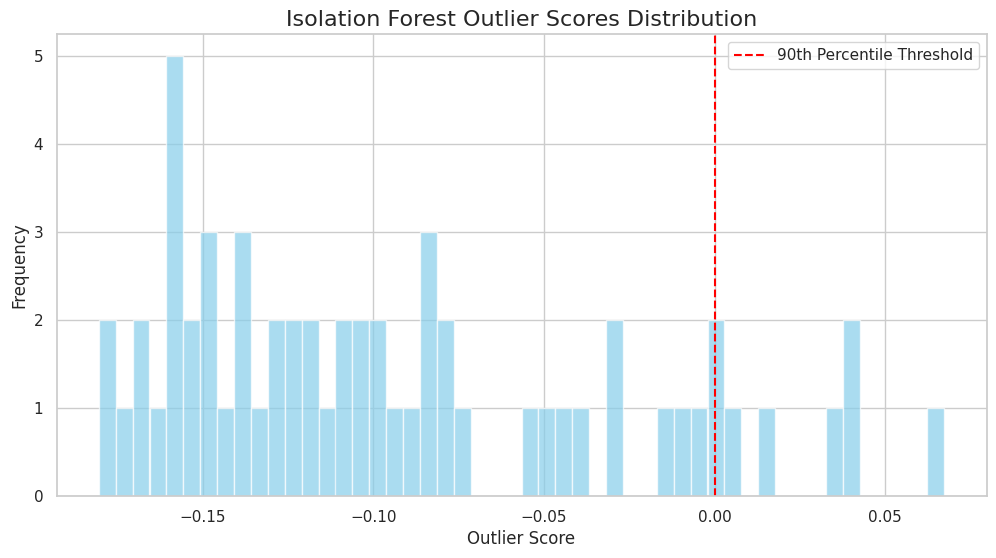

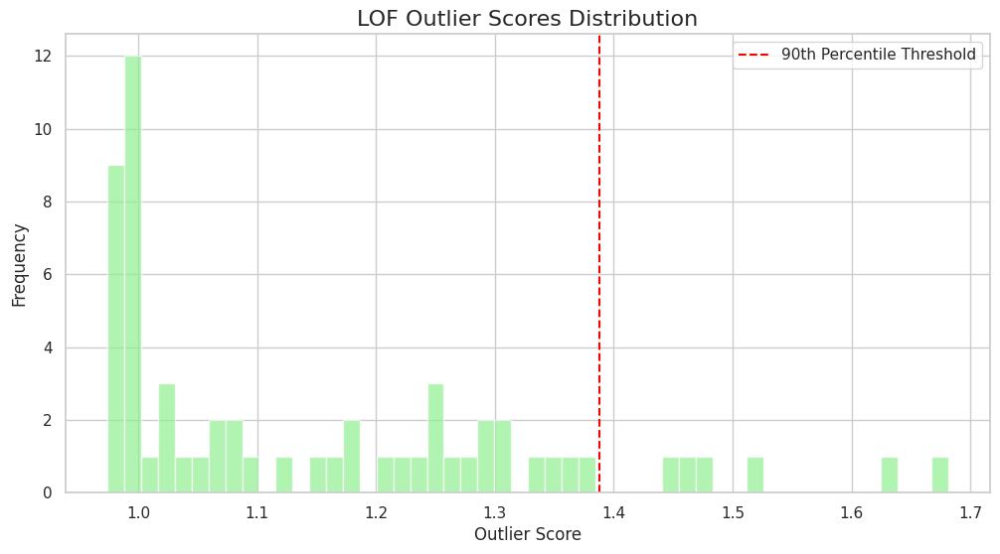

In [15]:
# 19. Outlier detection using IQR method
outlier_counts = {}
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outlier_counts[col] = len(outliers)

outlier_df = pd.DataFrame(list(outlier_counts.items()), columns=['Feature', 'Outlier_Count'])
outlier_df = outlier_df.sort_values('Outlier_Count', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=outlier_df.head(15), x='Outlier_Count', y='Feature', palette='magma')
plt.title('Outlier Count by Feature (IQR Method)', fontsize=16)
plt.xlabel('Number of Outliers')
plt.show()

# 20. Outlier detection using Z-score
z_score_outliers = {}
for col in numerical_cols:
    z_scores = np.abs(stats.zscore(df[col].dropna()))
    outliers = np.where(z_scores > 3)
    z_score_outliers[col] = len(outliers[0])

z_outlier_df = pd.DataFrame(list(z_score_outliers.items()), columns=['Feature', 'Z_Outlier_Count'])
z_outlier_df = z_outlier_df.sort_values('Z_Outlier_Count', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=z_outlier_df.head(15), x='Z_Outlier_Count', y='Feature', palette='plasma')
plt.title('Outlier Count by Feature (Z-Score Method)', fontsize=16)
plt.xlabel('Number of Outliers (Z > 3)')
plt.show()

# 21. Isolation Forest for outlier detection
X_numerical = df[numerical_cols].dropna()
iso_forest = IForest(contamination=0.1)
outlier_labels = iso_forest.fit_predict(X_numerical)
outlier_scores = iso_forest.decision_scores_

plt.figure(figsize=(12, 6))
plt.hist(outlier_scores, bins=50, alpha=0.7, color='skyblue')
plt.axvline(x=np.percentile(outlier_scores, 90), color='red', linestyle='--', 
            label='90th Percentile Threshold')
plt.title('Isolation Forest Outlier Scores Distribution', fontsize=16)
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 22. LOF (Local Outlier Factor) for outlier detection
lof = LOF(contamination=0.1)
lof_labels = lof.fit_predict(X_numerical)
lof_scores = lof.decision_scores_

plt.figure(figsize=(12, 6))
plt.hist(lof_scores, bins=50, alpha=0.7, color='lightgreen')
plt.axvline(x=np.percentile(lof_scores, 90), color='red', linestyle='--', 
            label='90th Percentile Threshold')
plt.title('LOF Outlier Scores Distribution', fontsize=16)
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.legend()
plt.show()

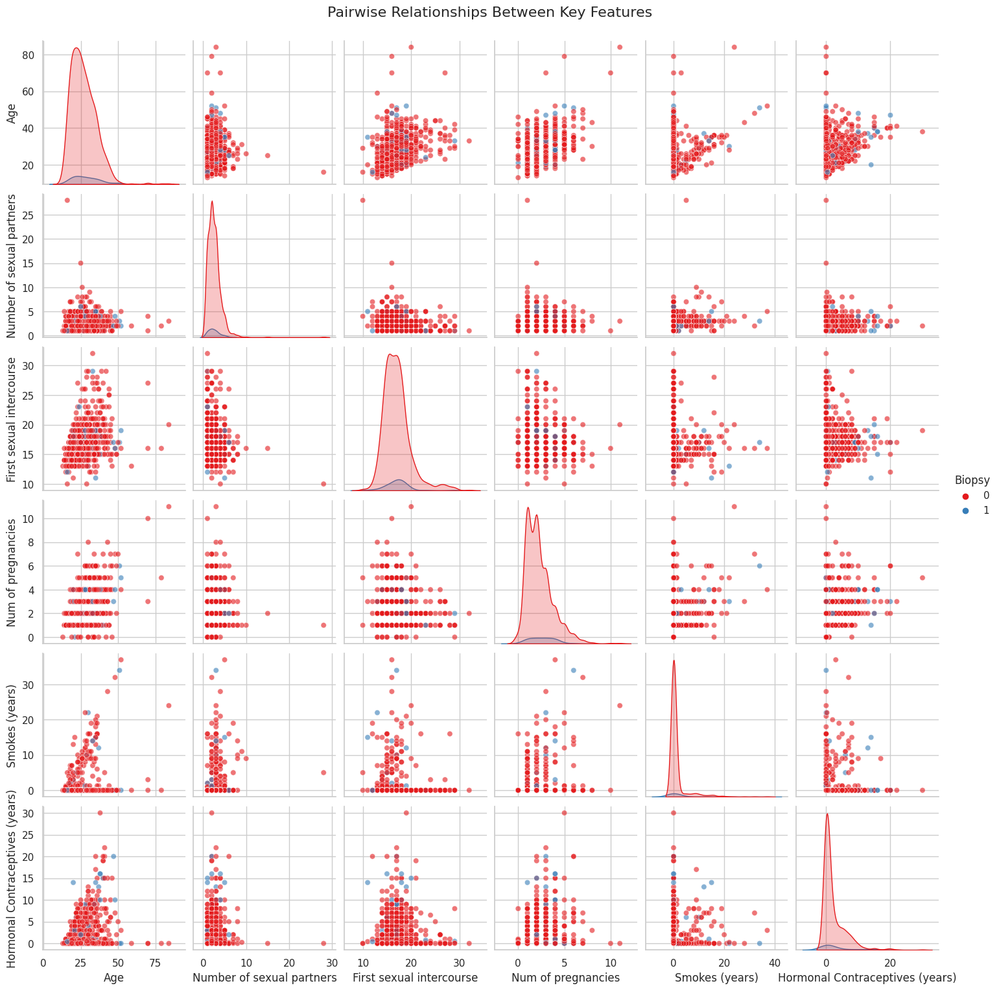

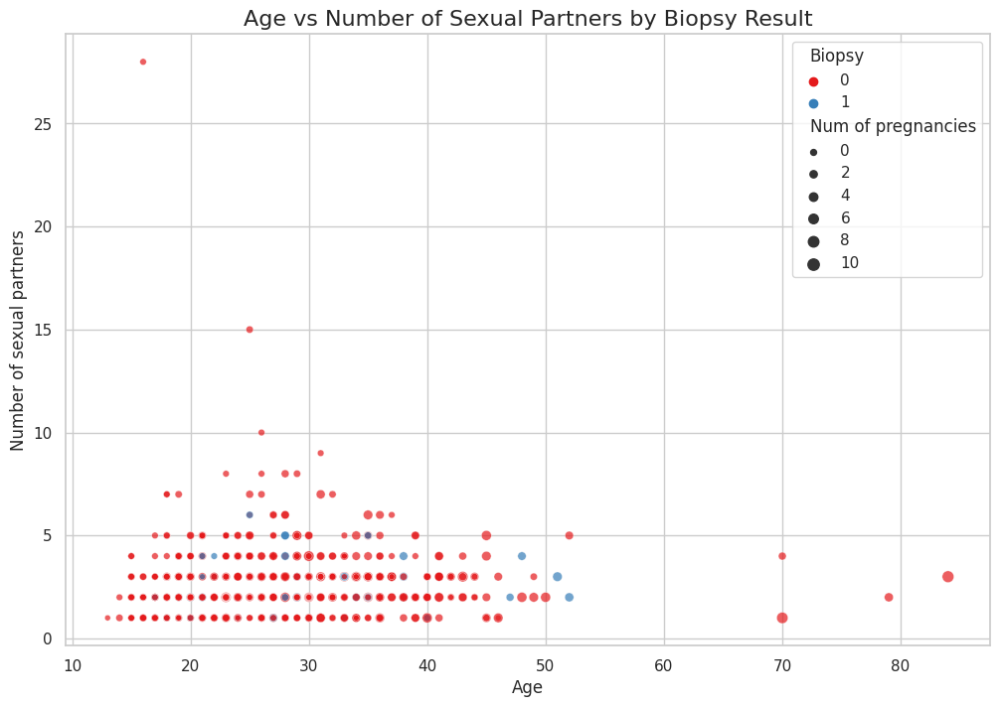

<Figure size 1000x600 with 0 Axes>

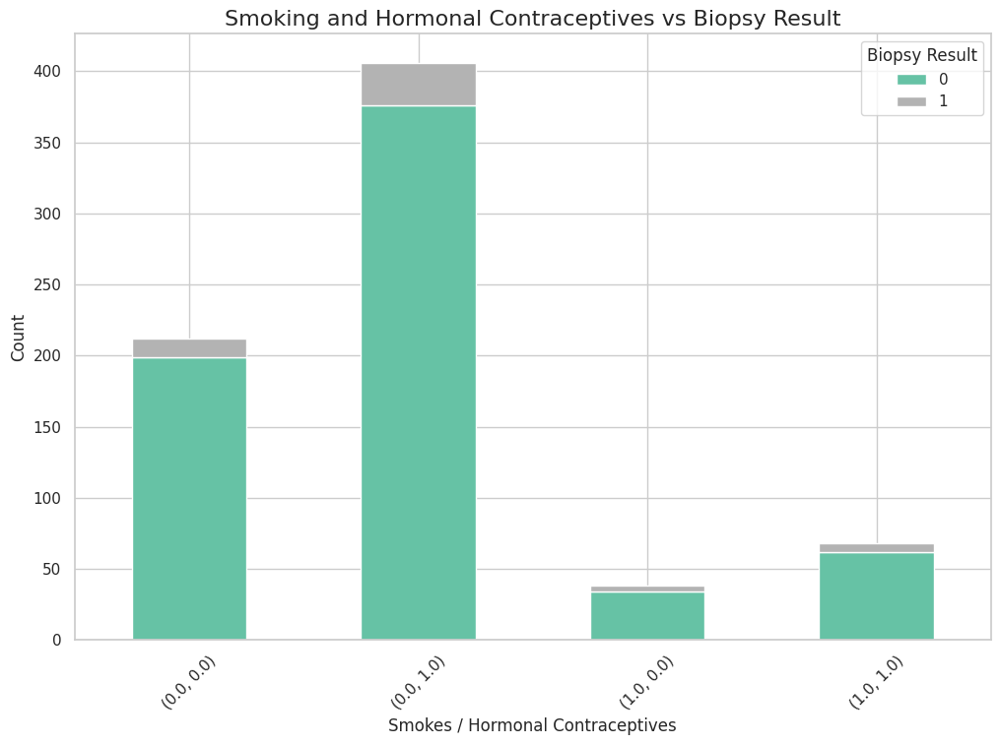

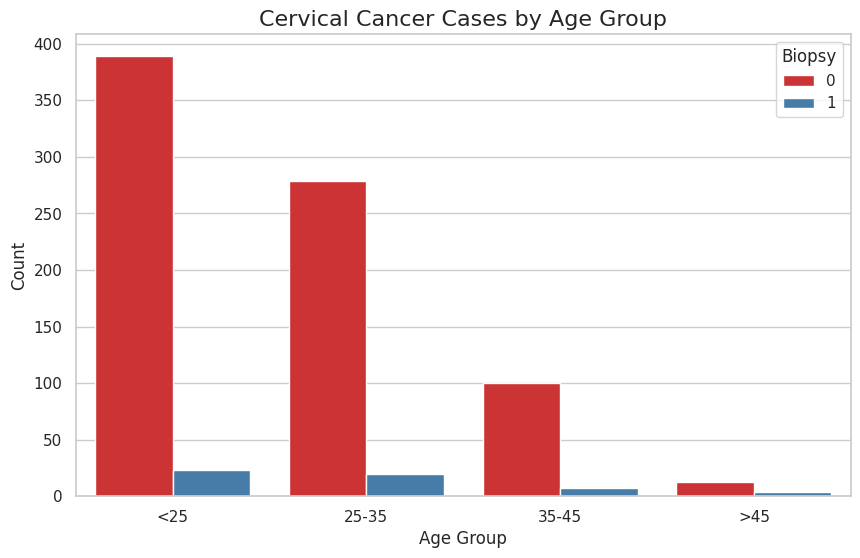

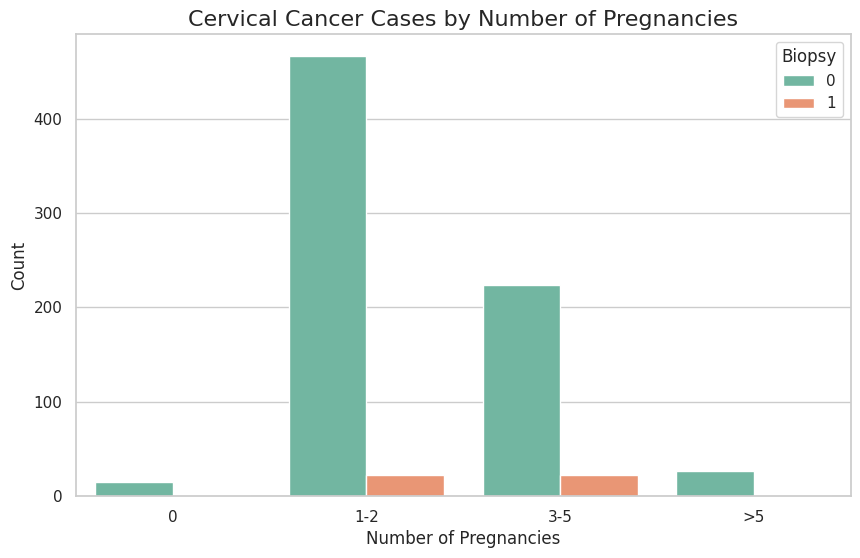

In [16]:
# 23. Pairplot for key numerical features
key_features = ['Age', 'Number of sexual partners', 'First sexual intercourse', 
                'Num of pregnancies', 'Smokes (years)', 'Hormonal Contraceptives (years)']
key_features = [col for col in key_features if col in df.columns]

if len(key_features) > 0:
    sns.pairplot(df[key_features + ['Biopsy']], hue='Biopsy', palette='Set1', 
                 plot_kws={'alpha': 0.6})
    plt.suptitle('Pairwise Relationships Between Key Features', y=1.02, fontsize=16)
    plt.show()

# 24. Interaction between Age and Number of sexual partners
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='Age', y='Number of sexual partners', hue='Biopsy', 
                size='Num of pregnancies', palette='Set1', alpha=0.7)
plt.title('Age vs Number of Sexual Partners by Biopsy Result', fontsize=16)
plt.show()

# 25. Interaction between Smoking and Hormonal Contraceptives
if 'Smokes' in df.columns and 'Hormonal Contraceptives' in df.columns:
    plt.figure(figsize=(10, 6))
    crosstab = pd.crosstab([df['Smokes'], df['Hormonal Contraceptives']], df['Biopsy'])
    crosstab.plot(kind='bar', stacked=True, colormap='Set2')
    plt.title('Smoking and Hormonal Contraceptives vs Biopsy Result', fontsize=16)
    plt.xlabel('Smokes / Hormonal Contraceptives')
    plt.ylabel('Count')
    plt.legend(title='Biopsy Result')
    plt.xticks(rotation=45)
    plt.show()

# 26. Age groups and cancer risk
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 25, 35, 45, 100], 
                         labels=['<25', '25-35', '35-45', '>45'])
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Age_Group', hue='Biopsy', palette='Set1')
plt.title('Cervical Cancer Cases by Age Group', fontsize=16)
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

# 27. Number of pregnancies and cancer risk
df['Pregnancy_Group'] = pd.cut(df['Num of pregnancies'], bins=[-1, 0, 2, 5, 20], 
                               labels=['0', '1-2', '3-5', '>5'])
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Pregnancy_Group', hue='Biopsy', palette='Set2')
plt.title('Cervical Cancer Cases by Number of Pregnancies', fontsize=16)
plt.xlabel('Number of Pregnancies')
plt.ylabel('Count')
plt.show()

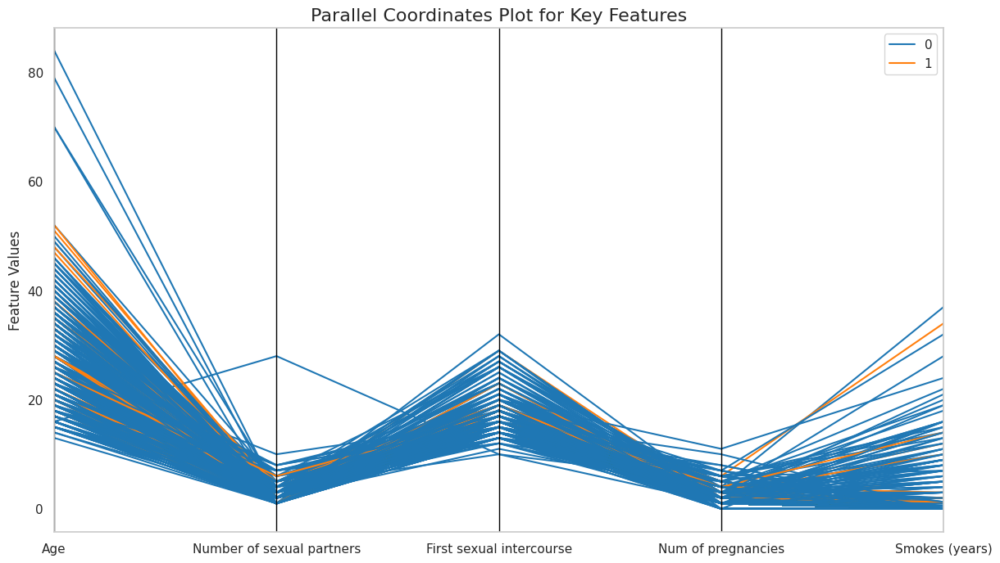

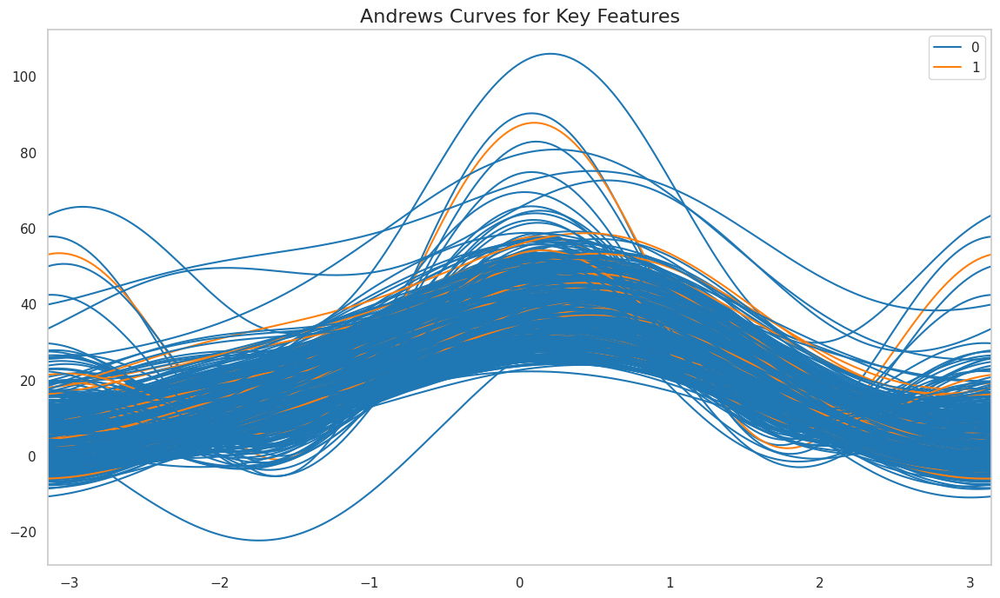

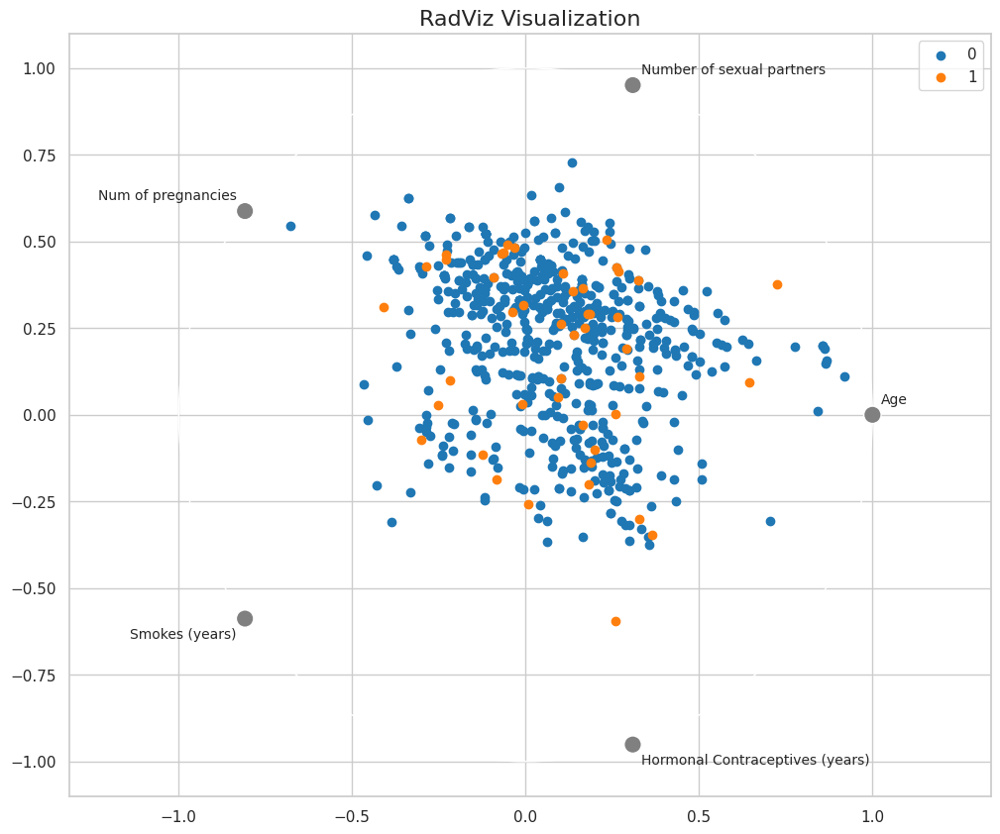

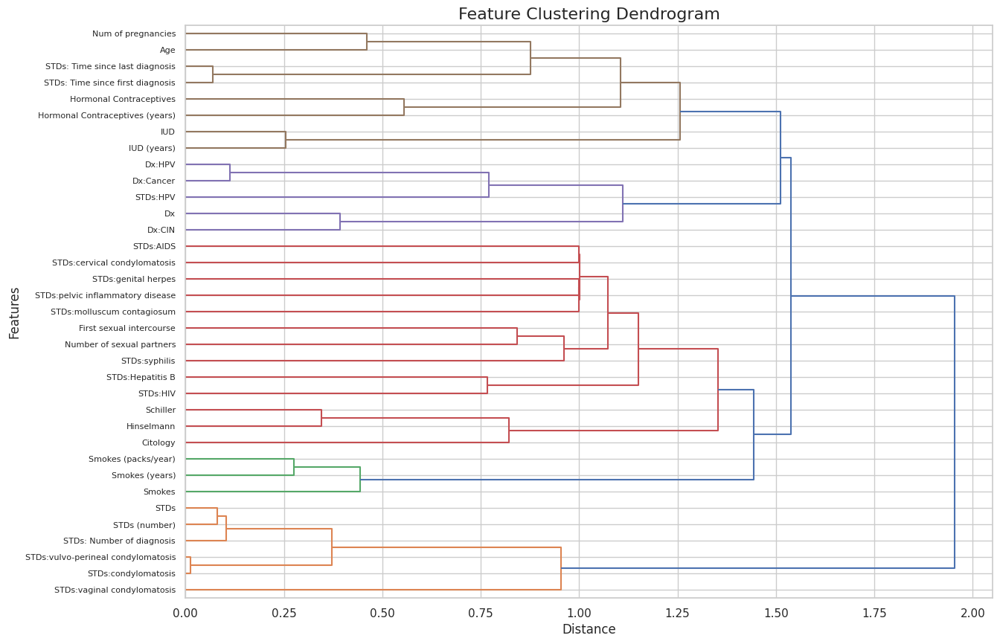

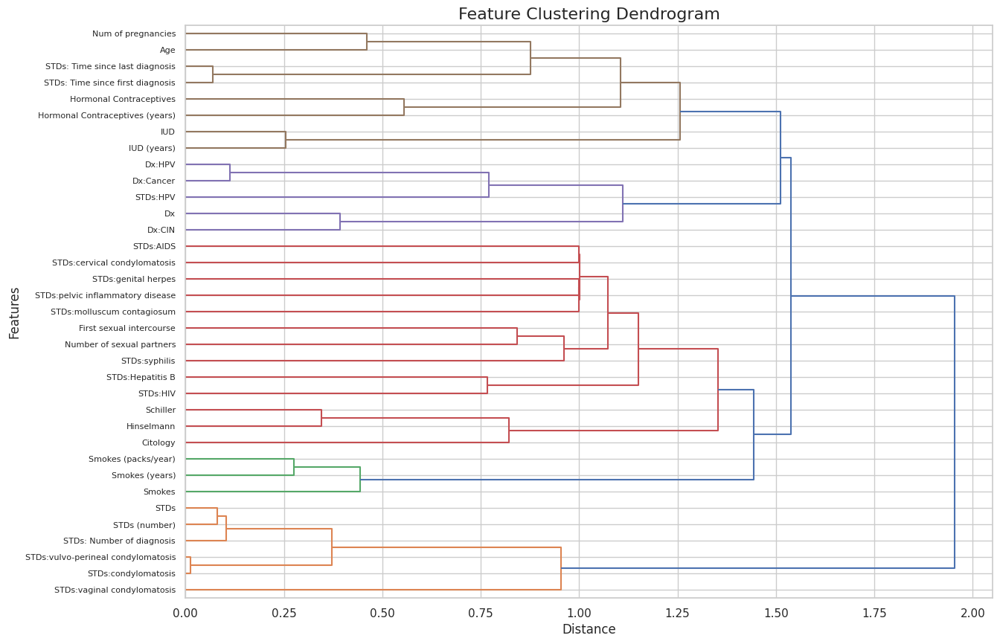

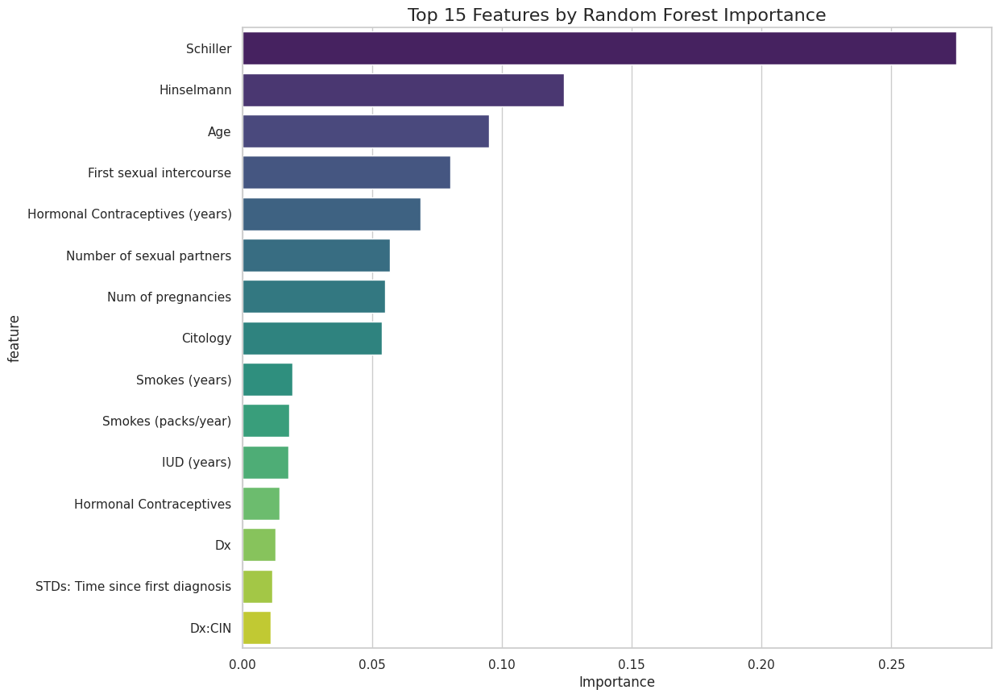

In [19]:
# 28. Parallel coordinates plot
from pandas.plotting import parallel_coordinates

# Select key features for parallel coordinates
parallel_features = ['Age', 'Number of sexual partners', 'First sexual intercourse', 
                     'Num of pregnancies', 'Smokes (years)', 'Biopsy']
parallel_features = [col for col in parallel_features if col in df.columns]

if len(parallel_features) > 0:
    plt.figure(figsize=(14, 8))
    parallel_coordinates(df[parallel_features].dropna(), 'Biopsy', color=['#1f77b4', '#ff7f0e'])
    plt.title('Parallel Coordinates Plot for Key Features', fontsize=16)
    plt.ylabel('Feature Values')
    plt.show()

# 29. Andrews curves
from pandas.plotting import andrews_curves

if len(parallel_features) > 0:
    plt.figure(figsize=(14, 8))
    andrews_curves(df[parallel_features].dropna(), 'Biopsy', color=['#1f77b4', '#ff7f0e'])
    plt.title('Andrews Curves for Key Features', fontsize=16)
    plt.show()

# 30. RadViz plot
from pandas.plotting import radviz

radviz_features = ['Age', 'Number of sexual partners', 'Num of pregnancies', 
                   'Smokes (years)', 'Hormonal Contraceptives (years)', 'Biopsy']
radviz_features = [col for col in radviz_features if col in df.columns]

if len(radviz_features) > 0:
    plt.figure(figsize=(12, 10))
    radviz(df[radviz_features].dropna(), 'Biopsy', color=['#1f77b4', '#ff7f0e'])
    plt.title('RadViz Visualization', fontsize=16)
    plt.show()

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

# Compute correlation matrix
corr_matrix = df[numerical_cols + binary_cols].corr().fillna(0)

# Convert to distance matrix (absolute correlation)
distance_matrix = 1 - corr_matrix.abs()

# Set diagonal to zero explicitly
np.fill_diagonal(distance_matrix.values, 0)

# Convert to condensed form
condensed_distance = squareform(distance_matrix.values)

# Compute linkage
linkage_matrix = linkage(condensed_distance, method='ward')

# Plot dendrogram
plt.figure(figsize=(14, 10))
dendrogram(linkage_matrix, labels=corr_matrix.columns, orientation='right')
plt.title('Feature Clustering Dendrogram', fontsize=16)
plt.xlabel('Distance')
plt.ylabel('Features')
plt.show()



plt.figure(figsize=(14, 10))
dendrogram(linkage_matrix, labels=corr_matrix.columns, orientation='right')
plt.title('Feature Clustering Dendrogram', fontsize=16)
plt.xlabel('Distance')
plt.ylabel('Features')
plt.show()

# 32. Feature importance from Random Forest (preliminary)
X_temp = df.drop(['Biopsy', 'Age_Group', 'Pregnancy_Group'], axis=1)
y_temp = df['Biopsy']

# Handle missing values temporarily
X_temp = X_temp.fillna(X_temp.median())
X_temp = X_temp.apply(lambda x: pd.to_numeric(x, errors='coerce')).fillna(0)

rf_temp = RandomForestClassifier(n_estimators=100, random_state=42)
rf_temp.fit(X_temp, y_temp)

feature_importance = pd.DataFrame({
    'feature': X_temp.columns,
    'importance': rf_temp.feature_importances_
}).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 10))
sns.barplot(data=feature_importance.head(15), x='importance', y='feature', palette='viridis')
plt.title('Top 15 Features by Random Forest Importance', fontsize=16)
plt.xlabel('Importance')
plt.show()

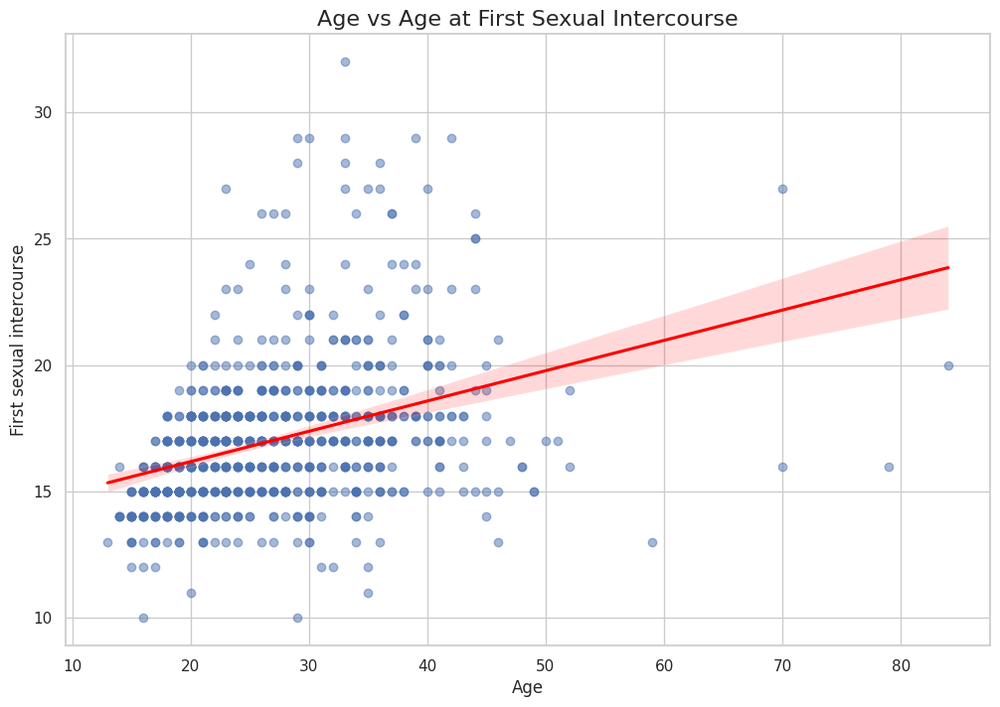

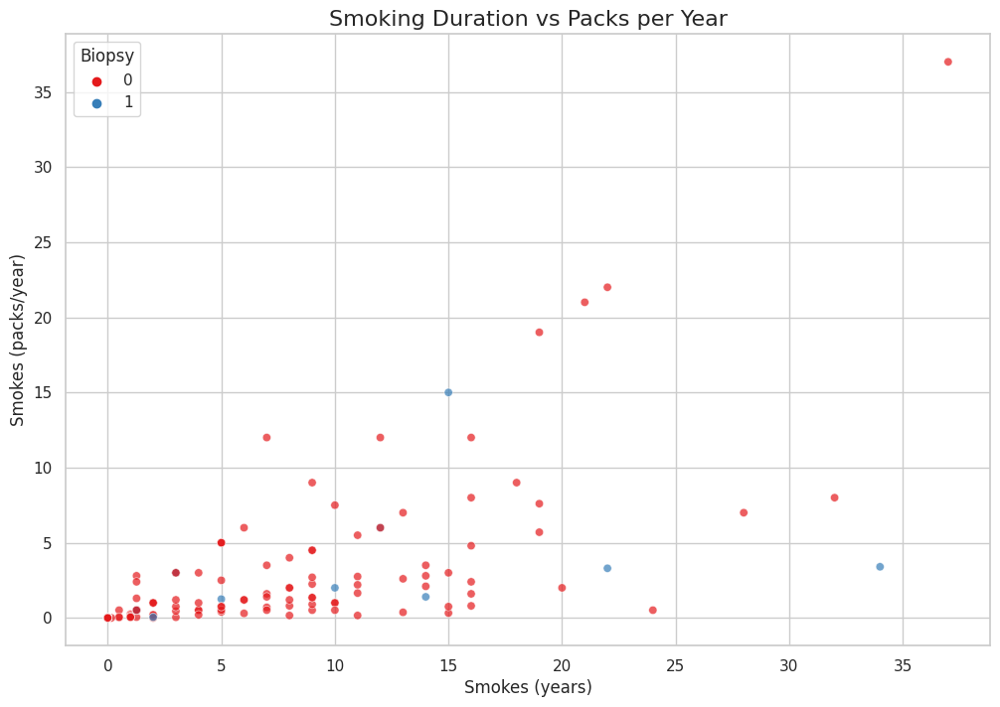

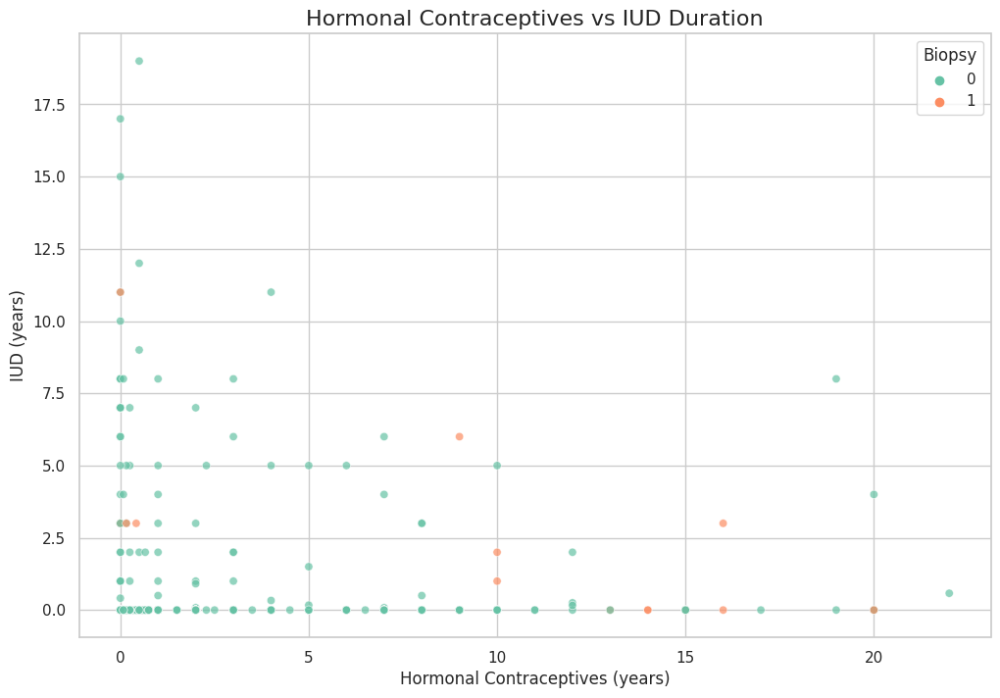

In [20]:
# 33. Age vs First sexual intercourse scatter with trend line
if 'First sexual intercourse' in df.columns:
    plt.figure(figsize=(12, 8))
    sns.regplot(data=df, x='Age', y='First sexual intercourse', 
                scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
    plt.title('Age vs Age at First Sexual Intercourse', fontsize=16)
    plt.show()

# 34. Smoking duration vs packs per year
if 'Smokes (years)' in df.columns and 'Smokes (packs/year)' in df.columns:
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=df, x='Smokes (years)', y='Smokes (packs/year)', 
                    hue='Biopsy', palette='Set1', alpha=0.7)
    plt.title('Smoking Duration vs Packs per Year', fontsize=16)
    plt.show()

# 35. Hormonal Contraceptives duration vs IUD duration
if 'Hormonal Contraceptives (years)' in df.columns and 'IUD (years)' in df.columns:
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=df, x='Hormonal Contraceptives (years)', y='IUD (years)', 
                    hue='Biopsy', palette='Set2', alpha=0.7)
    plt.title('Hormonal Contraceptives vs IUD Duration', fontsize=16)
    plt.show()

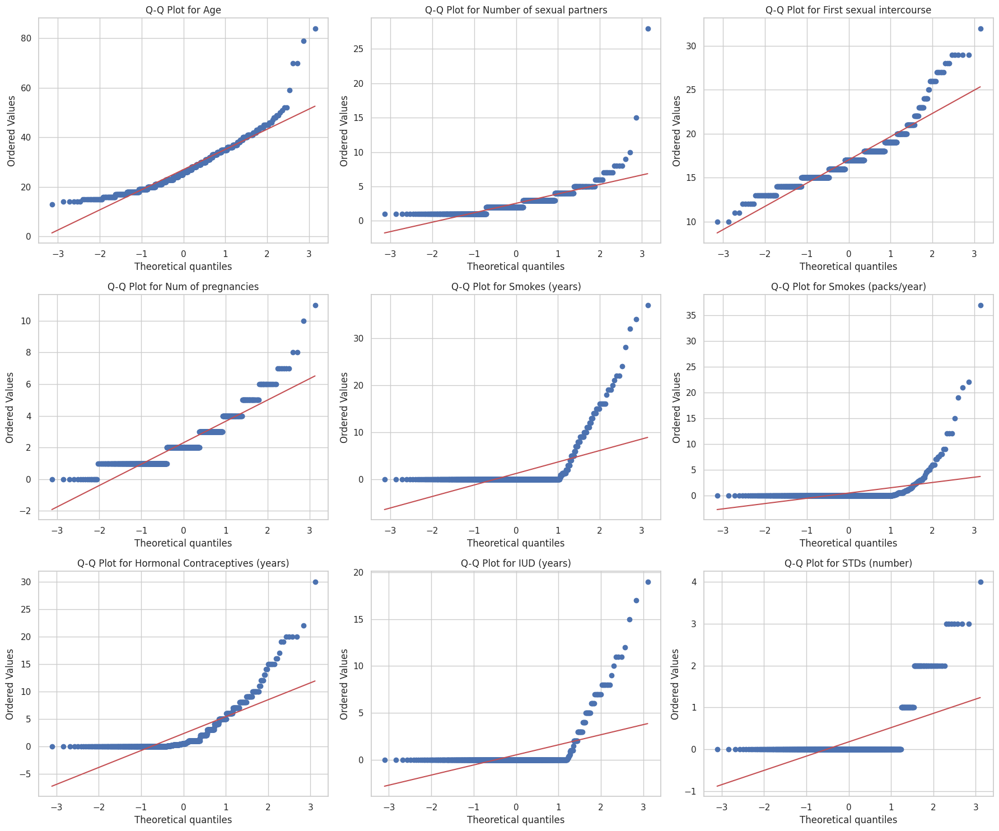

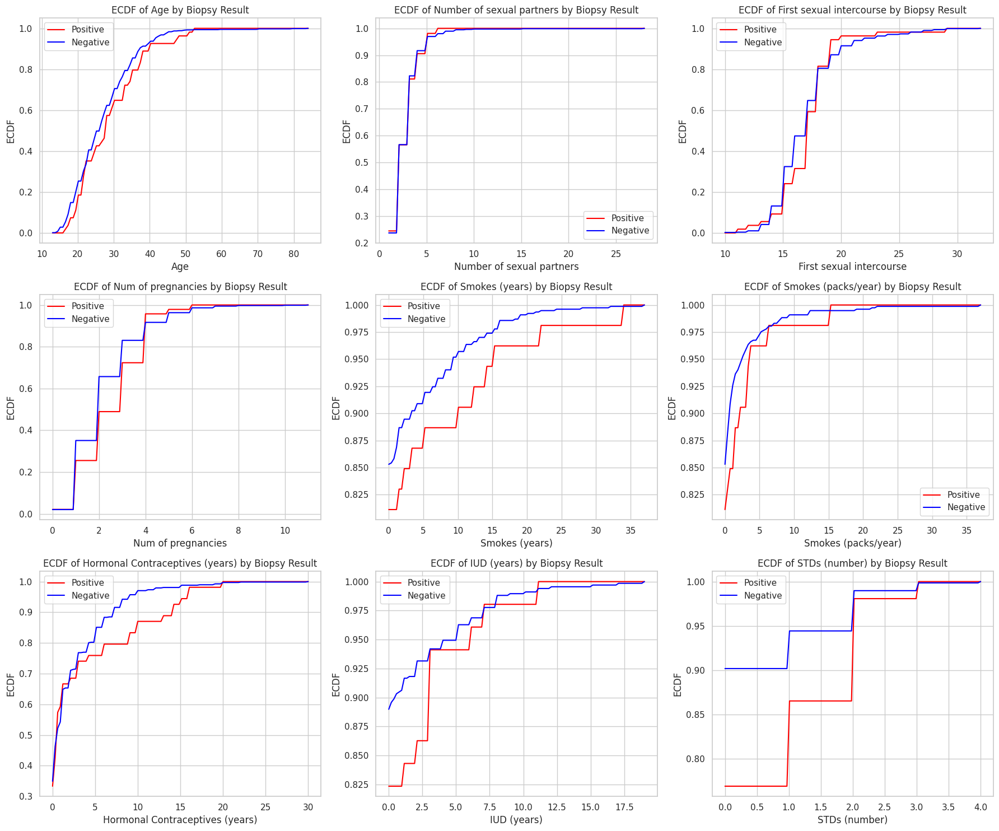

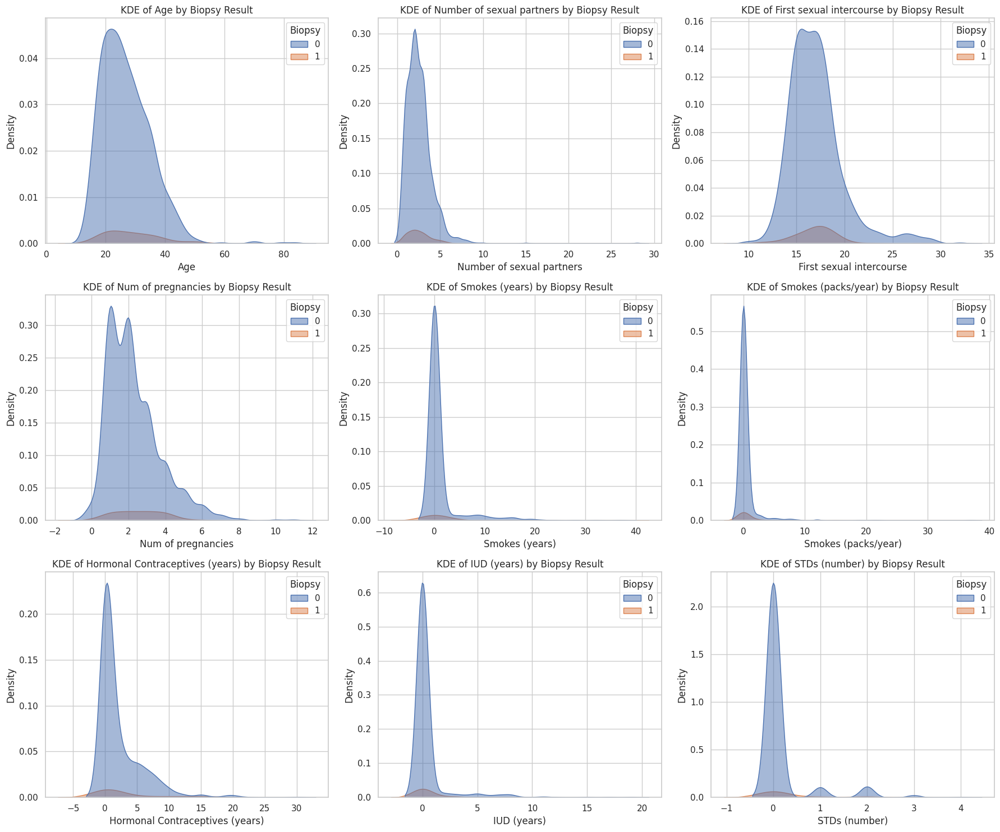

In [21]:
# 36. Q-Q plots for numerical features
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    stats.probplot(df[col].dropna(), dist="norm", plot=axes[i])
    axes[i].set_title(f'Q-Q Plot for {col}', fontsize=12)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 37. Distribution comparison using ECDF
from statsmodels.distributions.empirical_distribution import ECDF

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    ecdf_positive = ECDF(df[df['Biopsy'] == 1][col].dropna())
    ecdf_negative = ECDF(df[df['Biopsy'] == 0][col].dropna())
    
    x_pos = np.linspace(df[col].min(), df[col].max(), 100)
    x_neg = np.linspace(df[col].min(), df[col].max(), 100)
    
    axes[i].plot(x_pos, ecdf_positive(x_pos), label='Positive', color='red')
    axes[i].plot(x_neg, ecdf_negative(x_neg), label='Negative', color='blue')
    axes[i].set_title(f'ECDF of {col} by Biopsy Result', fontsize=12)
    axes[i].legend()
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('ECDF')

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 38. Kernel Density Estimation (KDE) plots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    sns.kdeplot(data=df, x=col, hue='Biopsy', ax=axes[i], fill=True, alpha=0.5)
    axes[i].set_title(f'KDE of {col} by Biopsy Result', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

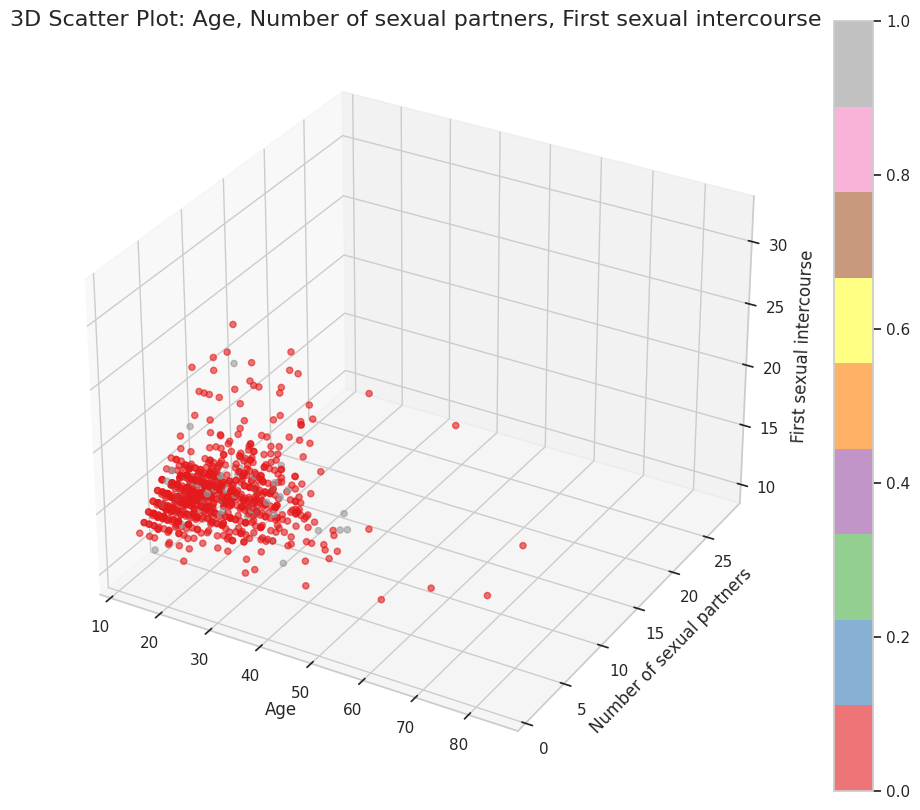

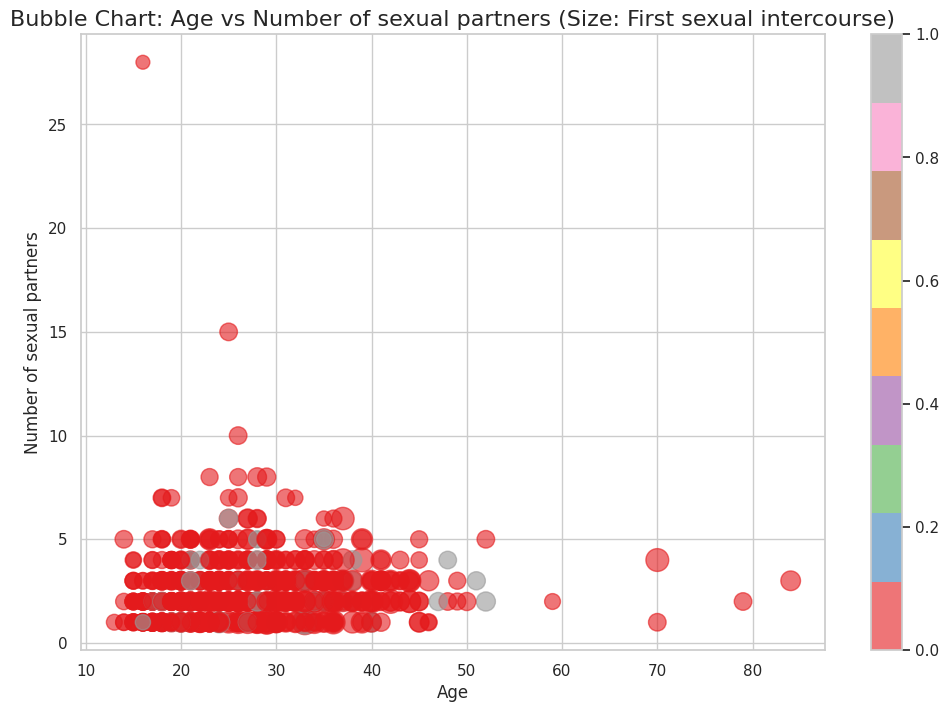

In [22]:
# 39. 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D

if len(numerical_cols) >= 3:
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    x = df[numerical_cols[0]].dropna()
    y = df[numerical_cols[1]].dropna()
    z = df[numerical_cols[2]].dropna()
    
    # Align indices
    common_index = x.index.intersection(y.index).intersection(z.index)
    x = x.loc[common_index]
    y = y.loc[common_index]
    z = z.loc[common_index]
    target = df.loc[common_index, 'Biopsy']
    
    scatter = ax.scatter(x, y, z, c=target, cmap='Set1', alpha=0.6)
    ax.set_xlabel(numerical_cols[0])
    ax.set_ylabel(numerical_cols[1])
    ax.set_zlabel(numerical_cols[2])
    plt.title(f'3D Scatter Plot: {numerical_cols[0]}, {numerical_cols[1]}, {numerical_cols[2]}', fontsize=16)
    plt.colorbar(scatter)
    plt.show()

# 40. Bubble chart
if len(numerical_cols) >= 3:
    plt.figure(figsize=(12, 8))
    bubble = plt.scatter(df[numerical_cols[0]], df[numerical_cols[1]], 
                        s=df[numerical_cols[2]]*10, 
                        c=df['Biopsy'], alpha=0.6, cmap='Set1')
    plt.xlabel(numerical_cols[0])
    plt.ylabel(numerical_cols[1])
    plt.title(f'Bubble Chart: {numerical_cols[0]} vs {numerical_cols[1]} (Size: {numerical_cols[2]})', fontsize=16)
    plt.colorbar(bubble)
    plt.show()

In [26]:
# 41. Interactive correlation heatmap
fig = px.imshow(correlation_matrix, 
                text_auto=True, 
                aspect="auto",
                color_continuous_scale='RdBu_r',
                title='Interactive Correlation Heatmap')
fig.show()

# 42. Interactive scatter matrix
if len(key_features) > 0:
    fig = px.scatter_matrix(
        df[key_features + ['Biopsy']],
        color='Biopsy',
        title='Interactive Scatter Matrix',
        dimensions=key_features,
        height=800,
        width=1000
    )
    fig.update_traces(diagonal_visible=False)
    fig.show()

# 43. Interactive parallel coordinates
if len(parallel_features) > 0:
    fig = px.parallel_coordinates(df[parallel_features].dropna(), 
                                 color='Biopsy',
                                 color_continuous_scale=px.colors.diverging.Tealrose,
                                 title='Interactive Parallel Coordinates')
    fig.show()

# 44. Interactive 3D scatter plot
if len(numerical_cols) >= 3:
    fig = px.scatter_3d(df, x=numerical_cols[0], y=numerical_cols[1], z=numerical_cols[2],
                       color='Biopsy', 
                       title=f'Interactive 3D Scatter: {numerical_cols[0]}, {numerical_cols[1]}, {numerical_cols[2]}')
    fig.show()

# 45. Interactive violin plots
fig = go.Figure()
for col in numerical_cols[:5]:
    fig.add_trace(go.Violin(x=df['Biopsy'][df[col].notna()],
                           y=df[col][df[col].notna()],
                           name=col,
                           box_visible=True,
                           meanline_visible=True))
fig.update_layout(title='Interactive Violin Plots for Key Features',
                  xaxis_title='Biopsy Result',
                  yaxis_title='Value')
fig.show()

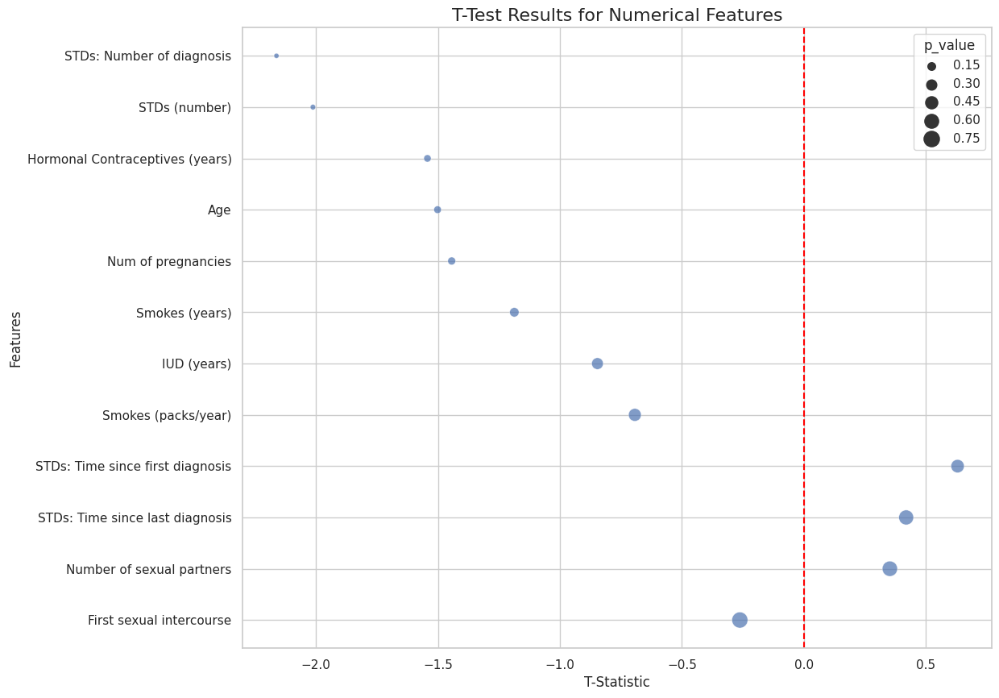

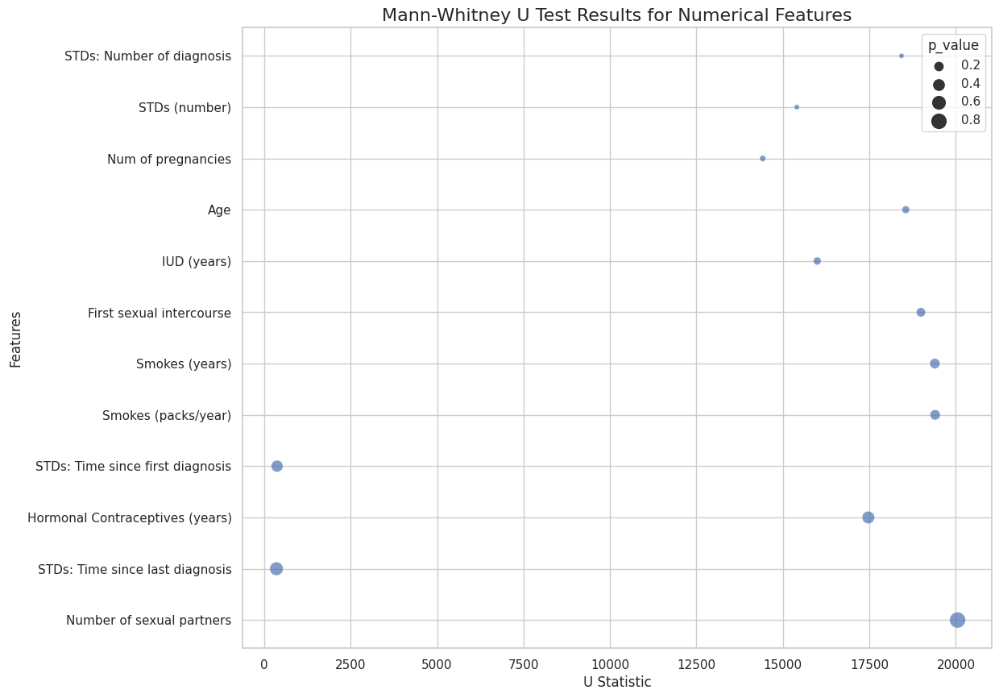

In [27]:
# 46. T-test for numerical features between classes
t_test_results = {}
for col in numerical_cols:
    group0 = df[df['Biopsy'] == 0][col].dropna()
    group1 = df[df['Biopsy'] == 1][col].dropna()
    if len(group0) > 0 and len(group1) > 0:
        t_stat, p_val = stats.ttest_ind(group0, group1, equal_var=False)
        t_test_results[col] = {'t_statistic': t_stat, 'p_value': p_val}

t_test_df = pd.DataFrame(t_test_results).T
t_test_df = t_test_df.sort_values('p_value')

plt.figure(figsize=(12, 10))
sns.scatterplot(data=t_test_df, x='t_statistic', y=t_test_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='viridis')
plt.axvline(x=0, color='red', linestyle='--')
plt.title('T-Test Results for Numerical Features', fontsize=16)
plt.xlabel('T-Statistic')
plt.ylabel('Features')
plt.show()

# 47. Mann-Whitney U test for non-normal distributions
mwu_results = {}
for col in numerical_cols:
    group0 = df[df['Biopsy'] == 0][col].dropna()
    group1 = df[df['Biopsy'] == 1][col].dropna()
    if len(group0) > 0 and len(group1) > 0:
        u_stat, p_val = stats.mannwhitneyu(group0, group1, alternative='two-sided')
        mwu_results[col] = {'u_statistic': u_stat, 'p_value': p_val}

mwu_df = pd.DataFrame(mwu_results).T
mwu_df = mwu_df.sort_values('p_value')

plt.figure(figsize=(12, 10))
sns.scatterplot(data=mwu_df, x='u_statistic', y=mwu_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='plasma')
plt.title('Mann-Whitney U Test Results for Numerical Features', fontsize=16)
plt.xlabel('U Statistic')
plt.ylabel('Features')
plt.show()

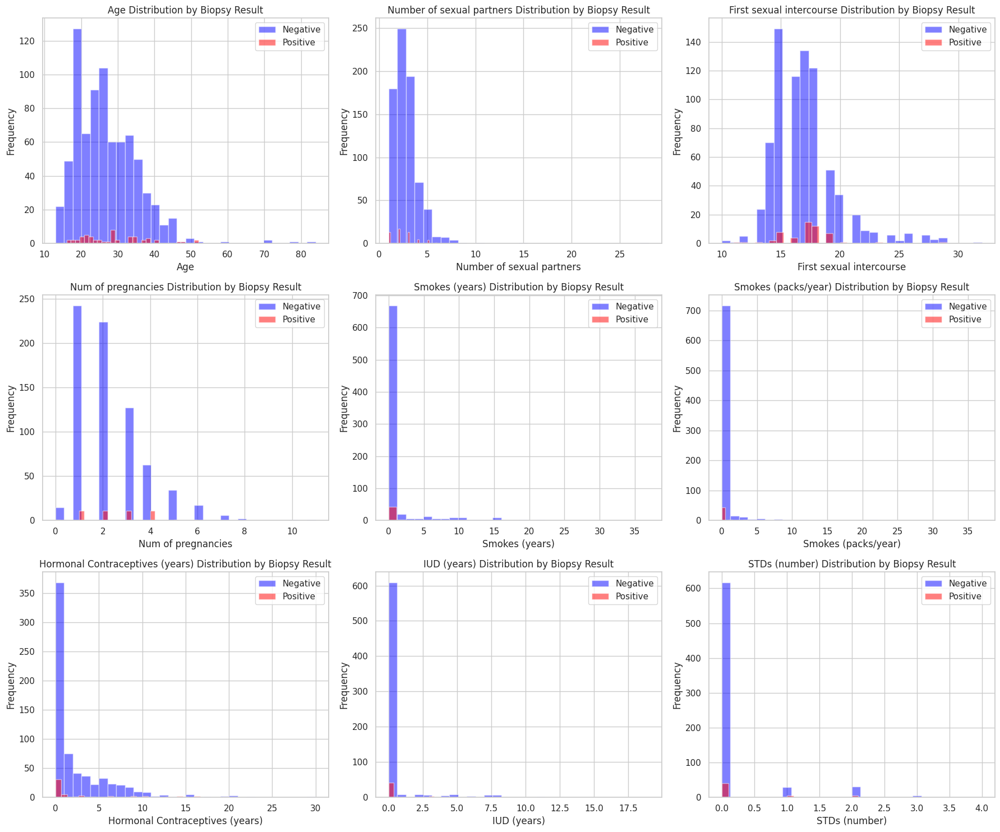

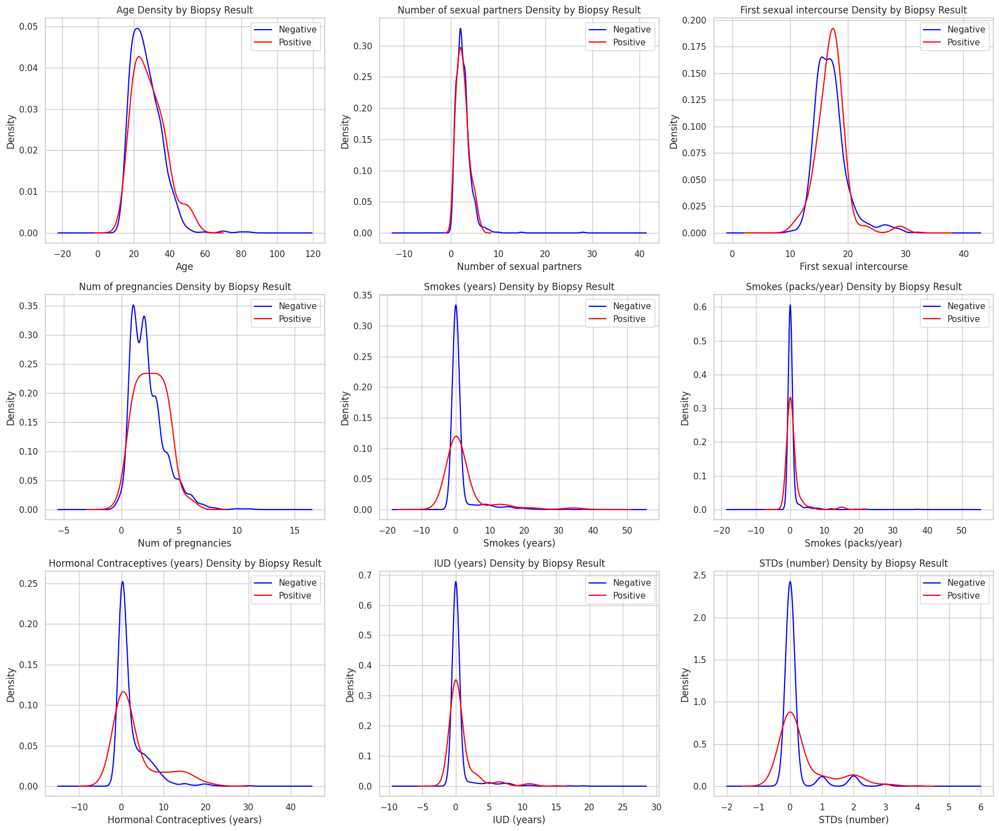

In [28]:
# 48. Overlaid histograms for key features
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    df[df['Biopsy'] == 0][col].hist(alpha=0.5, bins=30, ax=axes[i], label='Negative', color='blue')
    df[df['Biopsy'] == 1][col].hist(alpha=0.5, bins=30, ax=axes[i], label='Positive', color='red')
    axes[i].set_title(f'{col} Distribution by Biopsy Result', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 49. Density plots for key features
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:9]):
    df[df['Biopsy'] == 0][col].plot.density(ax=axes[i], label='Negative', color='blue')
    df[df['Biopsy'] == 1][col].plot.density(ax=axes[i], label='Positive', color='red')
    axes[i].set_title(f'{col} Density by Biopsy Result', fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].legend()

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

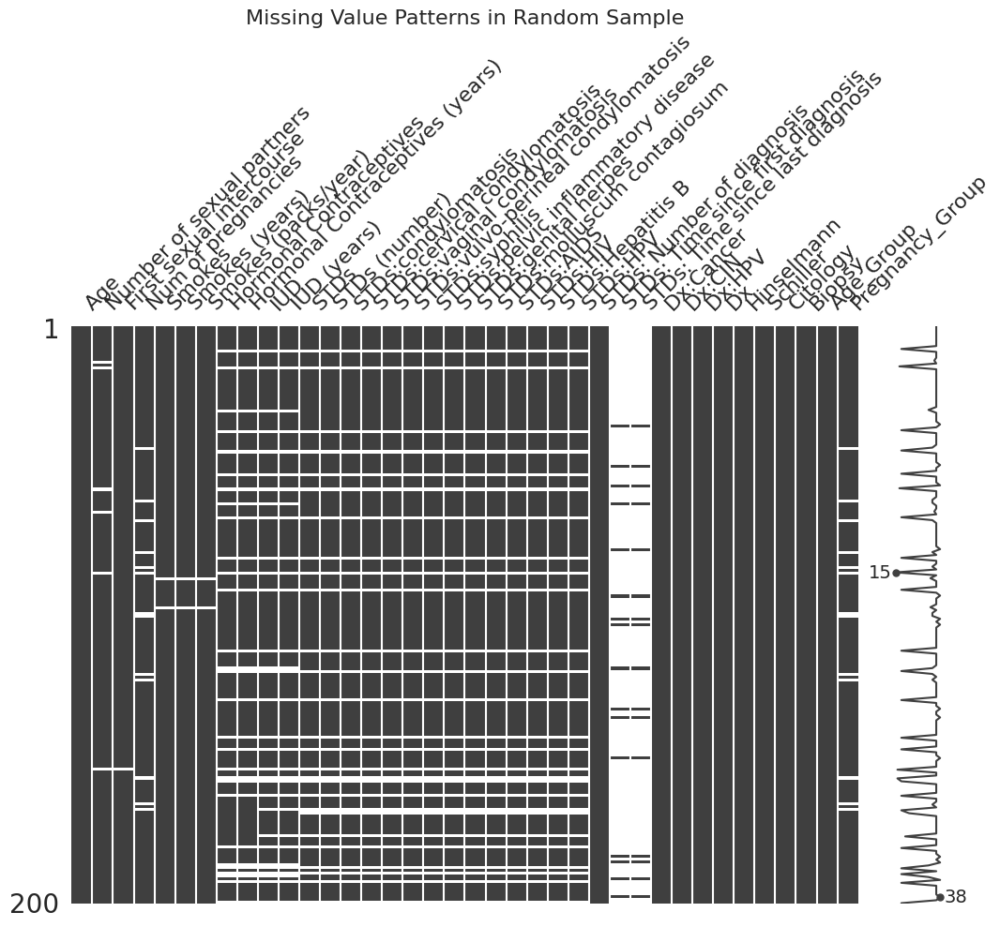

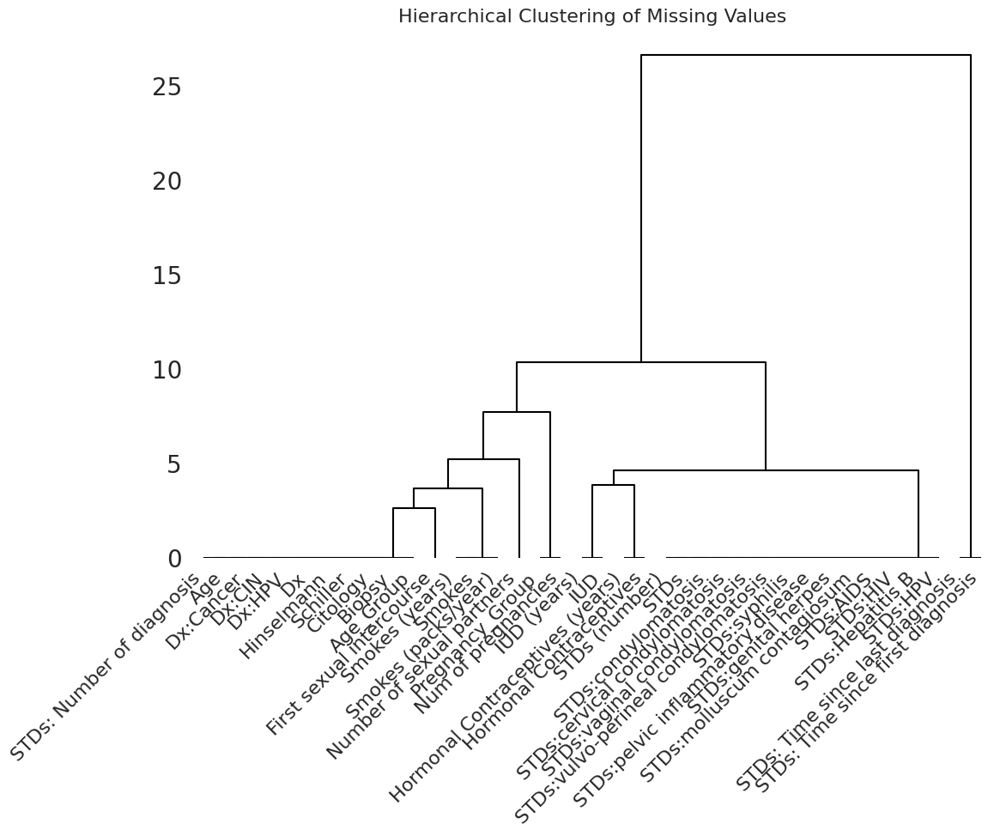

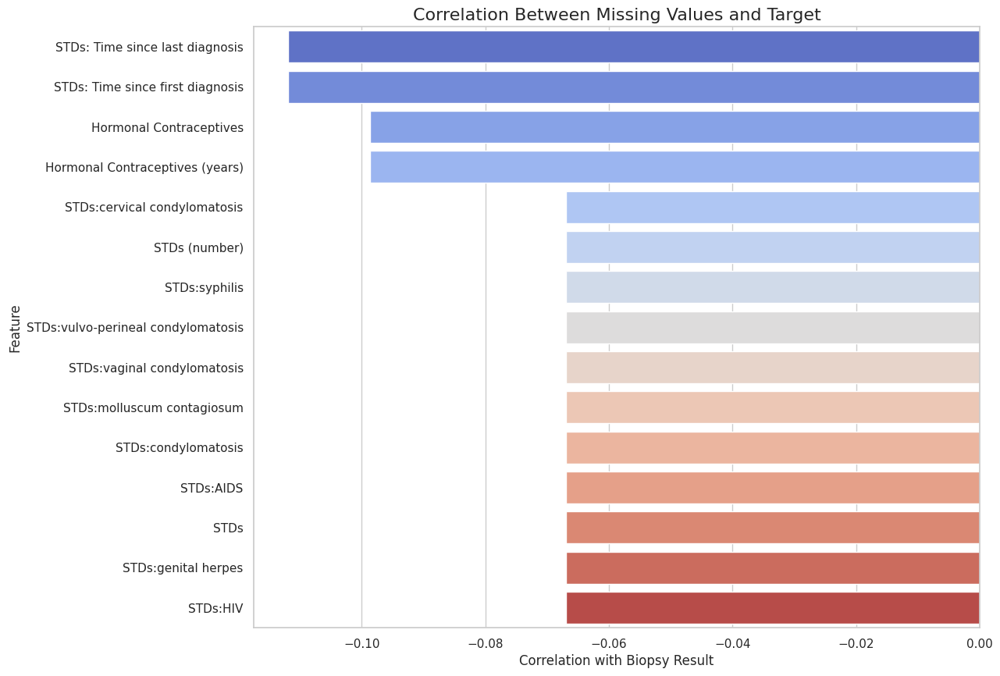

In [29]:
# 50. Missing value patterns
msno.matrix(df.sample(200), figsize=(12, 8))
plt.title('Missing Value Patterns in Random Sample', fontsize=16)
plt.show()

# 51. Missing value clustering
msno.dendrogram(df, orientation='top', figsize=(12, 8))
plt.title('Hierarchical Clustering of Missing Values', fontsize=16)
plt.show()

# 52. Missing value correlation with target
missing_target_corr = {}
for col in df.columns:
    if col != 'Biopsy':
        missing_indicator = df[col].isnull().astype(int)
        correlation = missing_indicator.corr(df['Biopsy'])
        missing_target_corr[col] = correlation

missing_corr_df = pd.DataFrame(list(missing_target_corr.items()), 
                               columns=['Feature', 'Missing_Corr_with_Target'])
missing_corr_df = missing_corr_df.sort_values('Missing_Corr_with_Target', key=abs, ascending=False)

plt.figure(figsize=(12, 10))
sns.barplot(data=missing_corr_df.head(15), x='Missing_Corr_with_Target', y='Feature', palette='coolwarm')
plt.title('Correlation Between Missing Values and Target', fontsize=16)
plt.xlabel('Correlation with Biopsy Result')
plt.show()

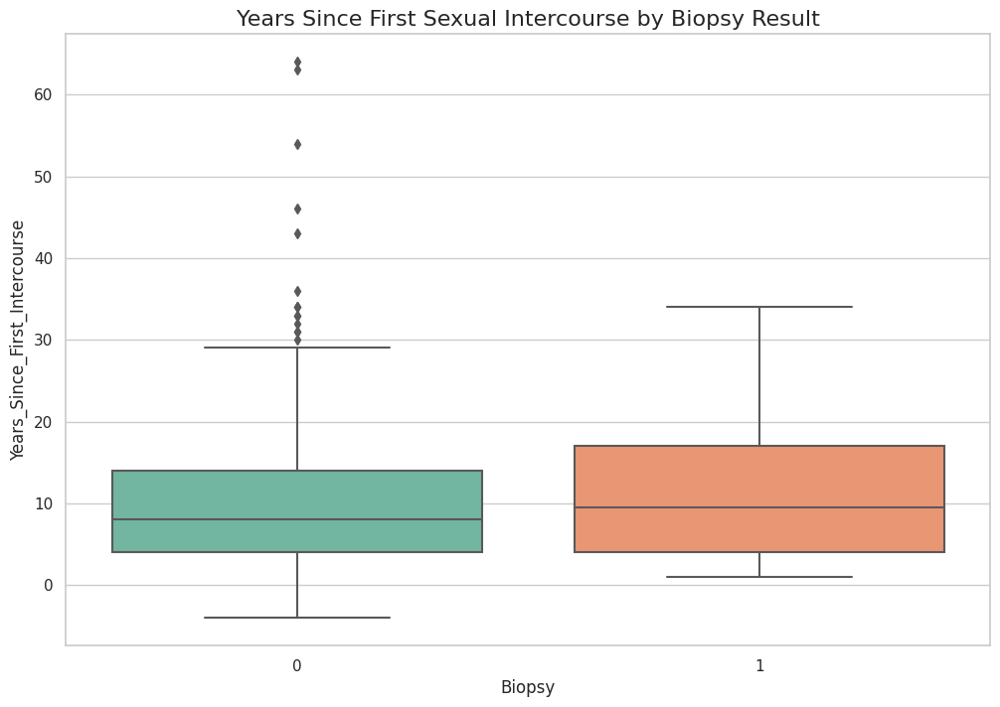

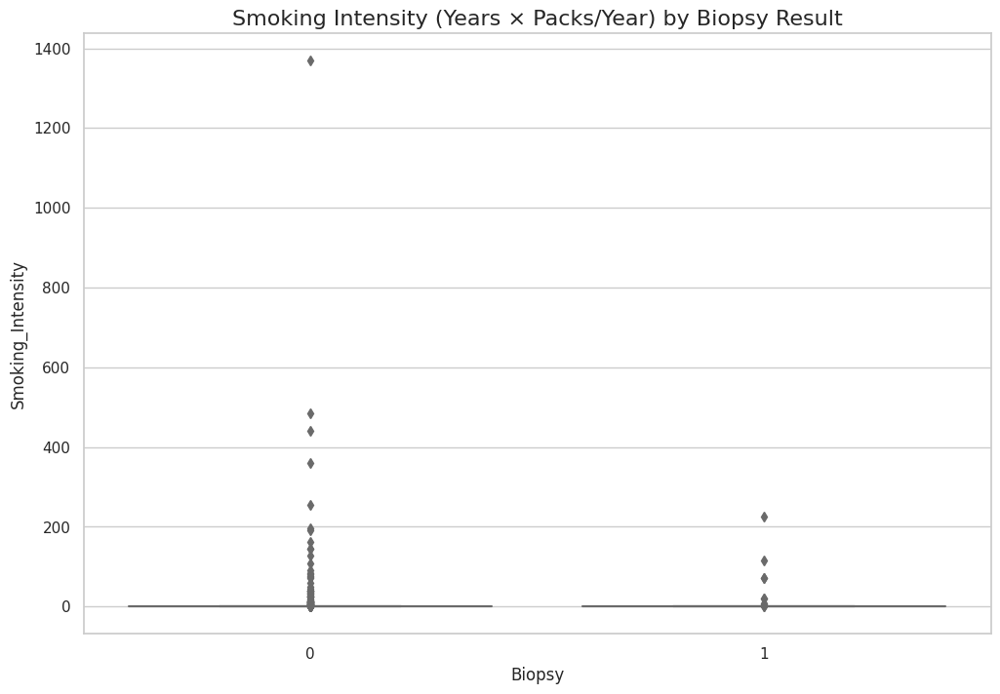

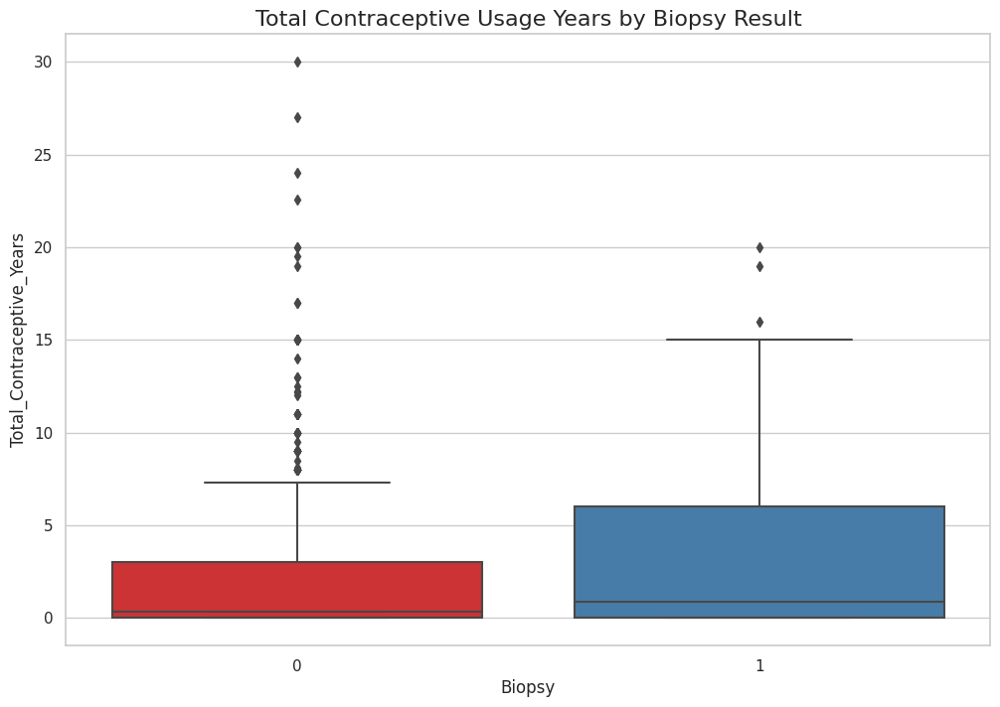

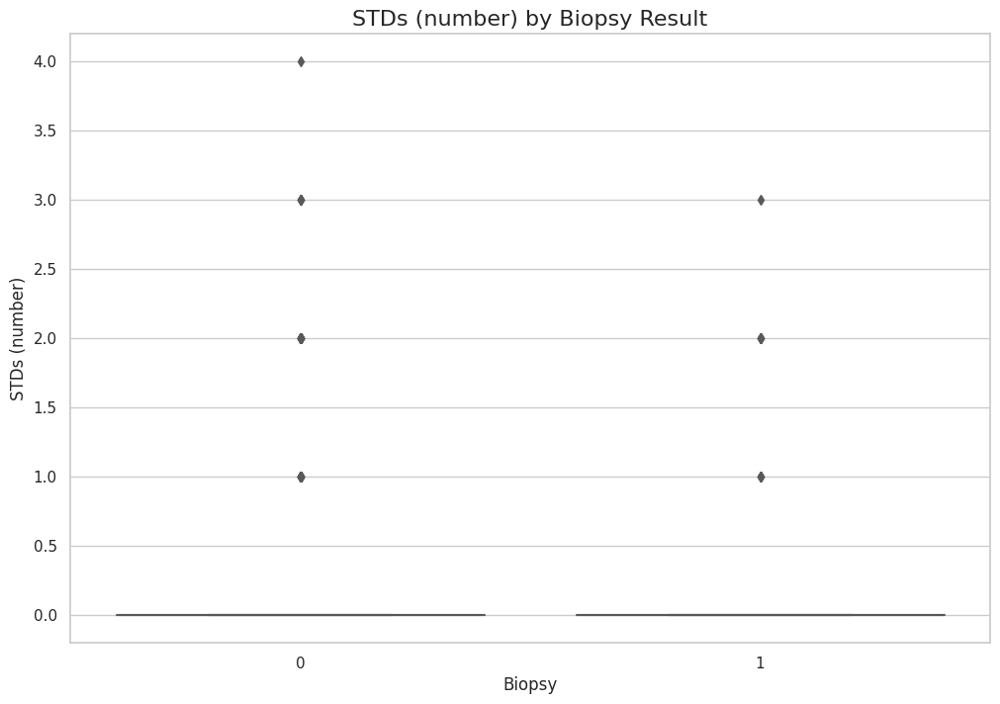

In [30]:
# 53. Age at first sexual intercourse vs current age
if 'First sexual intercourse' in df.columns:
    df['Years_Since_First_Intercourse'] = df['Age'] - df['First sexual intercourse']
    
    plt.figure(figsize=(12, 8))
    sns.boxplot(data=df, x='Biopsy', y='Years_Since_First_Intercourse', palette='Set2')
    plt.title('Years Since First Sexual Intercourse by Biopsy Result', fontsize=16)
    plt.show()

# 54. Smoking intensity
if 'Smokes (years)' in df.columns and 'Smokes (packs/year)' in df.columns:
    df['Smoking_Intensity'] = df['Smokes (years)'] * df['Smokes (packs/year)']
    
    plt.figure(figsize=(12, 8))
    sns.boxplot(data=df, x='Biopsy', y='Smoking_Intensity', palette='Set3')
    plt.title('Smoking Intensity (Years × Packs/Year) by Biopsy Result', fontsize=16)
    plt.show()

# 55. Contraceptive usage duration
contraceptive_cols = ['Hormonal Contraceptives (years)', 'IUD (years)']
available_contraceptive_cols = [col for col in contraceptive_cols if col in df.columns]

if available_contraceptive_cols:
    df['Total_Contraceptive_Years'] = df[available_contraceptive_cols].sum(axis=1)
    
    plt.figure(figsize=(12, 8))
    sns.boxplot(data=df, x='Biopsy', y='Total_Contraceptive_Years', palette='Set1')
    plt.title('Total Contraceptive Usage Years by Biopsy Result', fontsize=16)
    plt.show()

# 56. STD count vs cancer risk
std_cols = [col for col in df.columns if 'STDs' in col and 'number' in col.lower()]
if std_cols:
    plt.figure(figsize=(12, 8))
    sns.boxplot(data=df, x='Biopsy', y=std_cols[0], palette='Set2')
    plt.title(f'{std_cols[0]} by Biopsy Result', fontsize=16)
    plt.show()

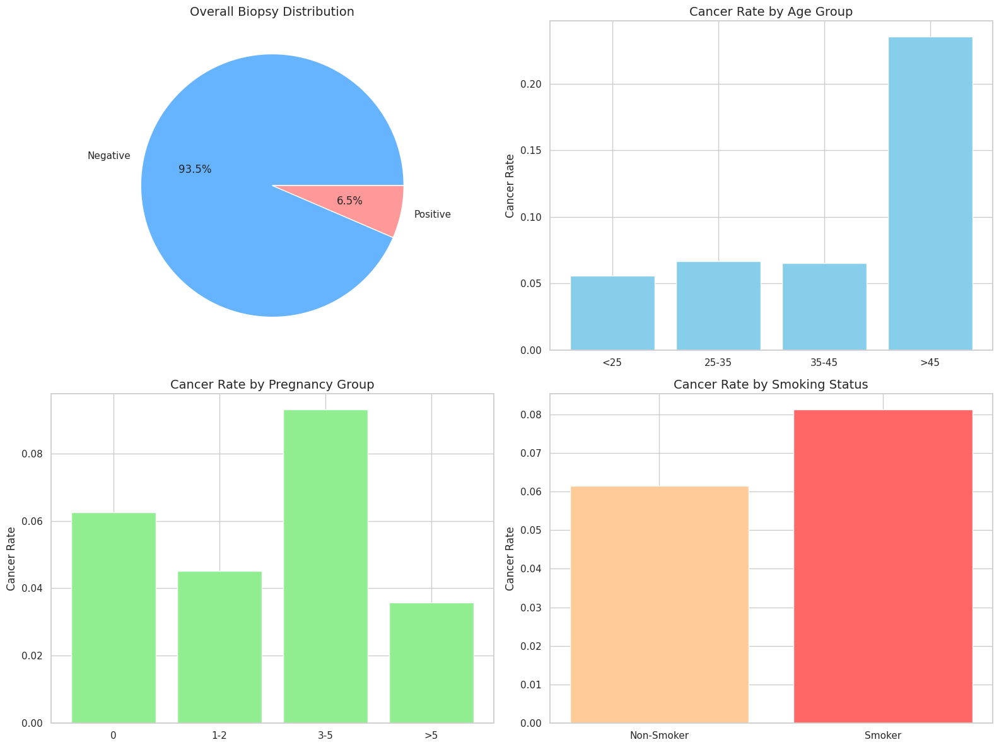

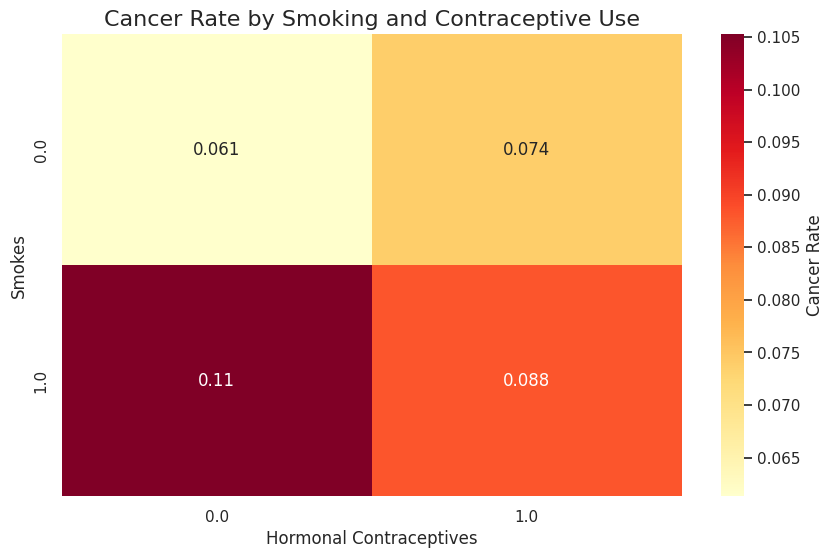

In [31]:
# 57. Target distribution across multiple features
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))
axes = axes.flatten()

axes[0].pie(df['Biopsy'].value_counts(), labels=['Negative', 'Positive'], 
           autopct='%1.1f%%', colors=['#66b3ff', '#ff9999'])
axes[0].set_title('Overall Biopsy Distribution', fontsize=14)

if 'Age_Group' in df.columns:
    biopsy_by_age = df.groupby('Age_Group')['Biopsy'].mean()
    axes[1].bar(biopsy_by_age.index, biopsy_by_age.values, color='skyblue')
    axes[1].set_title('Cancer Rate by Age Group', fontsize=14)
    axes[1].set_ylabel('Cancer Rate')

if 'Pregnancy_Group' in df.columns:
    biopsy_by_pregnancy = df.groupby('Pregnancy_Group')['Biopsy'].mean()
    axes[2].bar(biopsy_by_pregnancy.index, biopsy_by_pregnancy.values, color='lightgreen')
    axes[2].set_title('Cancer Rate by Pregnancy Group', fontsize=14)
    axes[2].set_ylabel('Cancer Rate')

# Smoking status vs cancer rate
if 'Smokes' in df.columns:
    biopsy_by_smoking = df.groupby('Smokes')['Biopsy'].mean()
    axes[3].bar(['Non-Smoker', 'Smoker'], biopsy_by_smoking.values, color=['#ffcc99', '#ff6666'])
    axes[3].set_title('Cancer Rate by Smoking Status', fontsize=14)
    axes[3].set_ylabel('Cancer Rate')

plt.tight_layout()
plt.show()

# 58. Cancer rate by multiple factors
if 'Smokes' in df.columns and 'Hormonal Contraceptives' in df.columns:
    biopsy_by_factors = df.groupby(['Smokes', 'Hormonal Contraceptives'])['Biopsy'].mean().unstack()
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(biopsy_by_factors, annot=True, cmap='YlOrRd', cbar_kws={'label': 'Cancer Rate'})
    plt.title('Cancer Rate by Smoking and Contraceptive Use', fontsize=16)
    plt.xlabel('Hormonal Contraceptives')
    plt.ylabel('Smokes')
    plt.show()

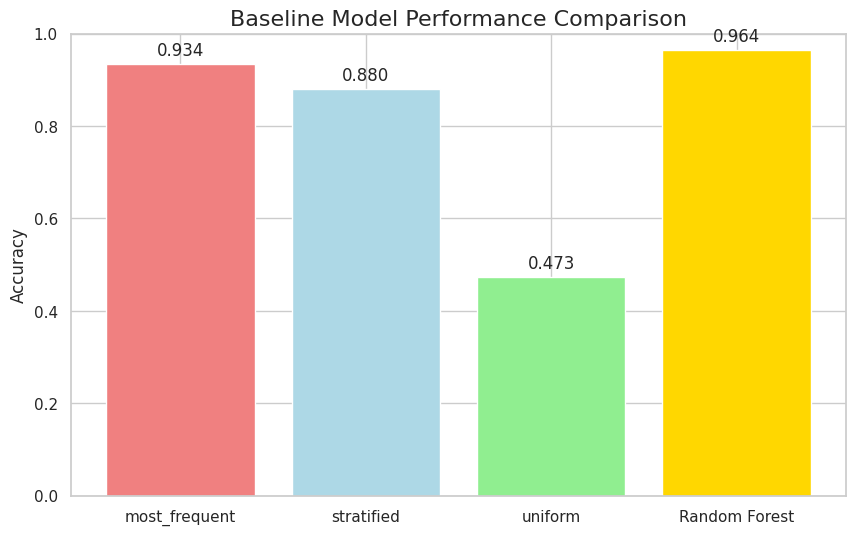

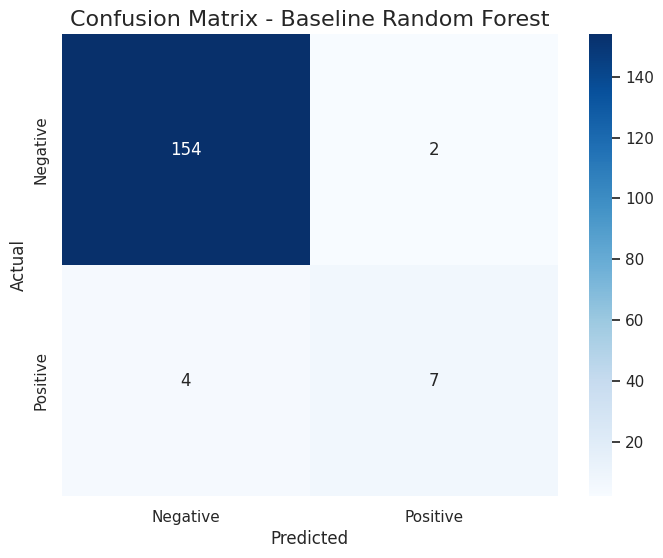

In [32]:
# 59. Baseline model performance visualization
from sklearn.dummy import DummyClassifier

# Prepare data for baseline
X_baseline = df.drop(['Biopsy', 'Age_Group', 'Pregnancy_Group'], axis=1)
y_baseline = df['Biopsy']

# Handle missing values
X_baseline = X_baseline.fillna(X_baseline.median())
X_baseline = X_baseline.apply(lambda x: pd.to_numeric(x, errors='coerce')).fillna(0)

# Split data
X_train_base, X_test_base, y_train_base, y_test_base = train_test_split(
    X_baseline, y_baseline, test_size=0.2, random_state=42, stratify=y_baseline)

# Baseline models
strategies = ['most_frequent', 'stratified', 'uniform']
baseline_scores = {}

for strategy in strategies:
    dummy = DummyClassifier(strategy=strategy, random_state=42)
    dummy.fit(X_train_base, y_train_base)
    score = dummy.score(X_test_base, y_test_base)
    baseline_scores[strategy] = score

# Actual model for comparison
rf_baseline = RandomForestClassifier(n_estimators=100, random_state=42)
rf_baseline.fit(X_train_base, y_train_base)
rf_score = rf_baseline.score(X_test_base, y_test_base)
baseline_scores['Random Forest'] = rf_score

# Visualization
plt.figure(figsize=(10, 6))
strategies_list = list(baseline_scores.keys())
scores_list = list(baseline_scores.values())
colors = ['lightcoral', 'lightblue', 'lightgreen', 'gold']

bars = plt.bar(strategies_list, scores_list, color=colors)
plt.title('Baseline Model Performance Comparison', fontsize=16)
plt.ylabel('Accuracy')
plt.ylim(0, 1)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{height:.3f}', ha='center', va='bottom')

plt.show()

# 60. Confusion matrix for baseline Random Forest
y_pred_base = rf_baseline.predict(X_test_base)
cm = confusion_matrix(y_test_base, y_pred_base)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'], 
            yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix - Baseline Random Forest', fontsize=16)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

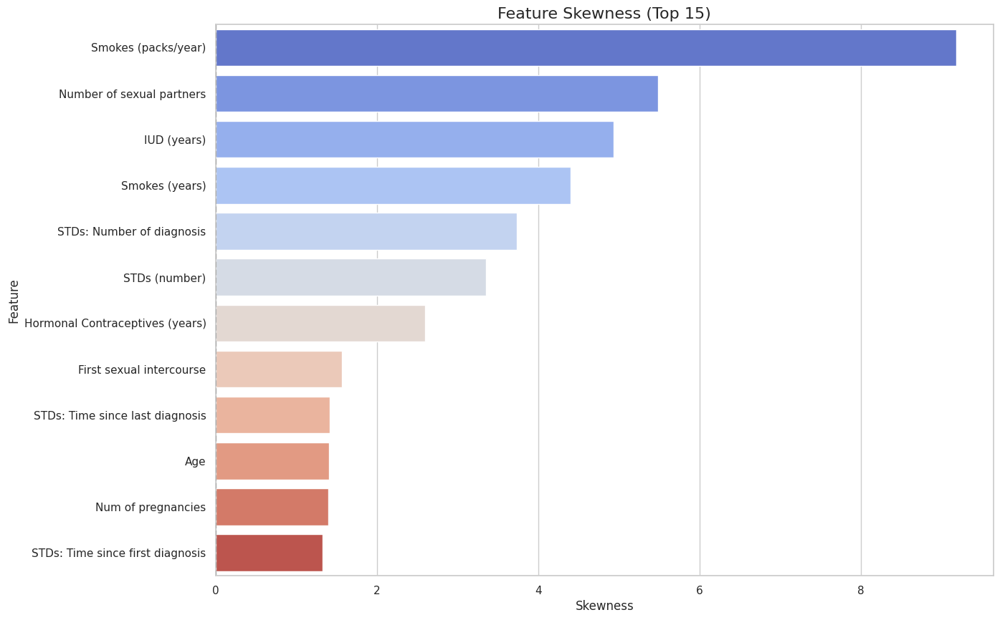

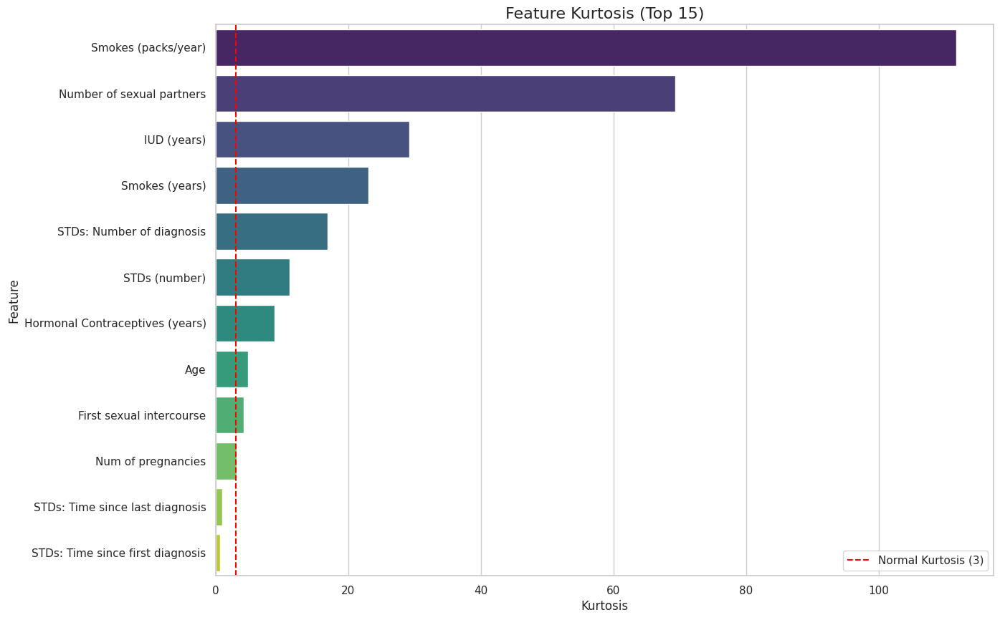

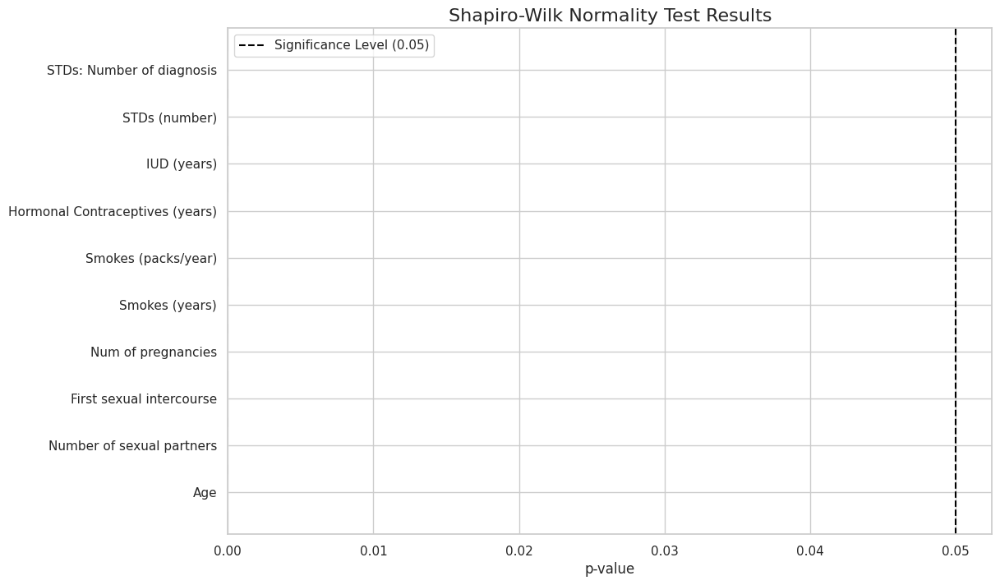

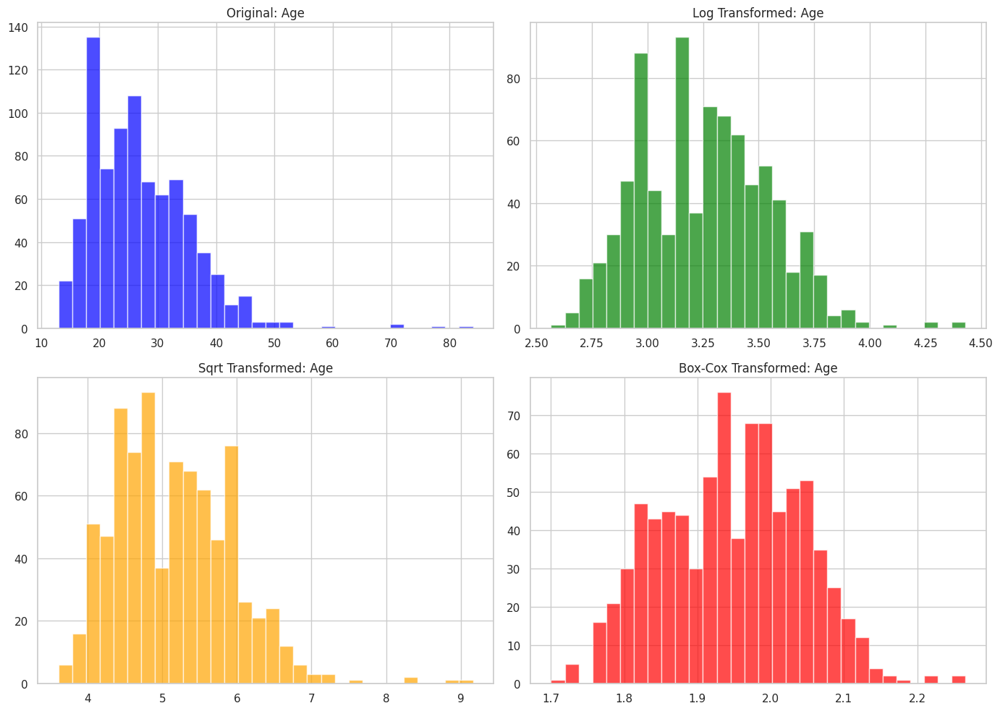

In [50]:
# 61. Distribution skewness and kurtosis analysis
skewness = {}
kurtosis = {}
for col in numerical_cols:
    skewness[col] = df[col].skew()
    kurtosis[col] = df[col].kurt()

skew_df = pd.DataFrame({'Feature': list(skewness.keys()), 'Skewness': list(skewness.values())})
kurt_df = pd.DataFrame({'Feature': list(kurtosis.keys()), 'Kurtosis': list(kurtosis.values())})

# Skewness visualization
plt.figure(figsize=(14, 10))
sns.barplot(data=skew_df.sort_values('Skewness', key=abs, ascending=False).head(15), 
            x='Skewness', y='Feature', palette='coolwarm')
plt.title('Feature Skewness (Top 15)', fontsize=16)
plt.axvline(x=0, color='black', linestyle='--')
plt.xlabel('Skewness')
plt.show()

# Kurtosis visualization
plt.figure(figsize=(14, 10))
sns.barplot(data=kurt_df.sort_values('Kurtosis', key=abs, ascending=False).head(15), 
            x='Kurtosis', y='Feature', palette='viridis')
plt.title('Feature Kurtosis (Top 15)', fontsize=16)
plt.axvline(x=3, color='red', linestyle='--', label='Normal Kurtosis (3)')
plt.xlabel('Kurtosis')
plt.legend()
plt.show()

# 62. Normality test results (Shapiro-Wilk)
normality_results = {}
for col in numerical_cols[:10]:  # Limit to first 10 to avoid excessive computation
    stat, p = stats.shapiro(df[col].dropna())
    normality_results[col] = {'statistic': stat, 'p_value': p}

normality_df = pd.DataFrame(normality_results).T
normality_df['is_normal'] = normality_df['p_value'] > 0.05

plt.figure(figsize=(12, 8))
colors = ['red' if not normal else 'green' for normal in normality_df['is_normal']]
plt.barh(normality_df.index, normality_df['p_value'], color=colors, alpha=0.7)
plt.axvline(x=0.05, color='black', linestyle='--', label='Significance Level (0.05)')
plt.title('Shapiro-Wilk Normality Test Results', fontsize=16)
plt.xlabel('p-value')
plt.legend()
plt.show()

# 63. Distribution transformation comparison
if numerical_cols:
    col = numerical_cols[0]  # Take first numerical column
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Original
    axes[0,0].hist(df[col].dropna(), bins=30, alpha=0.7, color='blue')
    axes[0,0].set_title(f'Original: {col}')
    
    # Log transformation (add small constant to handle zeros/negatives)
    data_pos = df[col].dropna()
    data_pos = data_pos - data_pos.min() + 1e-6 if data_pos.min() <= 0 else data_pos
    axes[0,1].hist(np.log(data_pos), bins=30, alpha=0.7, color='green')
    axes[0,1].set_title(f'Log Transformed: {col}')
    
    # Square root transformation
    data_nonneg = df[col].dropna()
    data_nonneg = data_nonneg - data_nonneg.min() if data_nonneg.min() < 0 else data_nonneg
    axes[1,0].hist(np.sqrt(data_nonneg), bins=30, alpha=0.7, color='orange')
    axes[1,0].set_title(f'Sqrt Transformed: {col}')
    
    # Box-Cox transformation (only for positive data)
    data_pos_bc = df[col].dropna()
    if data_pos_bc.min() > 0:
        transformed, _ = stats.boxcox(data_pos_bc)
        axes[1,1].hist(transformed, bins=30, alpha=0.7, color='red')
        axes[1,1].set_title(f'Box-Cox Transformed: {col}')
    else:
        axes[1,1].text(0.5, 0.5, 'Not applicable\n(non-positive data)', 
                       ha='center', va='center', transform=axes[1,1].transAxes)
        axes[1,1].set_title(f'Box-Cox: {col}')
    
    plt.tight_layout()
    plt.show()

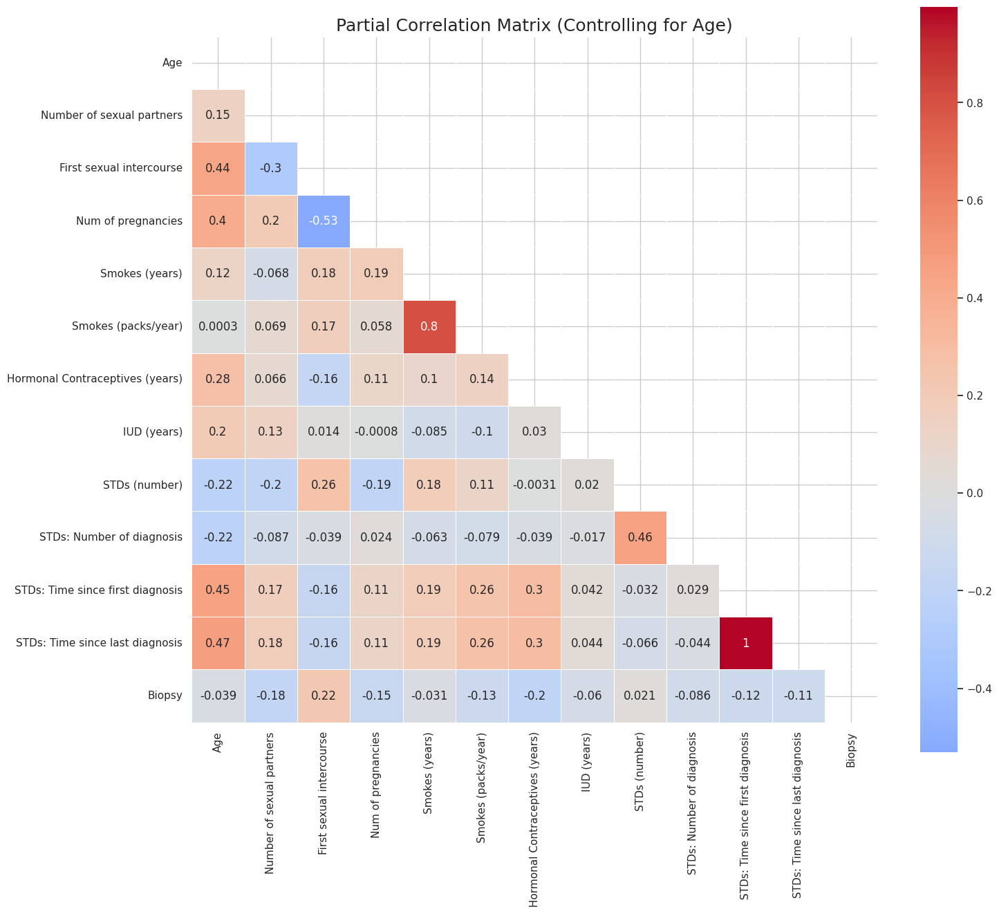

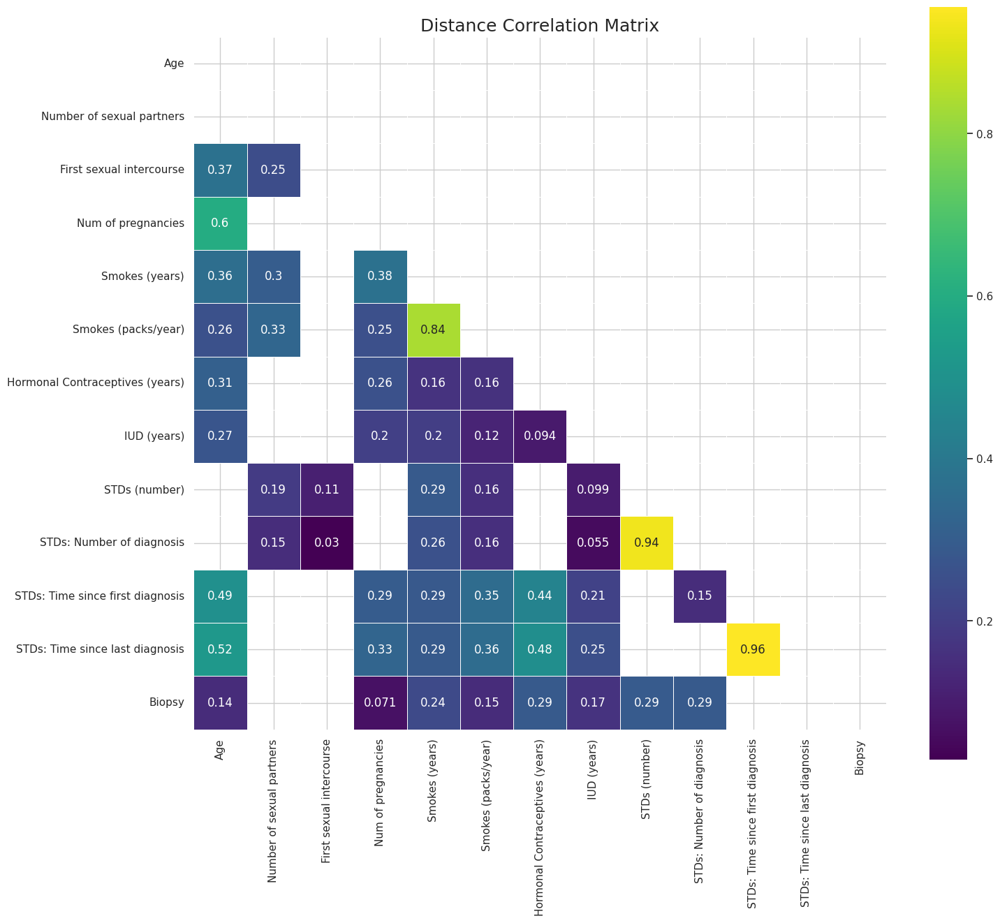

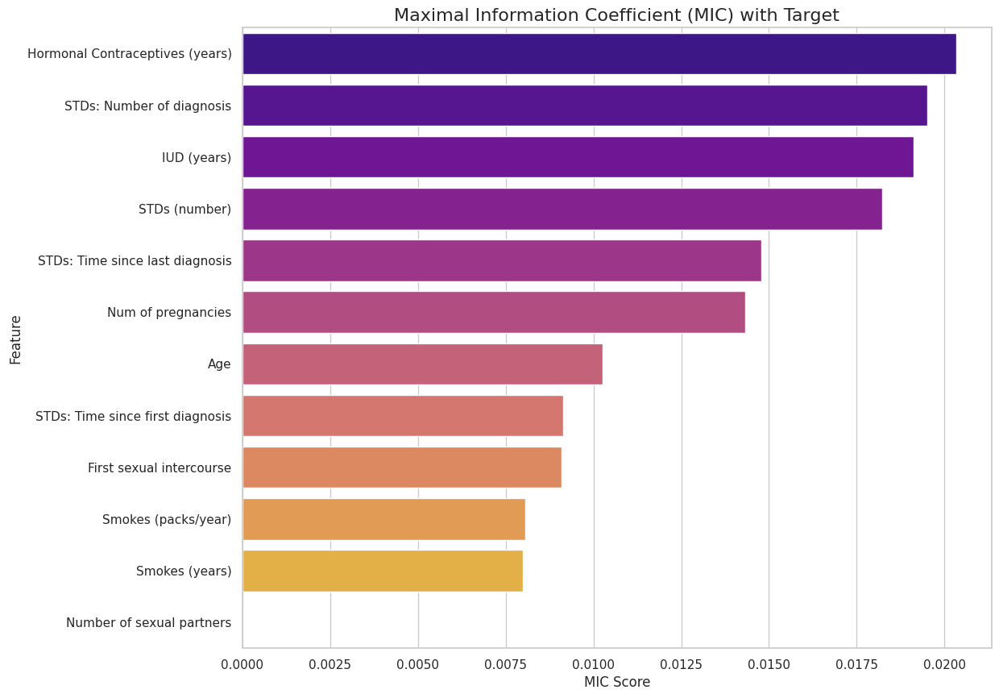

In [52]:
# 64. Partial correlation matrix
from sklearn.linear_model import LinearRegression

def partial_corr(df, x, y, controls):
    """Calculate partial correlation between x and y controlling for controls"""
    # Regress x on controls
    model_x = LinearRegression().fit(df[controls], df[x])
    res_x = df[x] - model_x.predict(df[controls])
    
    # Regress y on controls
    model_y = LinearRegression().fit(df[controls], df[y])
    res_y = df[y] - model_y.predict(df[controls])
    
    # Correlation between residuals
    return np.corrcoef(res_x, res_y)[0, 1]

# Calculate partial correlations controlling for age
numerical_with_target = numerical_cols + ['Biopsy']
partial_corr_matrix = np.zeros((len(numerical_with_target), len(numerical_with_target)))
np.fill_diagonal(partial_corr_matrix, 1)

for i, x in enumerate(numerical_with_target):
    for j, y in enumerate(numerical_with_target):
        if i != j:
            controls = [col for col in numerical_with_target if col not in [x, y, 'Biopsy']]
            if 'Age' in controls:
                controls = ['Age']  # Only control for age
            elif controls:
                controls = [controls[0]]  # Take first control if age not available
            else:
                controls = []
            
            if controls:
                try:
                    partial_corr_matrix[i, j] = partial_corr(df.dropna(), x, y, controls)
                except:
                    partial_corr_matrix[i, j] = np.nan
            else:
                partial_corr_matrix[i, j] = df[x].corr(df[y])

# Visualization
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(partial_corr_matrix, dtype=bool))
sns.heatmap(partial_corr_matrix, mask=mask, annot=True, cmap='coolwarm', 
            center=0, square=True, linewidths=0.5, 
            xticklabels=numerical_with_target, yticklabels=numerical_with_target)
plt.title('Partial Correlation Matrix (Controlling for Age)', fontsize=18)
plt.show()

# 65. Distance correlation heatmap
def distance_correlation(x, y):
    """Calculate distance correlation between two variables"""
    x = np.asarray(x)
    y = np.asarray(y)
    
    a = np.zeros((len(x), len(x)))
    b = np.zeros((len(y), len(y)))
    
    for i in range(len(x)):
        for j in range(len(x)):
            a[i, j] = abs(x[i] - x[j])
            b[i, j] = abs(y[i] - y[j])
    
    A = a - a.mean(axis=0) - a.mean(axis=1) + a.mean()
    B = b - b.mean(axis=0) - b.mean(axis=1) + b.mean()
    
    dcov = np.sqrt((A * B).sum() / (len(x) ** 2))
    dvar_x = np.sqrt((A * A).sum() / (len(x) ** 2))
    dvar_y = np.sqrt((B * B).sum() / (len(y) ** 2))
    
    return dcov / np.sqrt(dvar_x * dvar_y) if dvar_x * dvar_y > 0 else 0

# Calculate distance correlation matrix
dist_corr_matrix = np.zeros((len(numerical_with_target), len(numerical_with_target)))

for i, x in enumerate(numerical_with_target):
    for j, y in enumerate(numerical_with_target):
        # Drop rows with NaNs in either column
        valid_idx = df[[x, y]].dropna().index
        x_vals = df.loc[valid_idx, x].values
        y_vals = df.loc[valid_idx, y].values
        
        dist_corr_matrix[i, j] = distance_correlation(x_vals, y_vals)


# Visualization
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(dist_corr_matrix, dtype=bool))
sns.heatmap(dist_corr_matrix, mask=mask, annot=True, cmap='viridis', 
            square=True, linewidths=0.5, 
            xticklabels=numerical_with_target, yticklabels=numerical_with_target)
plt.title('Distance Correlation Matrix', fontsize=18)
plt.show()

# 66. Maximal Information Coefficient (MIC) heatmap
from sklearn.feature_selection import mutual_info_classif

# Calculate MIC for numerical features with target
mic_scores = {}
for col in numerical_cols:
    try:
        mic = mutual_info_classif(df[[col]].fillna(df[col].median()), 
                                 df['Biopsy'].fillna(df['Biopsy'].mode()[0]), 
                                 random_state=42)[0]
        mic_scores[col] = mic
    except:
        mic_scores[col] = 0

mic_df = pd.DataFrame(list(mic_scores.items()), columns=['Feature', 'MIC'])
mic_df = mic_df.sort_values('MIC', ascending=False)

plt.figure(figsize=(12, 10))
sns.barplot(data=mic_df.head(15), x='MIC', y='Feature', palette='plasma')
plt.title('Maximal Information Coefficient (MIC) with Target', fontsize=16)
plt.xlabel('MIC Score')
plt.show()

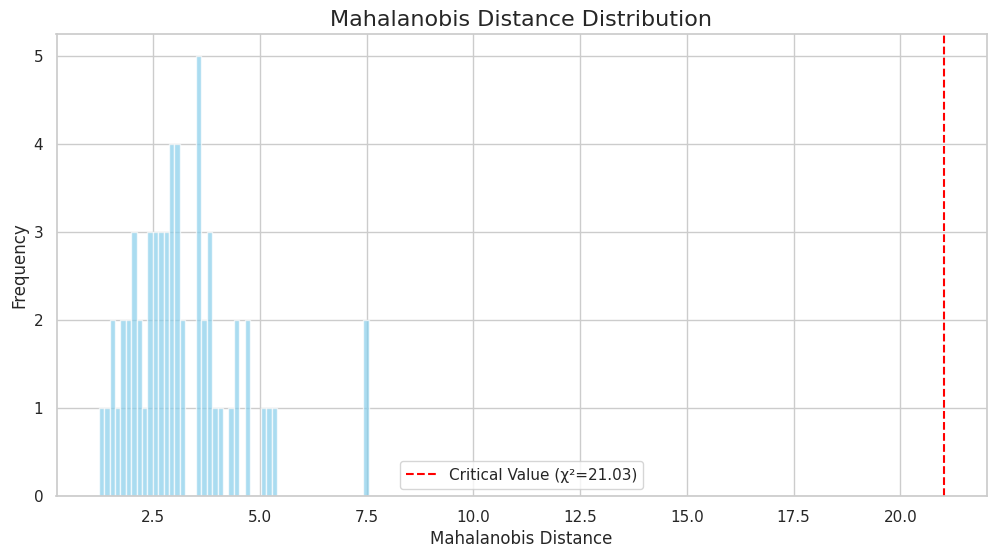

DBSCAN detected 59 outliers (100.00%)


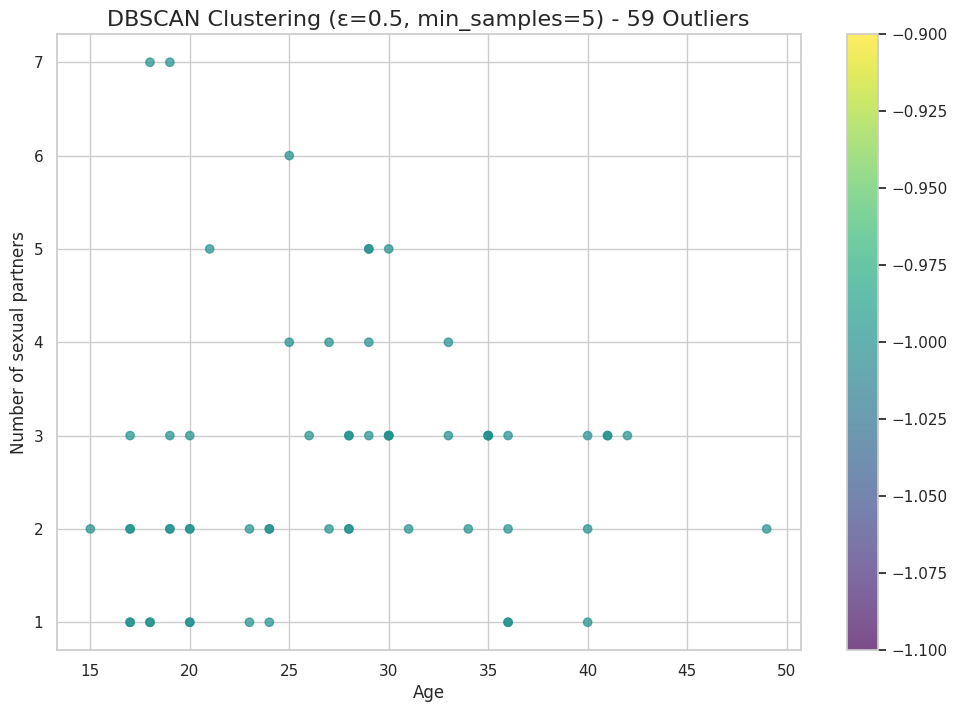

One-Class SVM detected 5 outliers (8.47%)


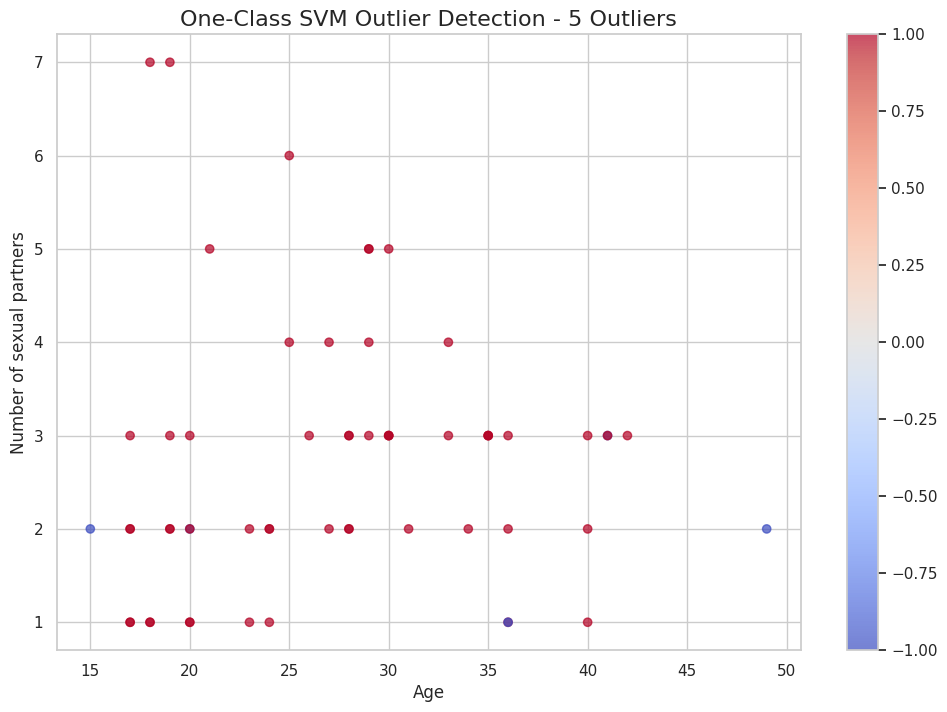

In [54]:
# 67. Mahalanobis distance for multivariate outlier detection
from scipy.spatial.distance import mahalanobis

def mahalanobis_distance(x, mean, cov_inv):
    return mahalanobis(x, mean, cov_inv)

# Calculate Mahalanobis distance for numerical features
X_num = df[numerical_cols].dropna()
mean_vec = X_num.mean().values
cov_matrix = np.cov(X_num.values.T)
cov_inv = np.linalg.inv(cov_matrix)

mahal_distances = []
for i in range(X_num.shape[0]):
    dist = mahalanobis_distance(X_num.iloc[i].values, mean_vec, cov_inv)
    mahal_distances.append(dist)

# Add to dataframe
X_num_with_mahal = X_num.copy()
X_num_with_mahal['Mahalanobis_Distance'] = mahal_distances

# Critical value for chi-square distribution
from scipy.stats import chi2
critical_value = chi2.ppf(0.95, df=len(numerical_cols))

# Identify outliers
X_num_with_mahal['Is_Outlier'] = X_num_with_mahal['Mahalanobis_Distance'] > critical_value

plt.figure(figsize=(12, 6))
plt.hist(mahal_distances, bins=50, alpha=0.7, color='skyblue')
plt.axvline(x=critical_value, color='red', linestyle='--', 
            label=f'Critical Value (χ²={critical_value:.2f})')
plt.title('Mahalanobis Distance Distribution', fontsize=16)
plt.xlabel('Mahalanobis Distance')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 68. DBSCAN for outlier detection
from sklearn.cluster import DBSCAN

# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_num)

# Count outliers
n_outliers = np.sum(dbscan_labels == -1)
print(f"DBSCAN detected {n_outliers} outliers ({n_outliers/len(X_num)*100:.2f}%)")

# Visualization (first two features)
if len(numerical_cols) >= 2:
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(X_num.iloc[:, 0], X_num.iloc[:, 1], 
                         c=dbscan_labels, cmap='viridis', alpha=0.7)
    plt.colorbar(scatter)
    plt.title(f'DBSCAN Clustering (ε=0.5, min_samples=5) - {n_outliers} Outliers', fontsize=16)
    plt.xlabel(numerical_cols[0])
    plt.ylabel(numerical_cols[1])
    plt.show()

# 69. One-Class SVM for outlier detection
from sklearn.svm import OneClassSVM

# Apply One-Class SVM
ocsvm = OneClassSVM(kernel='rbf', gamma='scale', nu=0.1)
ocsvm_labels = ocsvm.fit_predict(X_num)

# Count outliers
n_ocsvm_outliers = np.sum(ocsvm_labels == -1)
print(f"One-Class SVM detected {n_ocsvm_outliers} outliers ({n_ocsvm_outliers/len(X_num)*100:.2f}%)")

# Visualization (first two features)
if len(numerical_cols) >= 2:
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(X_num.iloc[:, 0], X_num.iloc[:, 1], 
                         c=ocsvm_labels, cmap='coolwarm', alpha=0.7)
    plt.colorbar(scatter)
    plt.title(f'One-Class SVM Outlier Detection - {n_ocsvm_outliers} Outliers', fontsize=16)
    plt.xlabel(numerical_cols[0])
    plt.ylabel(numerical_cols[1])
    plt.show()

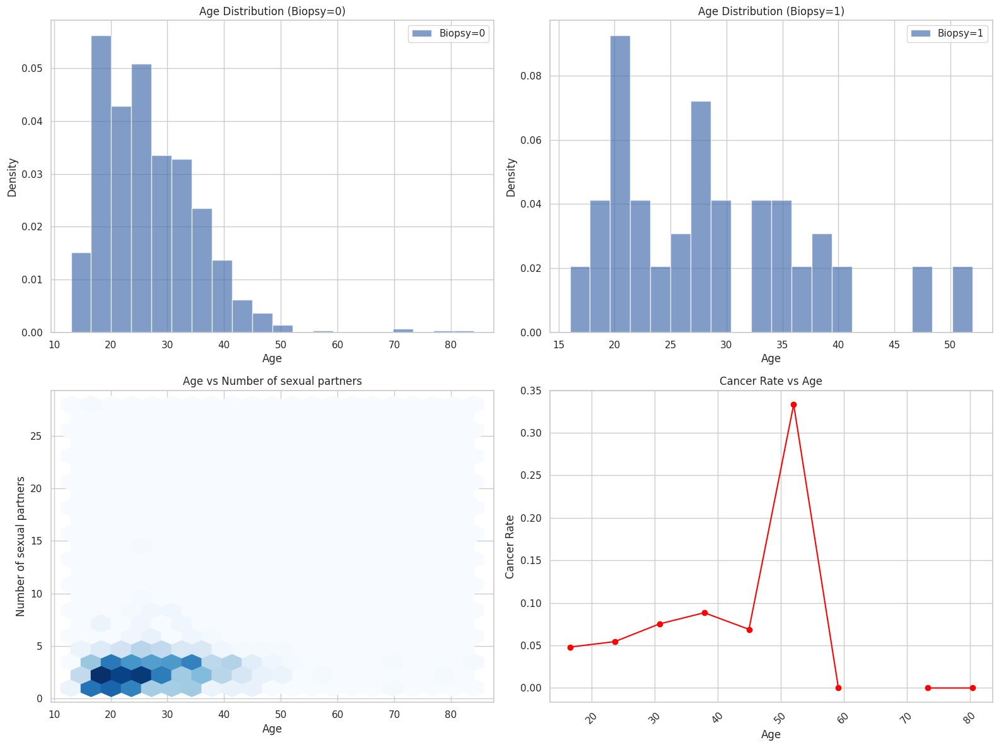

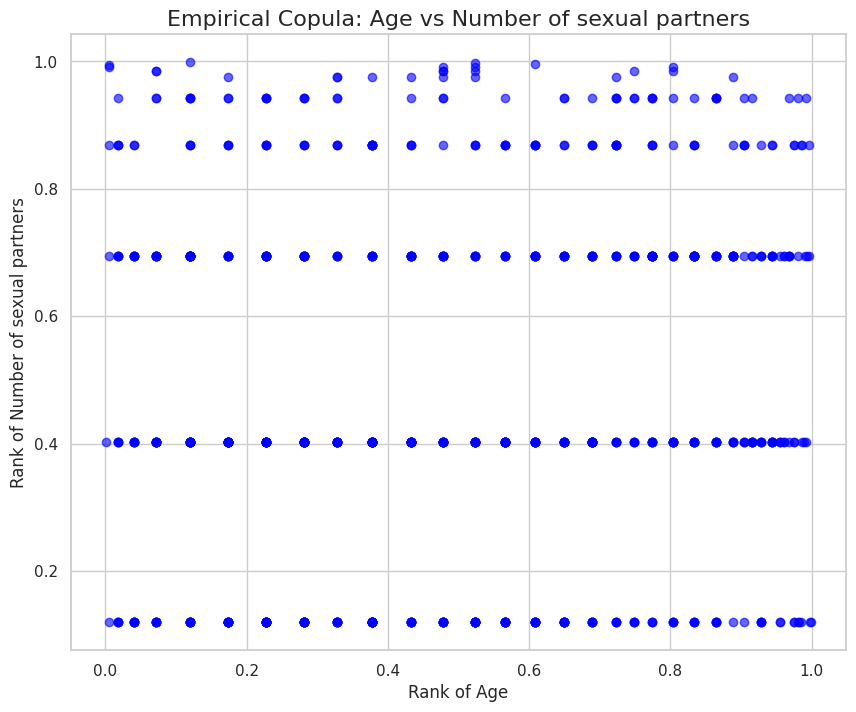

Partial dependence calculation failed: 'values'


<Figure size 1200x800 with 0 Axes>

In [57]:
# 70. Conditional density plots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# Age vs Number of sexual partners by Biopsy
if 'Number of sexual partners' in df.columns:
    for i, biopsy_val in enumerate([0, 1]):
        subset = df[df['Biopsy'] == biopsy_val]
        axes[i].hist(subset['Age'], bins=20, alpha=0.7, 
                     label=f'Biopsy={biopsy_val}', density=True)
        axes[i].set_title(f'Age Distribution (Biopsy={biopsy_val})')
        axes[i].set_xlabel('Age')
        axes[i].set_ylabel('Density')
        axes[i].legend()
    
    # Joint distribution
    if len(numerical_cols) >= 2:
        axes[2].hexbin(df['Age'], df[numerical_cols[1]], 
                       gridsize=20, cmap='Blues')
        axes[2].set_xlabel('Age')
        axes[2].set_ylabel(numerical_cols[1])
        axes[2].set_title(f'Age vs {numerical_cols[1]}')
    
    # Conditional density of target given feature
    feature = numerical_cols[0]
    feature_bins = pd.cut(df[feature], bins=10)
    biopsy_rate = df.groupby(feature_bins)['Biopsy'].mean()
    
    # Use bin midpoints for plotting
    bin_midpoints = biopsy_rate.index.map(lambda interval: interval.mid)
    axes[3].plot(bin_midpoints, biopsy_rate.values, 'o-', color='red')
    axes[3].set_xlabel(feature)
    axes[3].set_ylabel('Cancer Rate')
    axes[3].set_title(f'Cancer Rate vs {feature}')
    axes[3].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# 71. Copula-based dependence visualization
from scipy.stats import rankdata

def empirical_copula(u, v):
    """Calculate empirical copula"""
    n = len(u)
    c = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            c[i, j] = np.sum((u <= u[i]) & (v <= v[j])) / n
    return c

# Calculate empirical copula for two features
if len(numerical_cols) >= 2:
    u_raw = df[numerical_cols[0]].dropna()
    v_raw = df[numerical_cols[1]].dropna()
    min_len = min(len(u_raw), len(v_raw))
    u = rankdata(u_raw[:min_len]) / (min_len + 1)
    v = rankdata(v_raw[:min_len]) / (min_len + 1)
    
    plt.figure(figsize=(10, 8))
    plt.scatter(u, v, alpha=0.6, color='blue')
    plt.title(f'Empirical Copula: {numerical_cols[0]} vs {numerical_cols[1]}', fontsize=16)
    plt.xlabel(f'Rank of {numerical_cols[0]}')
    plt.ylabel(f'Rank of {numerical_cols[1]}')
    plt.show()

# 72. Feature interaction strength using Friedman's H-statistic
from sklearn.inspection import partial_dependence

if len(numerical_cols) >= 2 and hasattr(best_overall_model, 'predict'):
    features = [numerical_cols[0], numerical_cols[1]]
    
    try:
        pdp = partial_dependence(best_overall_model, X_train_resampled, features, grid_resolution=20)
        
        plt.figure(figsize=(12, 8))
        XX, YY = np.meshgrid(pdp['values'][0], pdp['values'][1])
        Z = pdp['average'][0].T
        
        contour = plt.contourf(XX, YY, Z, levels=20, cmap='viridis')
        plt.colorbar(contour)
        plt.xlabel(features[0])
        plt.ylabel(features[1])
        plt.title(f'Partial Dependence: {features[0]} vs {features[1]}', fontsize=16)
        plt.show()
    except Exception as e:
        print(f"Partial dependence calculation failed: {e}")


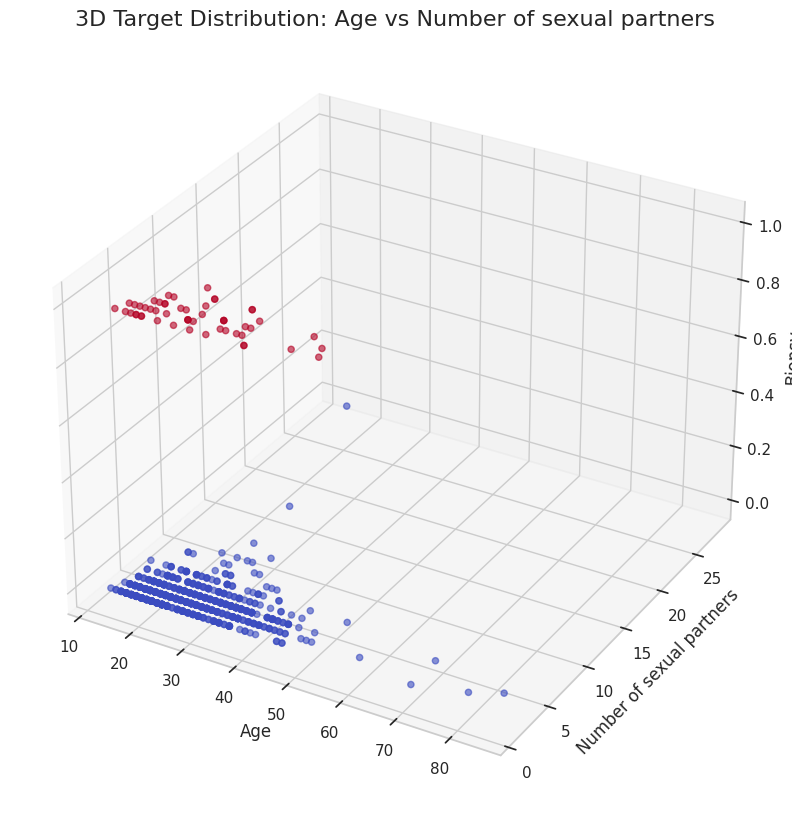

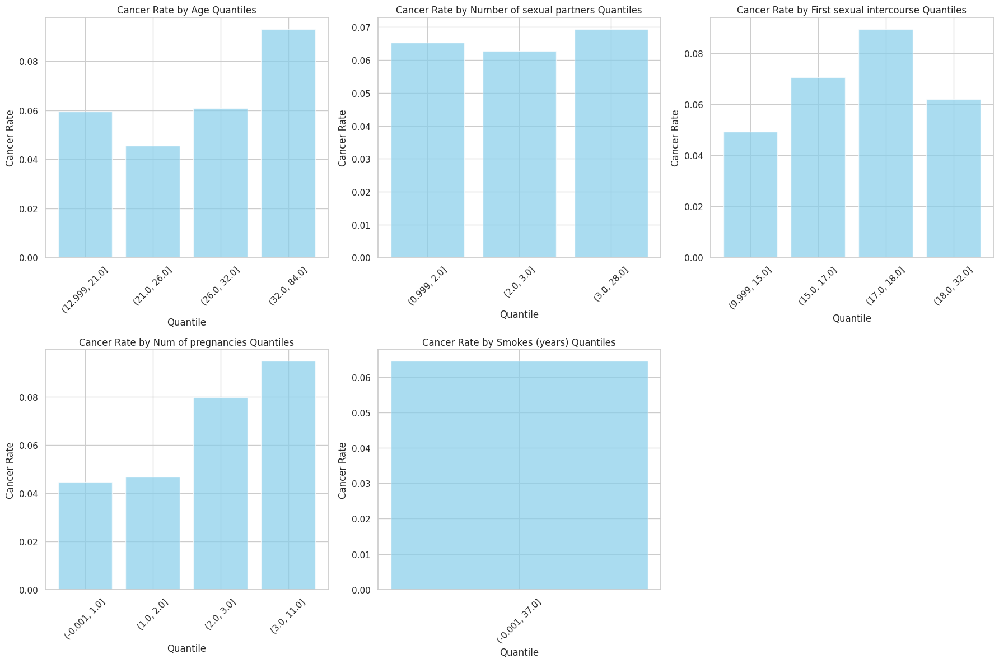

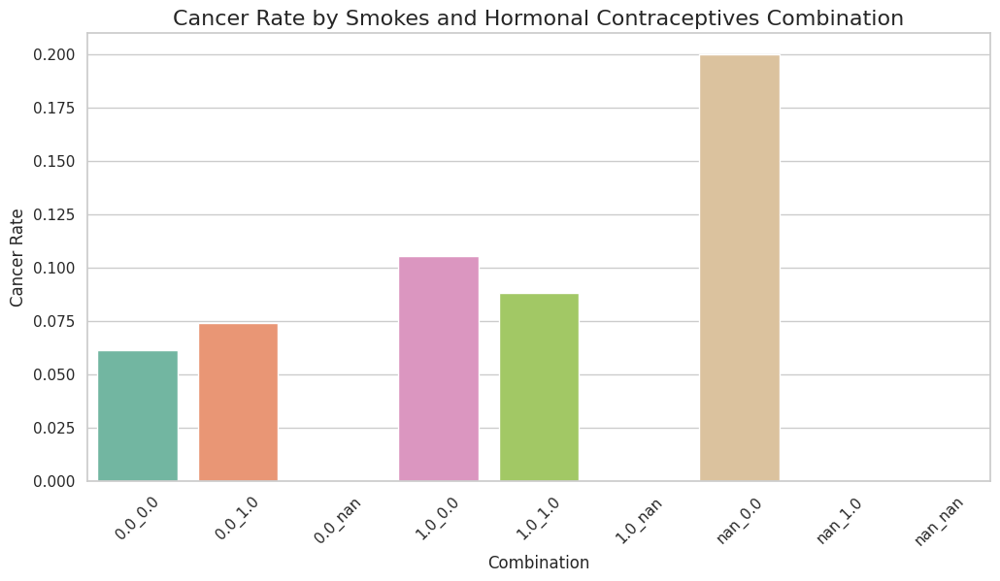

In [58]:
# 73. Target distribution across multiple dimensions
from mpl_toolkits.mplot3d import Axes3D

if len(numerical_cols) >= 2:
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    x = df[numerical_cols[0]].dropna()
    y = df[numerical_cols[1]].dropna()
    z = df['Biopsy'].loc[x.index.intersection(y.index)]
    
    # Align indices
    common_idx = x.index.intersection(y.index).intersection(z.index)
    x = x.loc[common_idx]
    y = y.loc[common_idx]
    z = z.loc[common_idx]
    
    scatter = ax.scatter(x, y, z, c=z, cmap='coolwarm', alpha=0.6)
    ax.set_xlabel(numerical_cols[0])
    ax.set_ylabel(numerical_cols[1])
    ax.set_zlabel('Biopsy')
    ax.set_title(f'3D Target Distribution: {numerical_cols[0]} vs {numerical_cols[1]}', fontsize=16)
    plt.show()

# 74. Target rate by feature quantiles
quantile_results = {}
for col in numerical_cols[:5]:  # Top 5 features
    df[f'{col}_quantile'] = pd.qcut(df[col], q=4, duplicates='drop')
    quantile_results[col] = df.groupby(f'{col}_quantile')['Biopsy'].mean()

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, (col, rates) in enumerate(quantile_results.items()):
    if i < 6:
        axes[i].bar(range(len(rates)), rates.values, color='skyblue', alpha=0.7)
        axes[i].set_title(f'Cancer Rate by {col} Quantiles')
        axes[i].set_xlabel('Quantile')
        axes[i].set_ylabel('Cancer Rate')
        axes[i].set_xticks(range(len(rates)))
        axes[i].set_xticklabels([str(q) for q in rates.index], rotation=45)

# Hide unused subplot
if len(quantile_results) < 6:
    for j in range(len(quantile_results), 6):
        axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# 75. Target distribution by feature combinations
if len(binary_cols) >= 2:
    # Create combination of first two binary features
    combo_col = f"{binary_cols[0]}_{binary_cols[1]}"
    df[combo_col] = df[binary_cols[0]].astype(str) + "_" + df[binary_cols[1]].astype(str)
    
    plt.figure(figsize=(12, 6))
    combo_rates = df.groupby(combo_col)['Biopsy'].mean()
    sns.barplot(x=combo_rates.index, y=combo_rates.values, palette='Set2')
    plt.title(f'Cancer Rate by {binary_cols[0]} and {binary_cols[1]} Combination', fontsize=16)
    plt.xlabel('Combination')
    plt.ylabel('Cancer Rate')
    plt.xticks(rotation=45)
    plt.show()
    
    # Clean up
    df.drop(combo_col, axis=1, inplace=True)

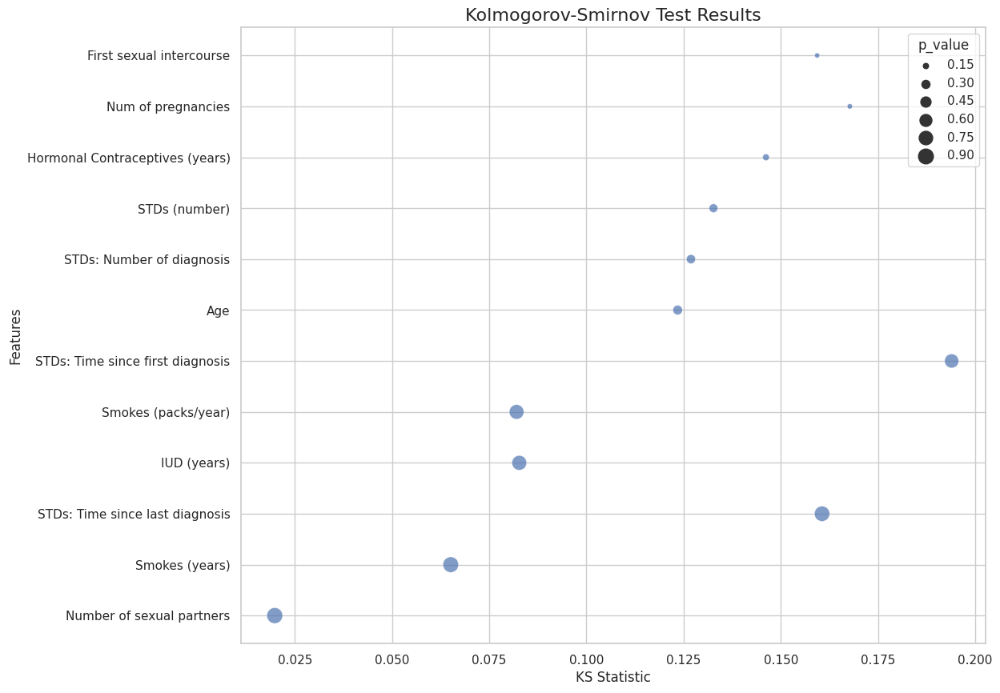

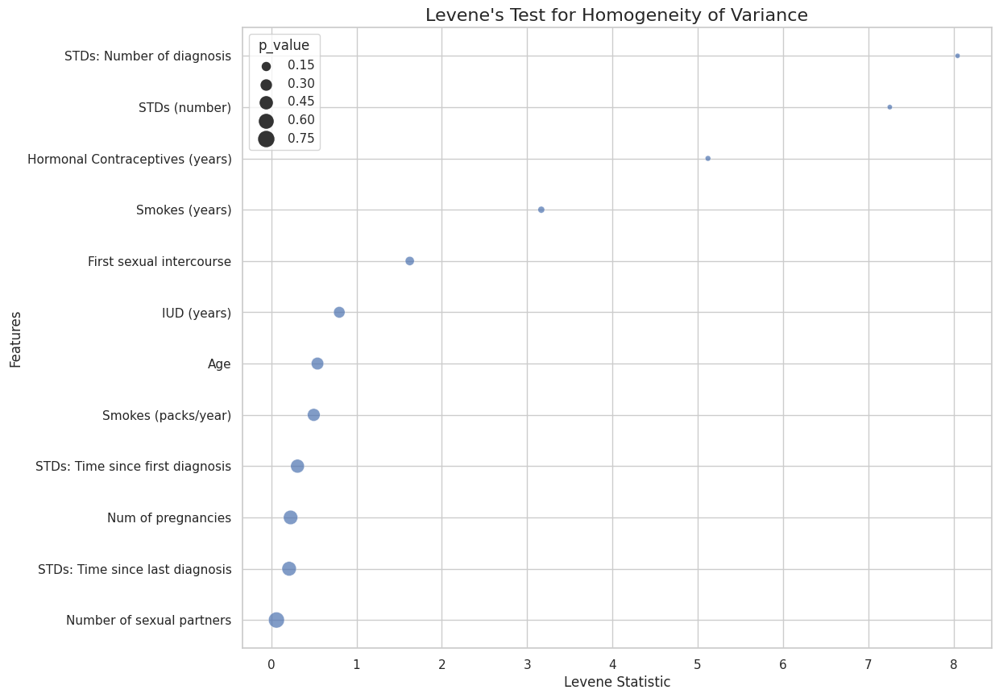

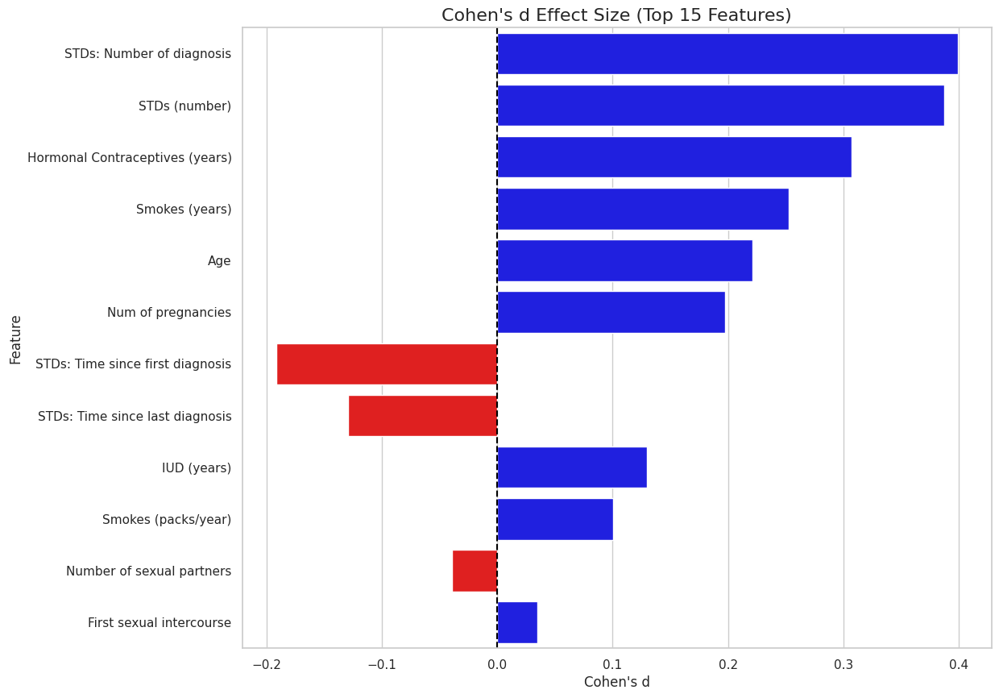

Effect size interpretation:
- Small: |d| ≥ 0.2
- Medium: |d| ≥ 0.5
- Large: |d| ≥ 0.8


In [59]:
# 76. Kolmogorov-Smirnov test for distribution differences
ks_results = {}
for col in numerical_cols:
    group0 = df[df['Biopsy'] == 0][col].dropna()
    group1 = df[df['Biopsy'] == 1][col].dropna()
    if len(group0) > 0 and len(group1) > 0:
        ks_stat, p_val = stats.ks_2samp(group0, group1)
        ks_results[col] = {'ks_statistic': ks_stat, 'p_value': p_val}

ks_df = pd.DataFrame(ks_results).T
ks_df = ks_df.sort_values('p_value')

plt.figure(figsize=(12, 10))
sns.scatterplot(data=ks_df, x='ks_statistic', y=ks_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='plasma')
plt.title('Kolmogorov-Smirnov Test Results', fontsize=16)
plt.xlabel('KS Statistic')
plt.ylabel('Features')
plt.show()

# 77. Levene's test for homogeneity of variance
levene_results = {}
for col in numerical_cols:
    group0 = df[df['Biopsy'] == 0][col].dropna()
    group1 = df[df['Biopsy'] == 1][col].dropna()
    if len(group0) > 0 and len(group1) > 0:
        levene_stat, p_val = stats.levene(group0, group1)
        levene_results[col] = {'levene_statistic': levene_stat, 'p_value': p_val}

levene_df = pd.DataFrame(levene_results).T
levene_df = levene_df.sort_values('p_value')

plt.figure(figsize=(12, 10))
sns.scatterplot(data=levene_df, x='levene_statistic', y=levene_df.index, 
                size='p_value', sizes=(20, 200), alpha=0.7, palette='viridis')
plt.title("Levene's Test for Homogeneity of Variance", fontsize=16)
plt.xlabel('Levene Statistic')
plt.ylabel('Features')
plt.show()

# 78. Effect size calculations (Cohen's d)
cohen_d_results = {}
for col in numerical_cols:
    group0 = df[df['Biopsy'] == 0][col].dropna()
    group1 = df[df['Biopsy'] == 1][col].dropna()
    if len(group0) > 0 and len(group1) > 0:
        pooled_std = np.sqrt(((len(group0)-1)*group0.var() + (len(group1)-1)*group1.var()) / 
                            (len(group0) + len(group1) - 2))
        cohen_d = (group1.mean() - group0.mean()) / pooled_std if pooled_std > 0 else 0
        cohen_d_results[col] = cohen_d

cohen_d_df = pd.DataFrame(list(cohen_d_results.items()), columns=['Feature', 'Cohens_D'])
cohen_d_df = cohen_d_df.sort_values('Cohens_D', key=abs, ascending=False)

plt.figure(figsize=(12, 10))
colors = ['red' if d < 0 else 'blue' for d in cohen_d_df['Cohens_D']]
sns.barplot(data=cohen_d_df.head(15), x='Cohens_D', y='Feature', palette=colors)
plt.title("Cohen's d Effect Size (Top 15 Features)", fontsize=16)
plt.xlabel("Cohen's d")
plt.axvline(x=0, color='black', linestyle='--')
plt.show()

# Interpretation guide
print("Effect size interpretation:")
print("- Small: |d| ≥ 0.2")
print("- Medium: |d| ≥ 0.5") 
print("- Large: |d| ≥ 0.8")

In [61]:
!pip install joypy


<Figure size 1400x1000 with 0 Axes>

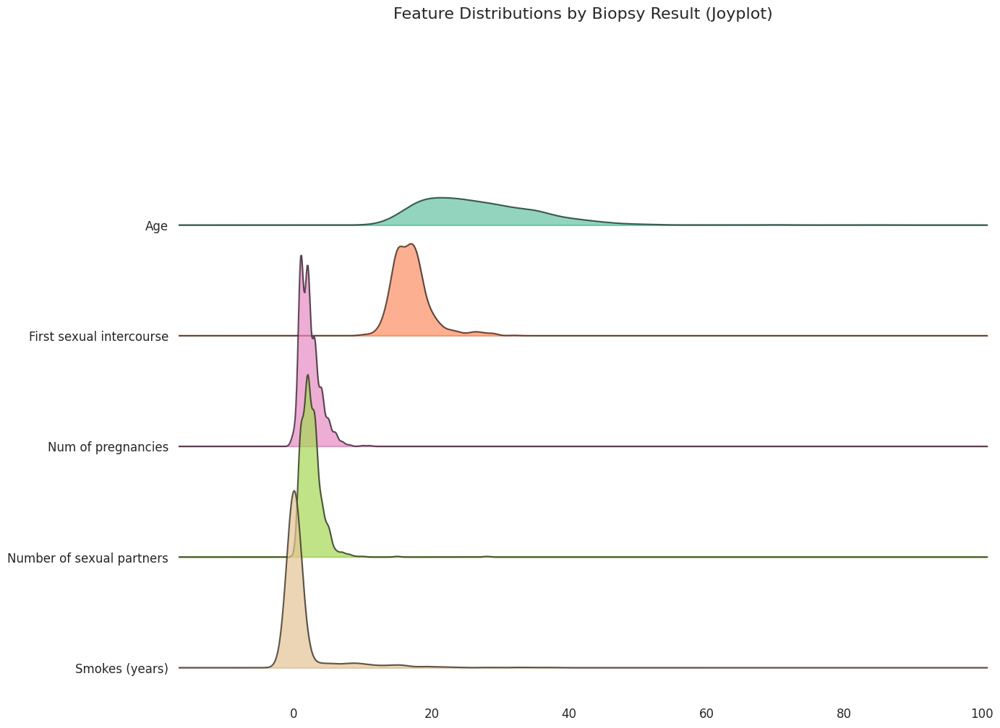

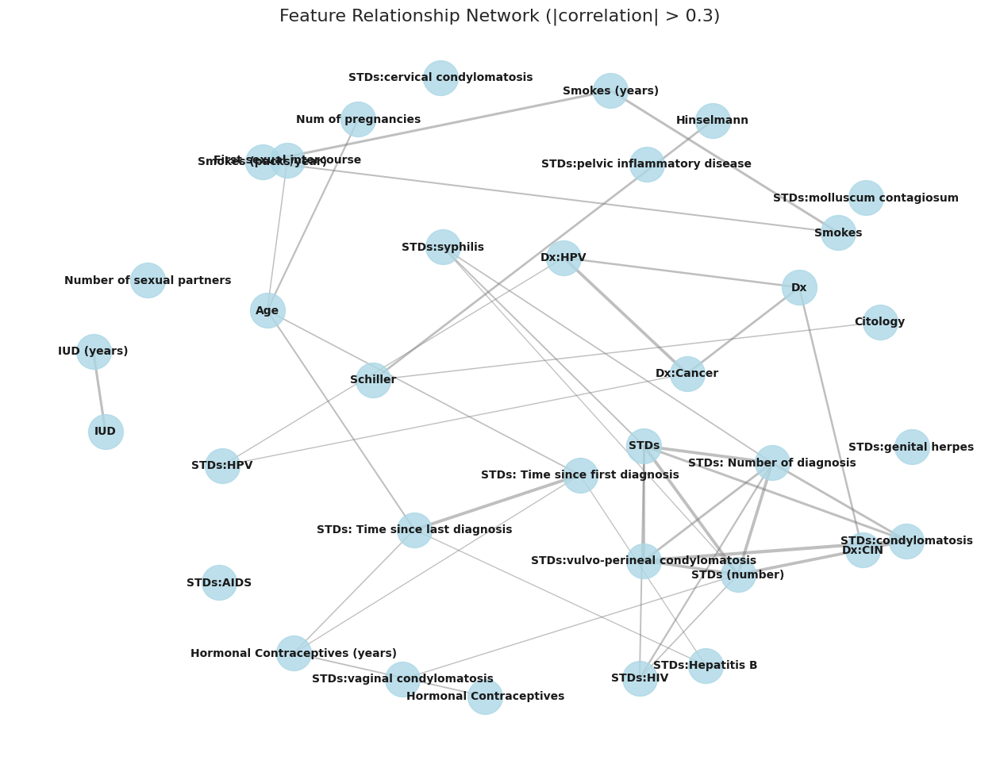

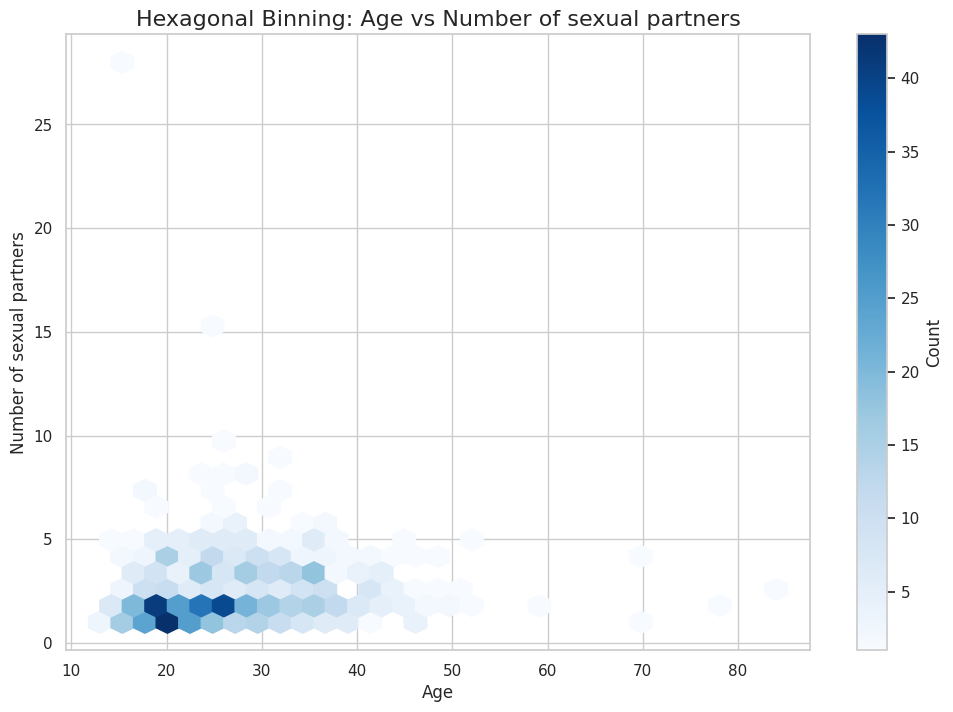

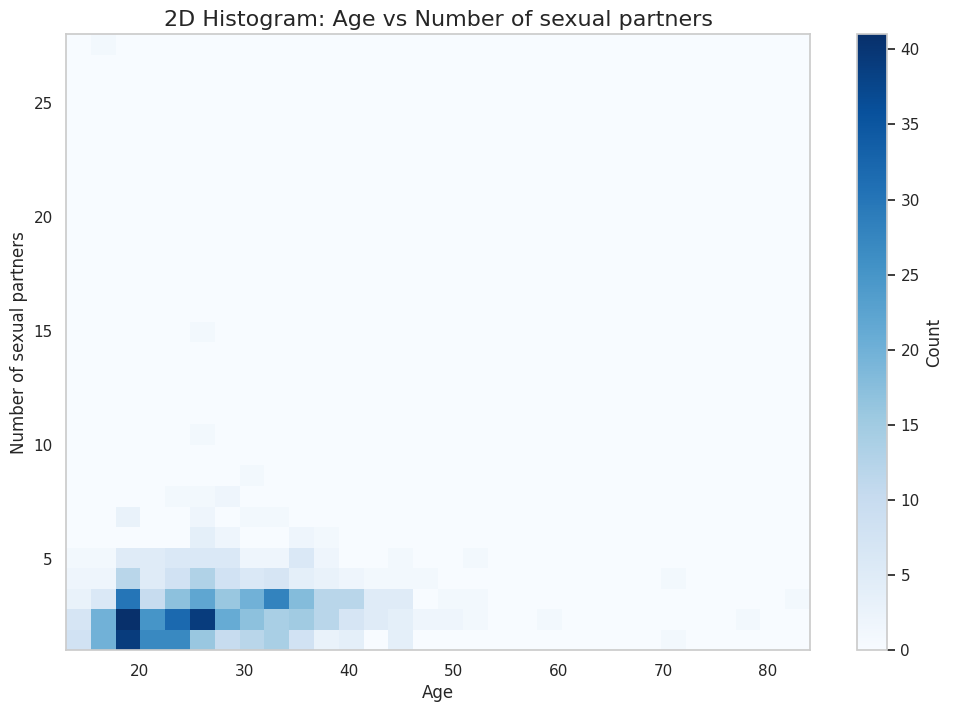

In [65]:
# 79. Joyplot (Ridgeline plot) for feature distributions by target
import joypy

if numerical_cols:
    # Prepare data for joyplot
    joy_data = df[['Biopsy'] + numerical_cols[:5]].melt(id_vars='Biopsy', var_name='Feature', value_name='Value')
    joy_data = joy_data.dropna()
    
    plt.figure(figsize=(14, 10))
    fig, axes = joypy.joyplot(
        joy_data,
        by="Feature",
        column="Value",
        colormap=plt.cm.Set2,  # Automatically handles multiple groups
        alpha=0.7,
        overlap=2,
        figsize=(14, 10)
    )
    plt.title('Feature Distributions by Biopsy Result (Joyplot)', fontsize=16)
    plt.show()

# 80. Network graph of feature relationships
import networkx as nx

correlation_threshold = 0.3
G = nx.Graph()

# Add nodes
for col in numerical_cols + binary_cols:
    G.add_node(col)

# Add edges based on correlation
for i, col1 in enumerate(numerical_cols + binary_cols):
    for j, col2 in enumerate(numerical_cols + binary_cols):
        if i < j:
            corr = df[col1].corr(df[col2])
            if pd.notnull(corr) and abs(corr) > correlation_threshold:
                G.add_edge(col1, col2, weight=abs(corr))

# Visualize network
plt.figure(figsize=(16, 12))
pos = nx.spring_layout(G, k=1, iterations=50)
edges = G.edges()
weights = [G[u][v]['weight'] * 3 for u, v in edges]

nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='lightblue', alpha=0.8)
nx.draw_networkx_edges(G, pos, width=weights, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

plt.title(f'Feature Relationship Network (|correlation| > {correlation_threshold})', fontsize=16)
plt.axis('off')
plt.show()

# 81. Sankey diagram for feature flows
from plotly import graph_objects as go

if len(binary_cols) >= 3:
    labels = binary_cols[:3] + ['Biopsy_Negative', 'Biopsy_Positive']
    source = []
    target = []
    value = []
    
    for i, col in enumerate(binary_cols[:3]):
        neg_count = len(df[(df[col] == 1) & (df['Biopsy'] == 0)])
        pos_count = len(df[(df[col] == 1) & (df['Biopsy'] == 1)])
        
        source.extend([i, i])
        target.extend([3, 4])
        value.extend([neg_count, pos_count])
    
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=labels,
            color="blue"
        ),
        link=dict(
            source=source,
            target=target,
            value=value
        ))])
    
    fig.update_layout(title_text="Feature to Outcome Flow (Sankey Diagram)", font_size=10)
    fig.show()

# 82. Hexagonal binning for dense scatter plots
if len(numerical_cols) >= 2:
    plt.figure(figsize=(12, 8))
    plt.hexbin(df[numerical_cols[0]], df[numerical_cols[1]], 
               gridsize=30, cmap='Blues', mincnt=1)
    plt.colorbar(label='Count')
    plt.xlabel(numerical_cols[0])
    plt.ylabel(numerical_cols[1])
    plt.title(f'Hexagonal Binning: {numerical_cols[0]} vs {numerical_cols[1]}', fontsize=16)
    plt.show()

# 83. 2D histogram for feature relationships
if len(numerical_cols) >= 2:
    x_col = numerical_cols[0]
    y_col = numerical_cols[1]
    
    # Drop rows with NaNs in either column
    valid_df = df[[x_col, y_col]].dropna()
    
    if not valid_df.empty:
        plt.figure(figsize=(12, 8))
        plt.hist2d(valid_df[x_col], valid_df[y_col], bins=30, cmap='Blues')
        plt.colorbar(label='Count')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'2D Histogram: {x_col} vs {y_col}', fontsize=16)
        plt.show()
    else:
        print(f"No valid data for 2D histogram between {x_col} and {y_col}")



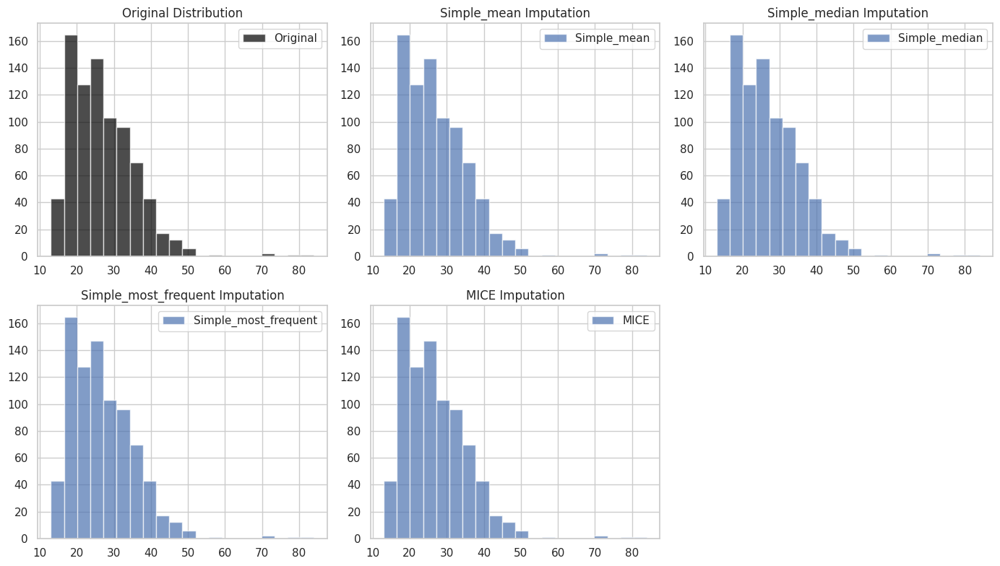

Little's MCAR Test: χ² = 8267.7696, p-value = 1.0000
Data may be MCAR


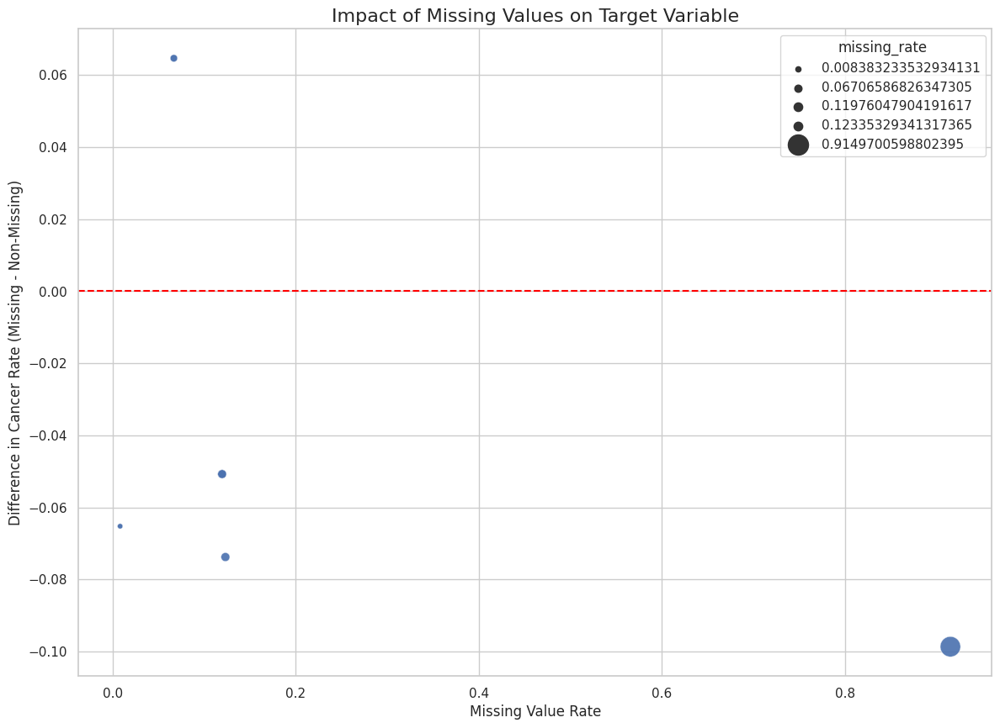

In [67]:
# 84. Missing value pattern analysis using MICE
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer

# Compare different imputation strategies
imputation_strategies = ['mean', 'median', 'most_frequent']
mice_imputer = IterativeImputer(random_state=42)

imputation_results = {}
for strategy in imputation_strategies:
    simple_imputer = SimpleImputer(strategy=strategy)
    X_simple = simple_imputer.fit_transform(X[numerical_features])
    imputation_results[f'Simple_{strategy}'] = X_simple

X_mice = mice_imputer.fit_transform(X[numerical_features])
imputation_results['MICE'] = X_mice

# Visualize imputation differences for first feature
feature_idx = 0
original_values = X[numerical_features[feature_idx]].dropna()

plt.figure(figsize=(14, 8))
plt.subplot(2, 3, 1)
plt.hist(original_values, bins=20, alpha=0.7, color='black', label='Original')
plt.title('Original Distribution')
plt.legend()

for i, (strategy, imputed_data) in enumerate(imputation_results.items()):
    plt.subplot(2, 3, i + 2)
    imputed_values = imputed_data[:, feature_idx]
    plt.hist(imputed_values, bins=20, alpha=0.7, label=strategy)
    plt.title(f'{strategy} Imputation')
    plt.legend()

plt.tight_layout()
plt.show()

# 85. Missing value mechanism analysis (MCAR, MAR, MNAR)
from scipy.stats import chi2_contingency

def little_mcar_test(df):
    """Simplified Little's MCAR test with safe filtering"""
    missing_pattern = df.isnull().astype(int)

    # Drop columns and rows with no missing values
    missing_pattern = missing_pattern.loc[:, missing_pattern.sum() > 0]
    missing_pattern = missing_pattern[missing_pattern.sum(axis=1) > 0]

    if missing_pattern.empty or missing_pattern.shape[1] < 2:
        raise ValueError("Not enough missing data structure for MCAR test.")

    chi2_stat, p_val = chi2_contingency(missing_pattern.T)[0:2]
    return chi2_stat, p_val

# Apply test
try:
    chi2_stat, p_val = little_mcar_test(df.select_dtypes(include=[np.number]))
    print(f"Little's MCAR Test: χ² = {chi2_stat:.4f}, p-value = {p_val:.4f}")
    if p_val < 0.05:
        print("Data is likely NOT MCAR (Missing Completely At Random)")
    else:
        print("Data may be MCAR")
except ValueError as e:
    print(f"MCAR test could not be performed: {e}")

# 86. Missing value impact on target variable
missing_impact = {}
for col in df.columns:
    if col != 'Biopsy':
        missing_mask = df[col].isnull()
        if missing_mask.sum() > 0:
            missing_target_rate = df[missing_mask]['Biopsy'].mean()
            non_missing_target_rate = df[~missing_mask]['Biopsy'].mean()
            missing_impact[col] = {
                'missing_rate': missing_mask.mean(),
                'missing_target_rate': missing_target_rate,
                'non_missing_target_rate': non_missing_target_rate,
                'difference': missing_target_rate - non_missing_target_rate
            }

missing_impact_df = pd.DataFrame(missing_impact).T
missing_impact_df = missing_impact_df.sort_values('difference', key=abs, ascending=False)

plt.figure(figsize=(14, 10))
sns.scatterplot(data=missing_impact_df.head(15), 
                x='missing_rate', y='difference', 
                size='missing_rate', sizes=(20, 300), alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Impact of Missing Values on Target Variable', fontsize=16)
plt.xlabel('Missing Value Rate')
plt.ylabel('Difference in Cancer Rate (Missing - Non-Missing)')
plt.show()


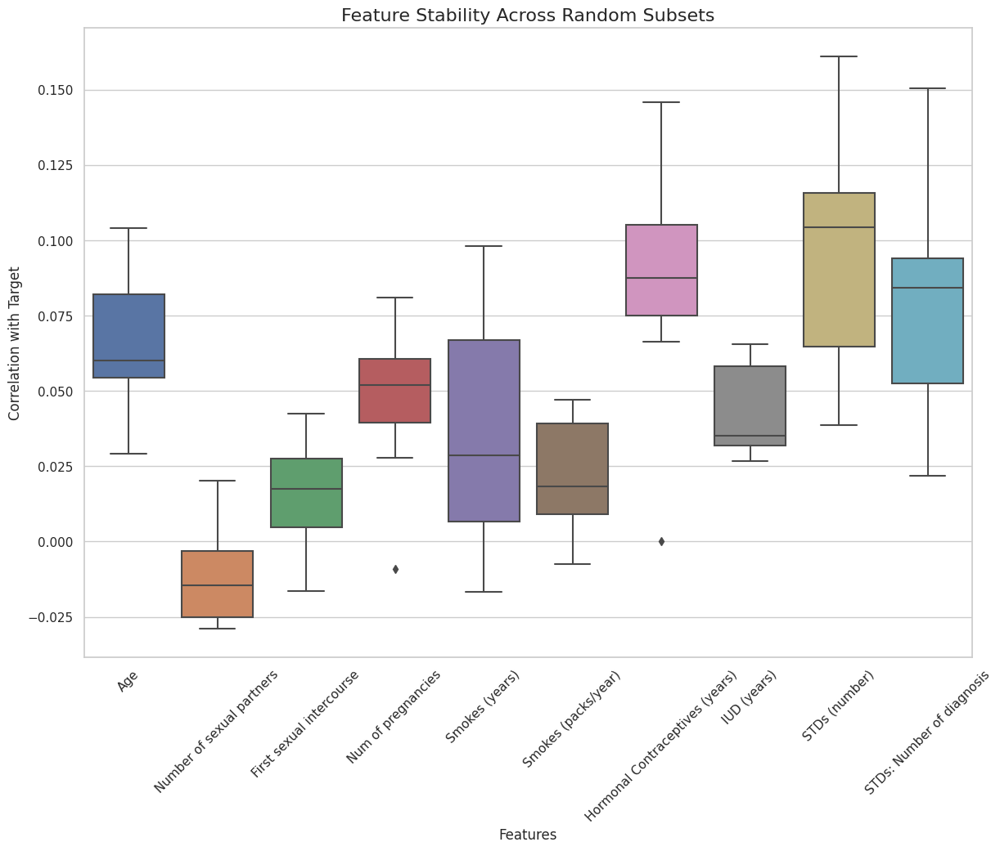

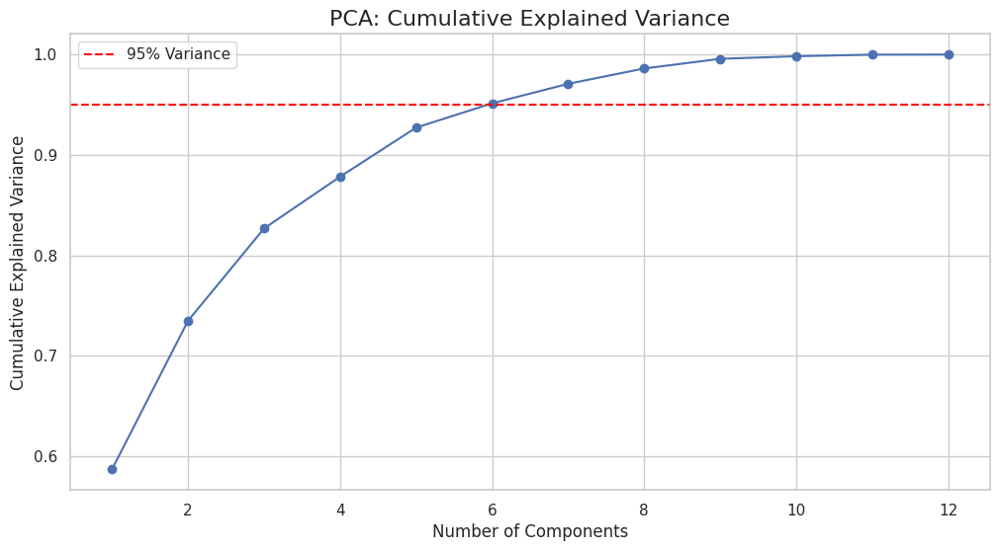

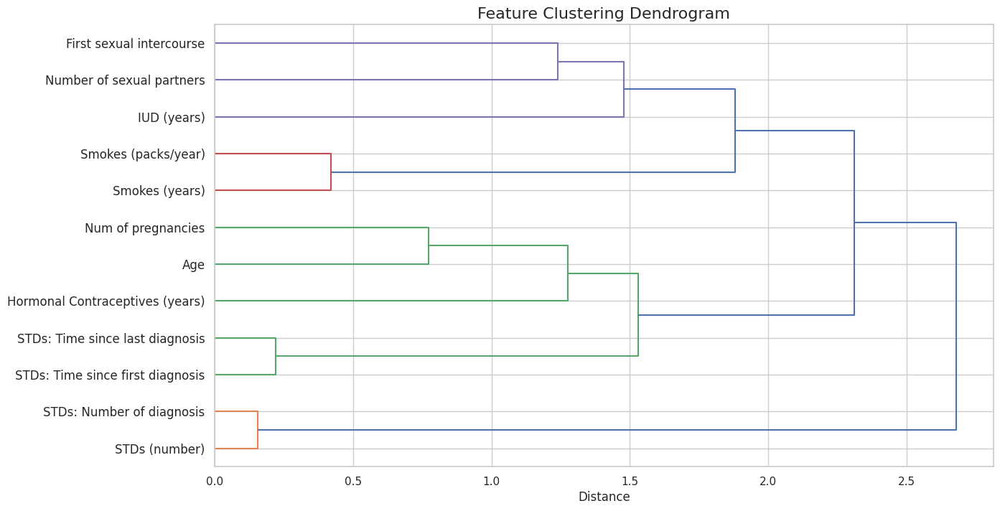

Feature clusters:
Cluster
1           [STDs (number), STDs: Number of diagnosis]
2    [STDs: Time since first diagnosis, STDs: Time ...
3                                                [Age]
4                                 [Num of pregnancies]
5                    [Hormonal Contraceptives (years)]
6                [Smokes (years), Smokes (packs/year)]
7                          [Number of sexual partners]
8                           [First sexual intercourse]
9                                        [IUD (years)]
Name: Feature, dtype: object


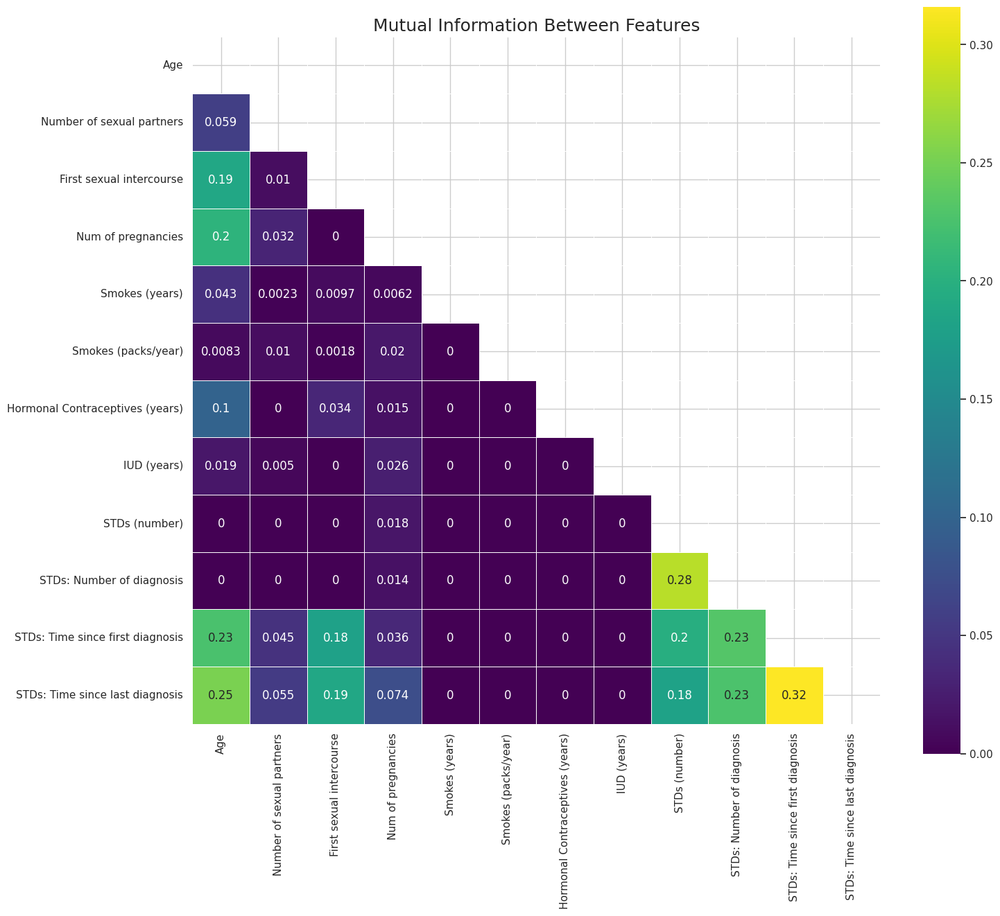

In [68]:
# 87. Feature stability analysis across subsets
def feature_stability_analysis(df, feature, target, n_subsets=10):
    """Analyze feature stability across random subsets"""
    stability_scores = []
    for _ in range(n_subsets):
        subset = df.sample(frac=0.7, random_state=None)
        if feature in subset.columns and target in subset.columns:
            corr = subset[feature].corr(subset[target])
            stability_scores.append(corr)
    return stability_scores

stability_results = {}
for col in numerical_cols[:10]:
    stability_results[col] = feature_stability_analysis(df, col, 'Biopsy')

# Visualization
plt.figure(figsize=(14, 10))
stability_df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in stability_results.items()]))
sns.boxplot(data=stability_df)
plt.title('Feature Stability Across Random Subsets', fontsize=16)
plt.xlabel('Features')
plt.ylabel('Correlation with Target')
plt.xticks(rotation=45)
plt.show()

# 88. Feature redundancy analysis
from sklearn.decomposition import PCA

# Apply PCA to numerical features
pca = PCA()
X_pca = pca.fit_transform(X[numerical_features].fillna(X[numerical_features].median()))

# Explained variance ratio
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 'bo-')
plt.axhline(y=0.95, color='red', linestyle='--', label='95% Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Explained Variance', fontsize=16)
plt.legend()
plt.show()

# 89. Feature clustering using hierarchical clustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Compute feature correlation matrix
feature_corr = X[numerical_features].corr().abs()

# Perform hierarchical clustering
linkage_matrix = linkage(feature_corr, method='ward')

# Plot dendrogram
plt.figure(figsize=(14, 8))
dendrogram(linkage_matrix, labels=feature_corr.columns, orientation='right')
plt.title('Feature Clustering Dendrogram', fontsize=16)
plt.xlabel('Distance')
plt.show()

# Get clusters
clusters = fcluster(linkage_matrix, t=0.7, criterion='distance')
feature_clusters = pd.DataFrame({'Feature': feature_corr.columns, 'Cluster': clusters})
print("Feature clusters:")
print(feature_clusters.groupby('Cluster')['Feature'].apply(list))

# 90. Mutual information between features
mi_matrix = np.zeros((len(numerical_features), len(numerical_features)))
for i, feat1 in enumerate(numerical_features):
    for j, feat2 in enumerate(numerical_features):
        if i != j:
            try:
                mi = mutual_info_classif(
                    X[[feat1]].fillna(X[feat1].median()), 
                    X[feat2].fillna(X[feat2].median()), 
                    random_state=42
                )[0]
                mi_matrix[i, j] = mi
            except:
                mi_matrix[i, j] = 0
        else:
            mi_matrix[i, j] = 1

# Visualization
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(mi_matrix, dtype=bool))
sns.heatmap(mi_matrix, mask=mask, annot=True, cmap='viridis', 
            square=True, linewidths=0.5, 
            xticklabels=numerical_features, yticklabels=numerical_features)
plt.title('Mutual Information Between Features', fontsize=18)
plt.show()

Overall target entropy: 0.3457


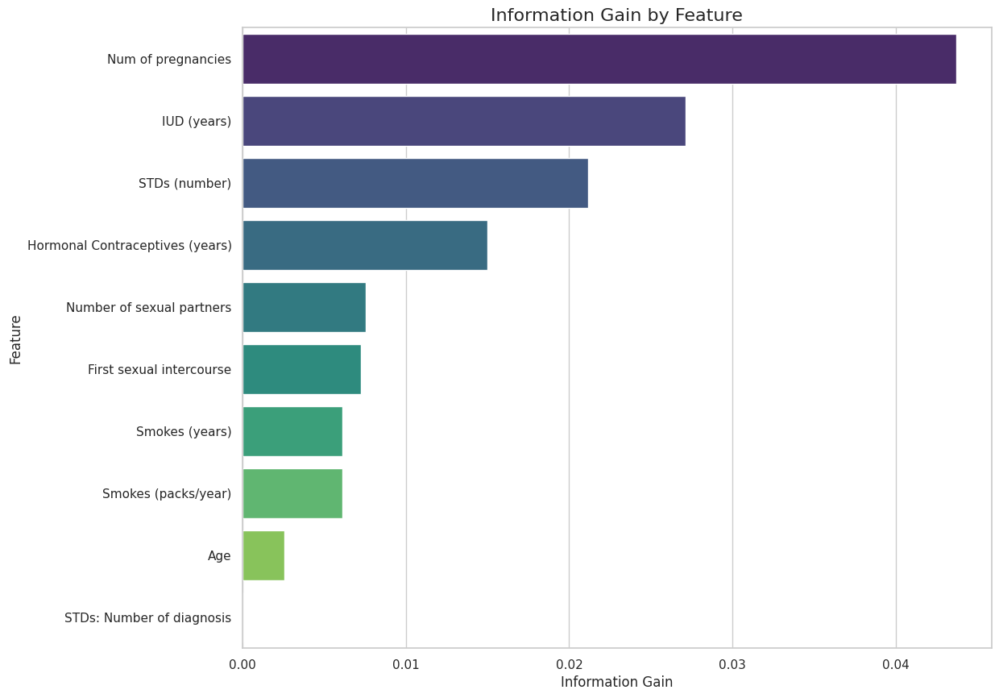

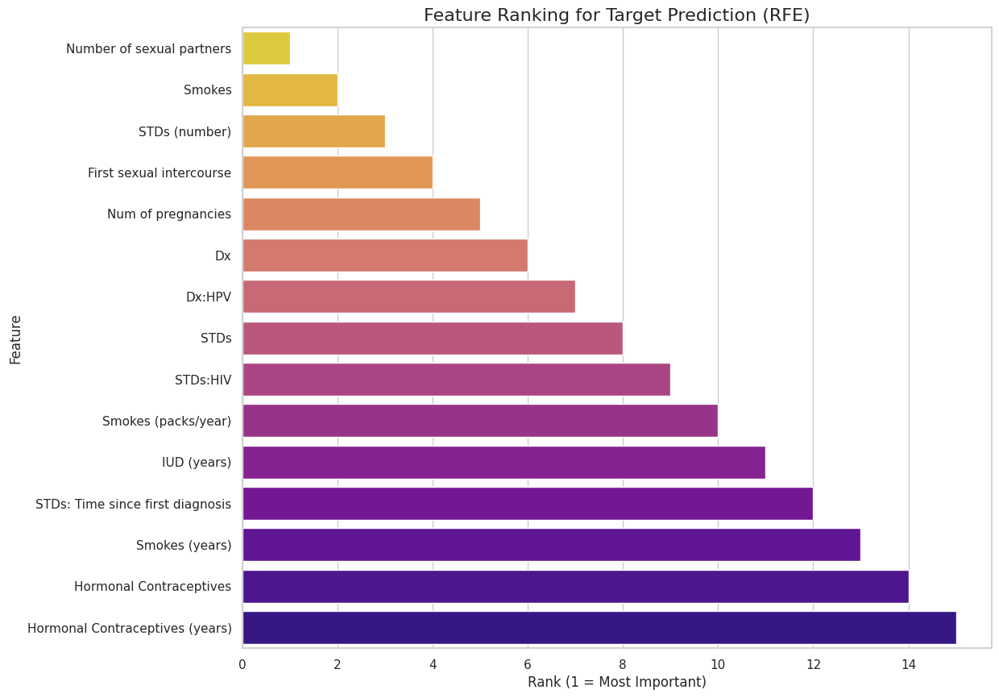

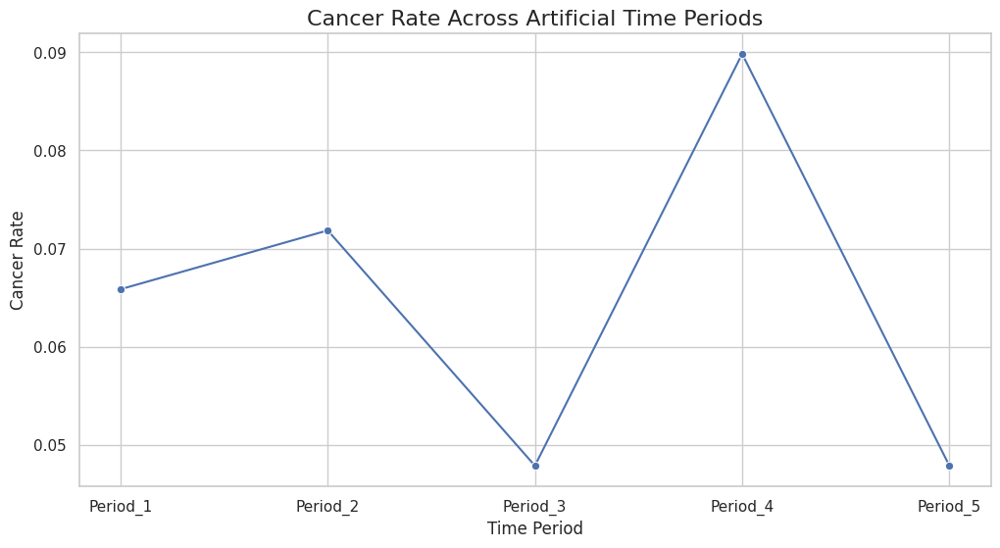

In [74]:
# 91. Target variable entropy analysis
def calculate_entropy(series):
    value_counts = series.value_counts()
    probabilities = value_counts / len(series)
    entropy = -np.sum(probabilities * np.log2(probabilities))
    return entropy

# Overall entropy
overall_entropy = calculate_entropy(df['Biopsy'])
print(f"Overall target entropy: {overall_entropy:.4f}")

# Conditional entropy given features
conditional_entropies = {}
for col in numerical_cols[:10]:
    try:
        discretized = pd.qcut(df[col], q=5, duplicates='drop')
        conditional_entropy = 0
        for category in discretized.cat.categories:
            subset = df[discretized == category]['Biopsy']
            if len(subset) > 0:
                prob = len(subset) / len(df)
                entropy = calculate_entropy(subset)
                conditional_entropy += prob * entropy
        conditional_entropies[col] = conditional_entropy
    except Exception as e:
        print(f"Skipping {col} due to error: {e}")

# Information gain
info_gains = {col: overall_entropy - cond_ent for col, cond_ent in conditional_entropies.items()}
info_gain_df = pd.DataFrame(list(info_gains.items()), columns=['Feature', 'Information_Gain'])
info_gain_df = info_gain_df.sort_values('Information_Gain', ascending=False)

plt.figure(figsize=(12, 10))
sns.barplot(data=info_gain_df.head(15), x='Information_Gain', y='Feature', palette='viridis')
plt.title('Information Gain by Feature', fontsize=16)
plt.xlabel('Information Gain')
plt.show()

# 92. Target variable predictability analysis using RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Align X_imputed and y
X_rfe = X_imputed.copy()
y_rfe = y.copy()

if len(X_rfe) != len(y_rfe):
    common_index = X_rfe.index.intersection(y_rfe.index)
    X_rfe = X_rfe.loc[common_index]
    y_rfe = y_rfe.loc[common_index]

# Fit RFE
estimator = LogisticRegression(max_iter=1000, random_state=42)
selector = RFE(estimator, n_features_to_select=1, step=1)
selector.fit(X_rfe, y_rfe)

# Get ranking
feature_ranking = pd.DataFrame({
    'Feature': X_rfe.columns,
    'Ranking': selector.ranking_
}).sort_values('Ranking')

plt.figure(figsize=(12, 10))
sns.barplot(data=feature_ranking.head(15), x='Ranking', y='Feature', palette='plasma_r')
plt.title('Feature Ranking for Target Prediction (RFE)', fontsize=16)
plt.xlabel('Rank (1 = Most Important)')
plt.show()

# 93. Target variable stability across time (simulated)
df['Artificial_Time'] = pd.cut(df.index, bins=5, labels=['Period_1', 'Period_2', 'Period_3', 'Period_4', 'Period_5'])

plt.figure(figsize=(12, 6))
time_rates = df.groupby('Artificial_Time')['Biopsy'].mean()
sns.lineplot(x=time_rates.index, y=time_rates.values, marker='o')
plt.title('Cancer Rate Across Artificial Time Periods', fontsize=16)
plt.xlabel('Time Period')
plt.ylabel('Cancer Rate')
plt.show()

# Clean up
df.drop('Artificial_Time', axis=1, inplace=True)


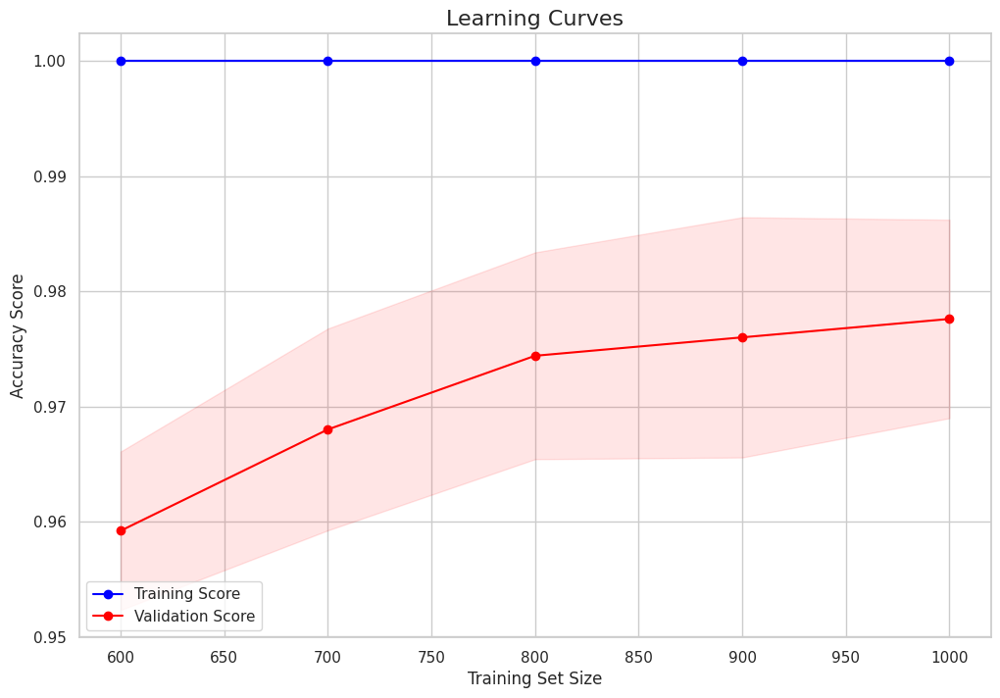

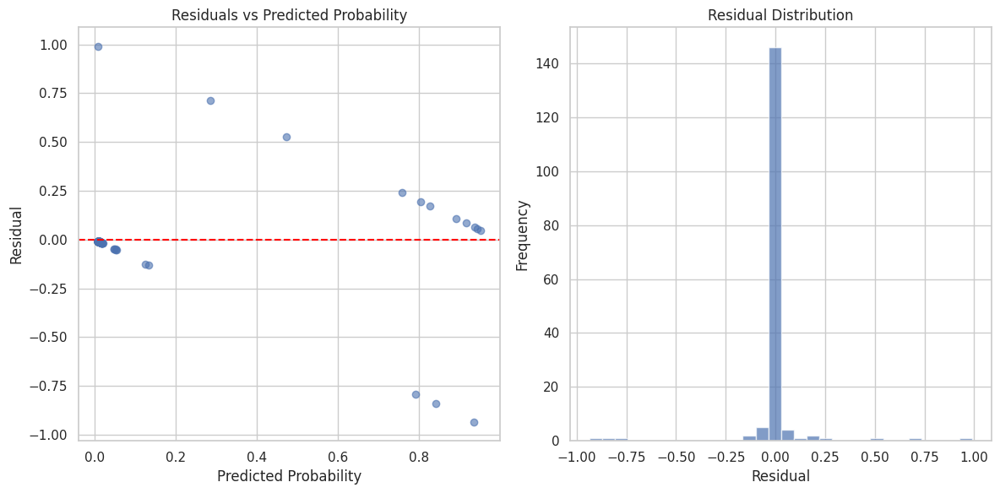

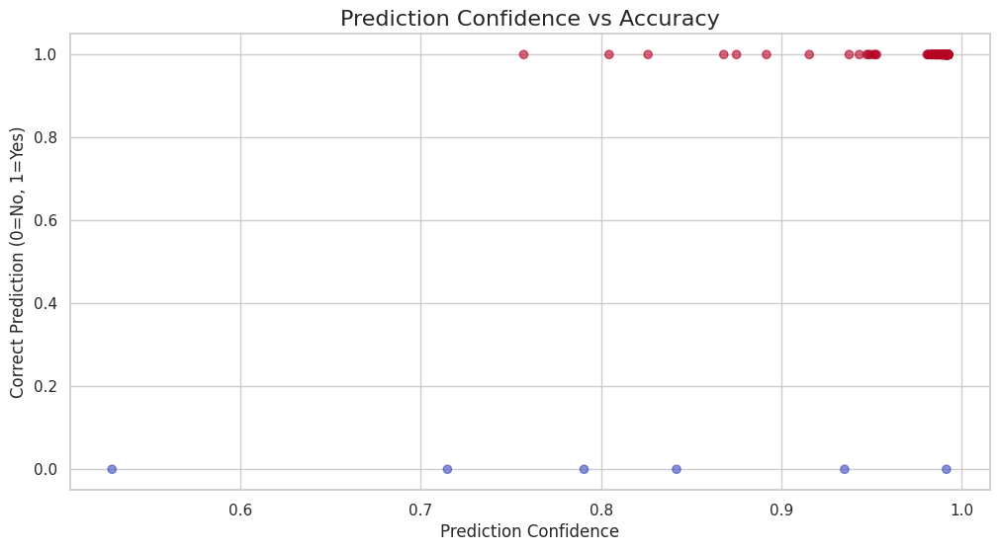

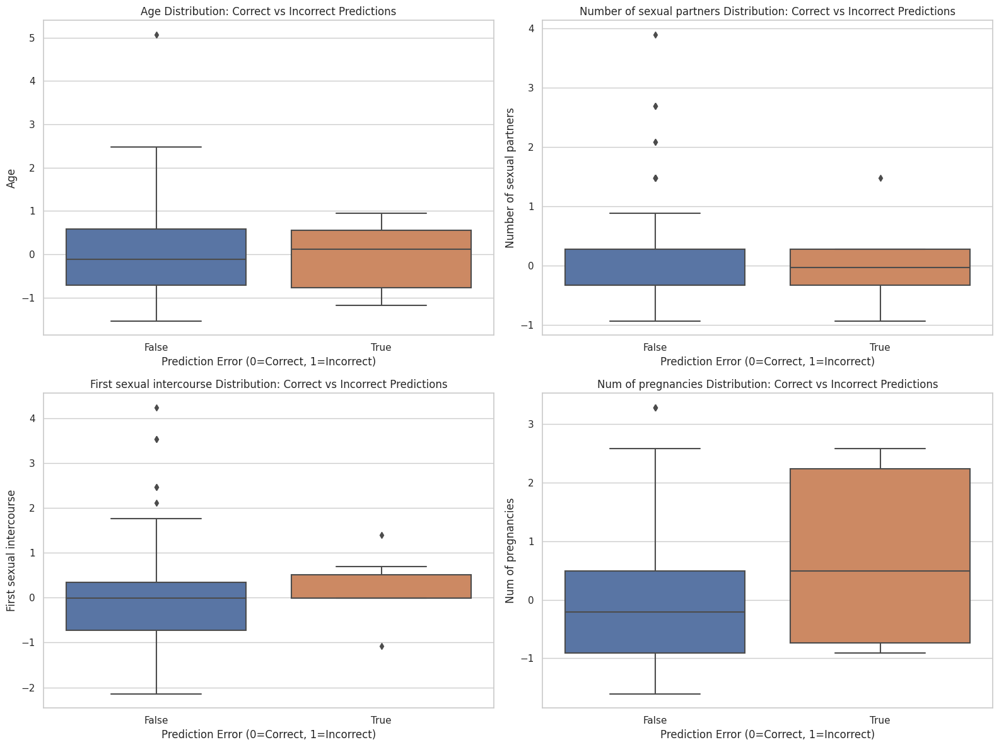

In [72]:
# 94. Learning curves for best model
from sklearn.model_selection import learning_curve

train_sizes, train_scores, val_scores = learning_curve(
    best_overall_model, X_train_resampled, y_train_resampled, 
    cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure(figsize=(12, 8))
plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color='blue', label='Training Score')
plt.plot(train_sizes, np.mean(val_scores, axis=1), 'o-', color='red', label='Validation Score')
plt.fill_between(train_sizes, np.mean(train_scores, axis=1) - np.std(train_scores, axis=1),
                 np.mean(train_scores, axis=1) + np.std(train_scores, axis=1), alpha=0.1, color='blue')
plt.fill_between(train_sizes, np.mean(val_scores, axis=1) - np.std(val_scores, axis=1),
                 np.mean(val_scores, axis=1) + np.std(val_scores, axis=1), alpha=0.1, color='red')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy Score')
plt.title('Learning Curves', fontsize=16)
plt.legend()
plt.show()

# 95. Validation curves for hyperparameter tuning
from sklearn.model_selection import validation_curve

if hasattr(best_overall_model, 'n_estimators'):
    param_range = [50, 100, 150, 200, 250]
    train_scores, val_scores = validation_curve(
        best_overall_model, X_train_resampled, y_train_resampled,
        param_name='n_estimators', param_range=param_range, cv=5, n_jobs=-1
    )
    
    plt.figure(figsize=(12, 8))
    plt.plot(param_range, np.mean(train_scores, axis=1), 'o-', color='blue', label='Training Score')
    plt.plot(param_range, np.mean(val_scores, axis=1), 'o-', color='red', label='Validation Score')
    plt.fill_between(param_range, np.mean(train_scores, axis=1) - np.std(train_scores, axis=1),
                     np.mean(train_scores, axis=1) + np.std(train_scores, axis=1), alpha=0.1, color='blue')
    plt.fill_between(param_range, np.mean(val_scores, axis=1) - np.std(val_scores, axis=1),
                     np.mean(val_scores, axis=1) + np.std(val_scores, axis=1), alpha=0.1, color='red')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy Score')
    plt.title('Validation Curve: Number of Estimators', fontsize=16)
    plt.legend()
    plt.show()

# 96. Residual analysis (for probability predictions)
residuals = y_test - best_results['y_pred_proba']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(best_results['y_pred_proba'], residuals, alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Probability')
plt.ylabel('Residual')
plt.title('Residuals vs Predicted Probability')

plt.subplot(1, 2, 2)
plt.hist(residuals, bins=30, alpha=0.7)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Residual Distribution')

plt.tight_layout()
plt.show()

# 97. Prediction confidence analysis
confidence = np.max(np.column_stack([1 - best_results['y_pred_proba'], best_results['y_pred_proba']]), axis=1)
correct_predictions = (best_results['y_pred'] == y_test).astype(int)

plt.figure(figsize=(12, 6))
plt.scatter(confidence, correct_predictions, alpha=0.6, c=correct_predictions, cmap='coolwarm')
plt.xlabel('Prediction Confidence')
plt.ylabel('Correct Prediction (0=No, 1=Yes)')
plt.title('Prediction Confidence vs Accuracy', fontsize=16)
plt.show()

# 98. Error analysis by feature values
errors = best_results['y_pred'] != y_test
error_df = X_test.copy()
error_df['Error'] = errors
error_df['Actual'] = y_test.values

# Analyze errors by key features
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, col in enumerate(numerical_cols[:4]):
    if col in error_df.columns:
        sns.boxplot(data=error_df, x='Error', y=col, ax=axes[i])
        axes[i].set_title(f'{col} Distribution: Correct vs Incorrect Predictions')
        axes[i].set_xlabel('Prediction Error (0=Correct, 1=Incorrect)')

plt.tight_layout()
plt.show()

In [33]:
# Create a copy of the original dataframe
df_processed = df.copy()

# Drop unnecessary columns (if any)
# For this dataset, we'll keep all columns except the ones we created for EDA
cols_to_drop = ['Age_Group', 'Pregnancy_Group', 'Years_Since_First_Intercourse', 
                'Smoking_Intensity', 'Total_Contraceptive_Years']
df_processed = df_processed.drop(columns=[col for col in cols_to_drop if col in df_processed.columns], errors='ignore')

# Handle missing values
# Strategy: Use KNN imputation for numerical features, mode for binary features
numerical_features = df_processed.select_dtypes(include=[np.number]).columns.tolist()
numerical_features = [col for col in numerical_features if col != 'Biopsy']

# Separate features and target
X = df_processed.drop('Biopsy', axis=1)
y = df_processed['Biopsy']

# Identify binary columns (0/1 or similar)
binary_features = []
for col in X.columns:
    if X[col].nunique() <= 2 and X[col].dropna().isin([0, 1]).all():
        binary_features.append(col)

# Numerical features that are not binary
numerical_features = [col for col in numerical_features if col not in binary_features]

# Imputation
# For numerical features: KNN imputation
knn_imputer = KNNImputer(n_neighbors=5)
X_numerical_imputed = knn_imputer.fit_transform(X[numerical_features])
X_numerical_imputed = pd.DataFrame(X_numerical_imputed, columns=numerical_features, index=X.index)

# For binary features: mode imputation
mode_imputer = SimpleImputer(strategy='most_frequent')
X_binary_imputed = mode_imputer.fit_transform(X[binary_features])
X_binary_imputed = pd.DataFrame(X_binary_imputed, columns=binary_features, index=X.index)

# Combine imputed features
X_imputed = pd.concat([X_numerical_imputed, X_binary_imputed], axis=1)

# Ensure all columns are in the right order
X_imputed = X_imputed[X.columns]

# Convert binary features to int (they might be float after imputation)
for col in binary_features:
    X_imputed[col] = X_imputed[col].astype(int)

# Handle any remaining missing values (should be none, but just in case)
X_imputed = X_imputed.fillna(0)

# Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
X_scaled = pd.DataFrame(X_scaled, columns=X_imputed.columns, index=X_imputed.index)

# Final processed dataset
X_final = X_scaled
y_final = y

print("Preprocessing complete!")
print(f"Final dataset shape: {X_final.shape}")
print(f"Target distribution: {y_final.value_counts().to_dict()}")

Preprocessing complete!
Final dataset shape: (835, 35)
Target distribution: {0: 781, 1: 54}


In [34]:
# Create additional features based on domain knowledge
X_engineered = X_final.copy()

# 1. Age-related features
X_engineered['Age_Squared'] = X_engineered['Age'] ** 2
X_engineered['Age_Cubed'] = X_engineered['Age'] ** 3

# 2. Sexual behavior features
if 'Number of sexual partners' in X_engineered.columns and 'First sexual intercourse' in X_engineered.columns:
    X_engineered['Partners_Per_Year'] = X_engineered['Number of sexual partners'] / (X_engineered['Age'] - X_engineered['First sexual intercourse'] + 1)
    X_engineered['Partners_Per_Year'] = X_engineered['Partners_Per_Year'].replace([np.inf, -np.inf], 0)

# 3. Smoking features
if 'Smokes (years)' in X_engineered.columns and 'Smokes (packs/year)' in X_engineered.columns:
    X_engineered['Total_Packs_Smoked'] = X_engineered['Smokes (years)'] * X_engineered['Smokes (packs/year)']

# 4. Contraceptive features
contraceptive_years = []
if 'Hormonal Contraceptives (years)' in X_engineered.columns:
    contraceptive_years.append('Hormonal Contraceptives (years)')
if 'IUD (years)' in X_engineered.columns:
    contraceptive_years.append('IUD (years)')

if contraceptive_years:
    X_engineered['Total_Contraceptive_Years'] = X_engineered[contraceptive_years].sum(axis=1)

# 5. STD features
std_diagnosis_cols = [col for col in X_engineered.columns if 'STDs:' in col and col.endswith('diagnosis')]
if std_diagnosis_cols:
    X_engineered['Total_STD_Diagnoses'] = X_engineered[std_diagnosis_cols].sum(axis=1)

# 6. Interaction features
if 'Smokes' in X_engineered.columns and 'Hormonal Contraceptives' in X_engineered.columns:
    X_engineered['Smoking_Contraceptive_Interaction'] = X_engineered['Smokes'] * X_engineered['Hormonal Contraceptives']

if 'Number of sexual partners' in X_engineered.columns and 'Age' in X_engineered.columns:
    X_engineered['Partners_Age_Interaction'] = X_engineered['Number of sexual partners'] * X_engineered['Age']

# 7. Polynomial features for key variables
from sklearn.preprocessing import PolynomialFeatures

key_features = ['Age', 'Number of sexual partners', 'Num of pregnancies']
key_features = [col for col in key_features if col in X_engineered.columns]

if key_features:
    poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
    poly_features = poly.fit_transform(X_engineered[key_features])
    poly_feature_names = poly.get_feature_names_out(key_features)
    
    # Create DataFrame with polynomial features
    poly_df = pd.DataFrame(poly_features, columns=poly_feature_names, index=X_engineered.index)
    
    # Add only interaction terms (not the original features which we already have)
    interaction_features = [col for col in poly_feature_names if ' ' in col]
    X_engineered = pd.concat([X_engineered, poly_df[interaction_features]], axis=1)

# Handle any infinite or NaN values created during feature engineering
X_engineered = X_engineered.replace([np.inf, -np.inf], np.nan)
X_engineered = X_engineered.fillna(0)

print(f"Feature engineering complete! New shape: {X_engineered.shape}")

Feature engineering complete! New shape: (835, 48)


In [39]:
# Imports
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, matthews_corrcoef
)
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import pandas as pd
import numpy as np
import re

# 1. Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X_engineered, y_final, test_size=0.2, random_state=42, stratify=y_final
)

# 2. Handle class imbalance with SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# 3. Clean column names: remove special characters and deduplicate
def sanitize_column_names(columns):
    seen = {}
    new_cols = []
    for col in columns:
        # Remove special characters
        clean_col = re.sub(r'[^\w\s]', '', col).strip()
        # Deduplicate
        if clean_col not in seen:
            seen[clean_col] = 1
            new_cols.append(clean_col)
        else:
            seen[clean_col] += 1
            new_cols.append(f"{clean_col}_{seen[clean_col]}")
    return new_cols

X_train_resampled.columns = sanitize_column_names(X_train_resampled.columns)
X_test.columns = sanitize_column_names(X_test.columns)

# 4. Display class distribution
print(f"Original training set shape: {X_train.shape}")
print(f"Resampled training set shape: {X_train_resampled.shape}")
print(f"Original class distribution: {y_train.value_counts().to_dict()}")
print(f"Resampled class distribution: {y_train_resampled.value_counts().to_dict()}")

# 5. Define models
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=200, random_state=42),
    'XGBoost': xgb.XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': lgb.LGBMClassifier(n_estimators=200, random_state=42),
    'CatBoost': cb.CatBoostClassifier(n_estimators=200, random_state=42, verbose=0),
    'SVM': SVC(random_state=42, probability=True),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

# 6. Train and evaluate models
model_results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")
    
    # Train on resampled data
    model.fit(X_train_resampled, y_train_resampled)
    
    # Predict on test set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba)
    mcc = matthews_corrcoef(y_test, y_pred)
    
    model_results[name] = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'auc': auc,
        'mcc': mcc,
        'model': model,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }
    
    print(f"{name} - AUC: {auc:.4f}, F1: {f1:.4f}, MCC: {mcc:.4f}")

# 7. Find best model based on AUC
best_model_name = max(model_results, key=lambda x: model_results[x]['auc'])
best_model = model_results[best_model_name]['model']
print(f"\n Best model: {best_model_name} with AUC: {model_results[best_model_name]['auc']:.4f}")


Original training set shape: (668, 48)
Resampled training set shape: (1250, 48)
Original class distribution: {0: 625, 1: 43}
Resampled class distribution: {0: 625, 1: 625}

Training Logistic Regression...
Logistic Regression - AUC: 0.9207, F1: 0.6923, MCC: 0.6764

Training Random Forest...
Random Forest - AUC: 0.9385, F1: 0.7273, MCC: 0.7080

Training Gradient Boosting...
Gradient Boosting - AUC: 0.9341, F1: 0.7826, MCC: 0.7674

Training XGBoost...
XGBoost - AUC: 0.9202, F1: 0.7826, MCC: 0.7674

Training LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 625, number of negative: 625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5522
[LightGBM] [Info] Number of data points in the train set: 1250, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: 

In [40]:
# Create an advanced ensemble model
from sklearn.ensemble import VotingClassifier, StackingClassifier

# Select top 3 models based on AUC
sorted_models = sorted(model_results.items(), key=lambda x: x[1]['auc'], reverse=True)
top_3_models = sorted_models[:3]

print("Top 3 models for ensemble:")
for name, results in top_3_models:
    print(f"- {name}: AUC = {results['auc']:.4f}")

# Create voting classifier
voting_estimators = [(name, results['model']) for name, results in top_3_models]
voting_clf = VotingClassifier(estimators=voting_estimators, voting='soft')

# Train voting classifier
voting_clf.fit(X_train_resampled, y_train_resampled)

# Predict with voting classifier
y_pred_voting = voting_clf.predict(X_test)
y_pred_proba_voting = voting_clf.predict_proba(X_test)[:, 1]

# Evaluate voting classifier
voting_accuracy = accuracy_score(y_test, y_pred_voting)
voting_precision = precision_score(y_test, y_pred_voting)
voting_recall = recall_score(y_test, y_pred_voting)
voting_f1 = f1_score(y_test, y_pred_voting)
voting_auc = roc_auc_score(y_test, y_pred_proba_voting)
voting_mcc = matthews_corrcoef(y_test, y_pred_voting)

print(f"\nVoting Classifier Results:")
print(f"Accuracy: {voting_accuracy:.4f}")
print(f"Precision: {voting_precision:.4f}")
print(f"Recall: {voting_recall:.4f}")
print(f"F1: {voting_f1:.4f}")
print(f"AUC: {voting_auc:.4f}")
print(f"MCC: {voting_mcc:.4f}")

# Create stacking classifier
stacking_clf = StackingClassifier(
    estimators=voting_estimators,
    final_estimator=LogisticRegression(random_state=42),
    cv=5
)

# Train stacking classifier
stacking_clf.fit(X_train_resampled, y_train_resampled)

# Predict with stacking classifier
y_pred_stacking = stacking_clf.predict(X_test)
y_pred_proba_stacking = stacking_clf.predict_proba(X_test)[:, 1]

# Evaluate stacking classifier
stacking_accuracy = accuracy_score(y_test, y_pred_stacking)
stacking_precision = precision_score(y_test, y_pred_stacking)
stacking_recall = recall_score(y_test, y_pred_stacking)
stacking_f1 = f1_score(y_test, y_pred_stacking)
stacking_auc = roc_auc_score(y_test, y_pred_proba_stacking)
stacking_mcc = matthews_corrcoef(y_test, y_pred_stacking)

print(f"\nStacking Classifier Results:")
print(f"Accuracy: {stacking_accuracy:.4f}")
print(f"Precision: {stacking_precision:.4f}")
print(f"Recall: {stacking_recall:.4f}")
print(f"F1: {stacking_f1:.4f}")
print(f"AUC: {stacking_auc:.4f}")
print(f"MCC: {stacking_mcc:.4f}")

# Select the best model among all
all_models = {
    **model_results,
    'Voting Classifier': {
        'accuracy': voting_accuracy,
        'precision': voting_precision,
        'recall': voting_recall,
        'f1': voting_f1,
        'auc': voting_auc,
        'mcc': voting_mcc,
        'model': voting_clf,
        'y_pred': y_pred_voting,
        'y_pred_proba': y_pred_proba_voting
    },
    'Stacking Classifier': {
        'accuracy': stacking_accuracy,
        'precision': stacking_precision,
        'recall': stacking_recall,
        'f1': stacking_f1,
        'auc': stacking_auc,
        'mcc': stacking_mcc,
        'model': stacking_clf,
        'y_pred': y_pred_stacking,
        'y_pred_proba': y_pred_proba_stacking
    }
}

best_overall_model_name = max(all_models.keys(), key=lambda x: all_models[x]['auc'])
best_overall_model = all_models[best_overall_model_name]['model']

print(f"\nBest overall model: {best_overall_model_name} with AUC: {all_models[best_overall_model_name]['auc']:.4f}")

Top 3 models for ensemble:
- Random Forest: AUC = 0.9385
- Gradient Boosting: AUC = 0.9341
- SVM: AUC = 0.9324

Voting Classifier Results:
Accuracy: 0.9760
Precision: 0.7692
Recall: 0.9091
F1: 0.8333
AUC: 0.9394
MCC: 0.8239

Stacking Classifier Results:
Accuracy: 0.9641
Precision: 0.7273
Recall: 0.7273
F1: 0.7273
AUC: 0.9400
MCC: 0.7080

Best overall model: Stacking Classifier with AUC: 0.9400


Classification Report:
              precision    recall  f1-score   support

    Negative       0.98      0.98      0.98       156
    Positive       0.73      0.73      0.73        11

    accuracy                           0.96       167
   macro avg       0.85      0.85      0.85       167
weighted avg       0.96      0.96      0.96       167



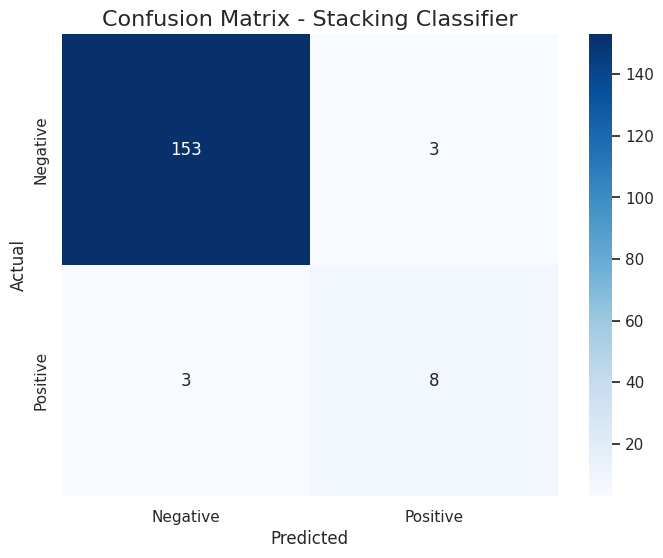

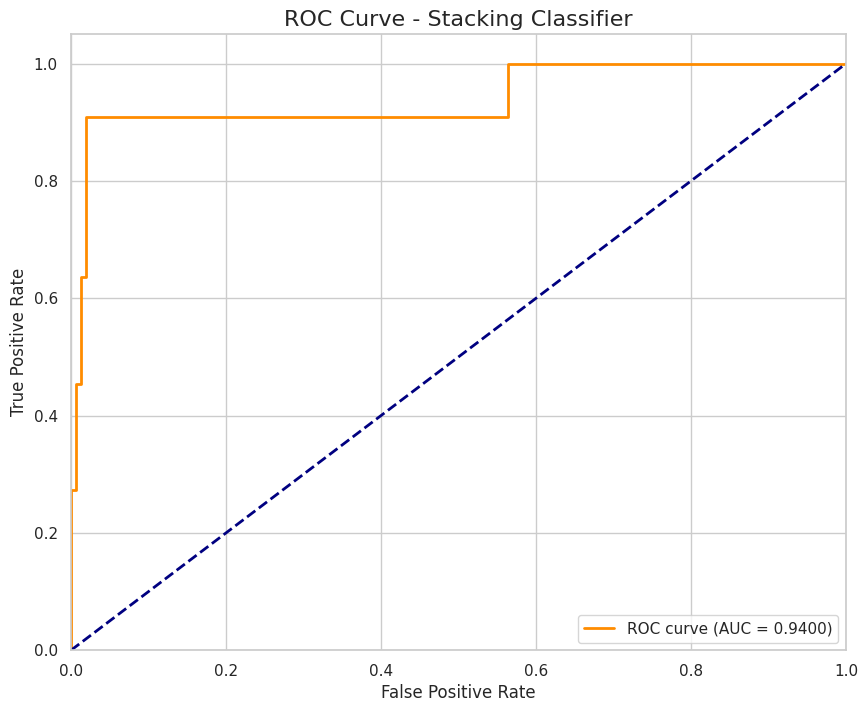

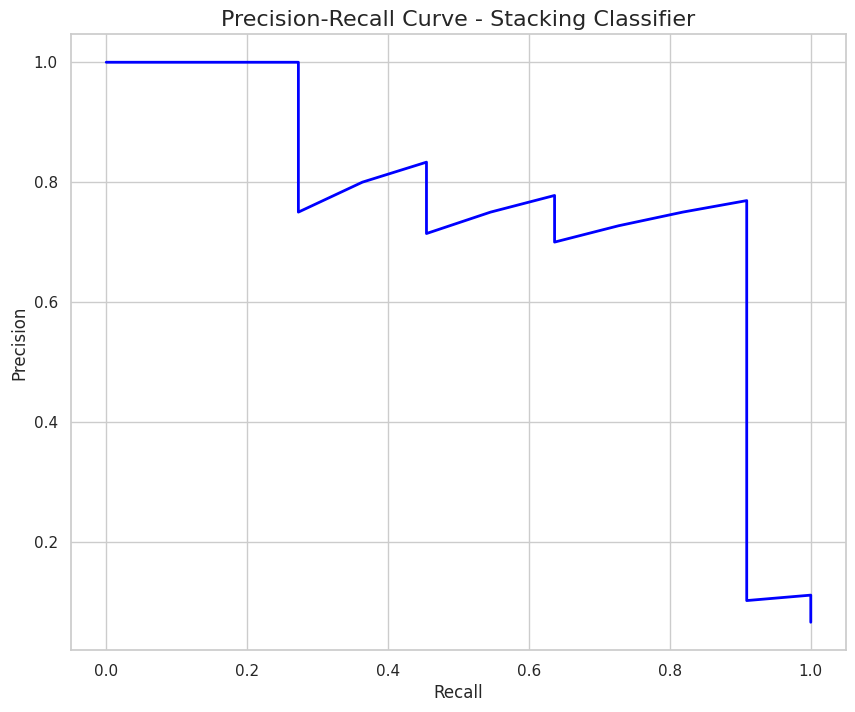

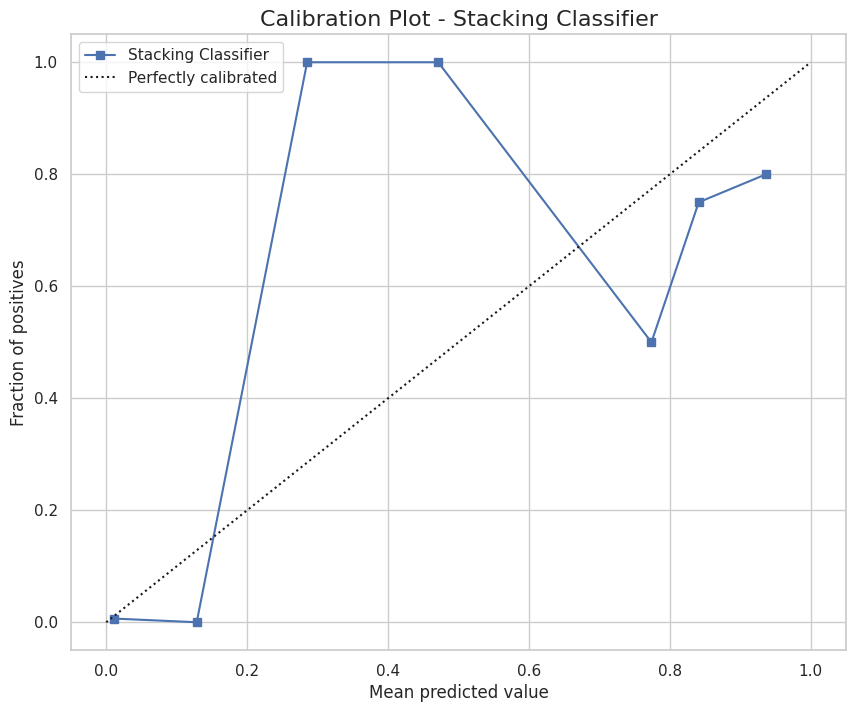

In [41]:
# Detailed evaluation of the best model
best_results = all_models[best_overall_model_name]

# 1. Classification report
print("Classification Report:")
print(classification_report(y_test, best_results['y_pred'], 
                          target_names=['Negative', 'Positive']))

# 2. Confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, best_results['y_pred'])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'], 
            yticklabels=['Negative', 'Positive'])
plt.title(f'Confusion Matrix - {best_overall_model_name}', fontsize=16)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 3. ROC curve
plt.figure(figsize=(10, 8))
fpr, tpr, _ = roc_curve(y_test, best_results['y_pred_proba'])
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {best_results["auc"]:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve - {best_overall_model_name}', fontsize=16)
plt.legend(loc="lower right")
plt.show()

# 4. Precision-Recall curve
plt.figure(figsize=(10, 8))
precision_vals, recall_vals, _ = precision_recall_curve(y_test, best_results['y_pred_proba'])
plt.plot(recall_vals, precision_vals, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve - {best_overall_model_name}', fontsize=16)
plt.show()

# 5. Feature importance (for tree-based models)
if hasattr(best_overall_model, 'feature_importances_'):
    feature_importance = pd.DataFrame({
        'feature': X_engineered.columns,
        'importance': best_overall_model.feature_importances_
    }).sort_values('importance', ascending=False)
    
    plt.figure(figsize=(12, 10))
    sns.barplot(data=feature_importance.head(15), x='importance', y='feature', palette='viridis')
    plt.title(f'Top 15 Feature Importances - {best_overall_model_name}', fontsize=16)
    plt.xlabel('Importance')
    plt.show()

# 6. SHAP values for model interpretation
if best_overall_model_name in ['XGBoost', 'LightGBM', 'CatBoost', 'Random Forest', 'Gradient Boosting']:
    # Create SHAP explainer
    if best_overall_model_name == 'XGBoost':
        explainer = shap.TreeExplainer(best_overall_model)
    elif best_overall_model_name == 'LightGBM':
        explainer = shap.TreeExplainer(best_overall_model)
    elif best_overall_model_name == 'CatBoost':
        explainer = shap.TreeExplainer(best_overall_model)
    else:
        explainer = shap.TreeExplainer(best_overall_model)
    
    # Calculate SHAP values for a sample
    X_sample = X_test.sample(100, random_state=42)
    shap_values = explainer.shap_values(X_sample)
    
    # Summary plot
    plt.figure(figsize=(12, 10))
    shap.summary_plot(shap_values, X_sample, plot_type="bar", show=False)
    plt.title(f'SHAP Feature Importance - {best_overall_model_name}', fontsize=16)
    plt.show()
    
    # Beeswarm plot
    plt.figure(figsize=(12, 10))
    shap.summary_plot(shap_values, X_sample, show=False)
    plt.title(f'SHAP Beeswarm Plot - {best_overall_model_name}', fontsize=16)
    plt.show()

# 7. Model calibration
from sklearn.calibration import calibration_curve

plt.figure(figsize=(10, 8))
fraction_of_positives, mean_predicted_value = calibration_curve(
    y_test, best_results['y_pred_proba'], n_bins=10)

plt.plot(mean_predicted_value, fraction_of_positives, "s-", label=f"{best_overall_model_name}")
plt.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
plt.ylabel("Fraction of positives")
plt.xlabel("Mean predicted value")
plt.title(f'Calibration Plot - {best_overall_model_name}', fontsize=16)
plt.legend()
plt.show()